In [1]:
import pandas as pd
pd.options.display.max_columns = None
pd.options.display.max_rows = None
import matplotlib.pyplot as plt
import nltk
nltk.download('punkt')
from nltk.tokenize import sent_tokenize     # Sentences
from nltk.tokenize import word_tokenize     # Words
from nltk.probability import FreqDist       # Evaluación de frecuencia
from nltk.corpus import stopwords           # Stopwords
nltk.download('stopwords')
import warnings
warnings.filterwarnings('ignore')
import stanza
stanza.download(lang="es")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\MARIAFLOREZ\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MARIAFLOREZ\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


2022-03-26 10:29:59 INFO: Downloading default packages for language: es (Spanish)...
2022-03-26 10:30:04 INFO: File exists: C:\Users\MARIAFLOREZ\stanza_resources\es\default.zip.
2022-03-26 10:30:10 INFO: Finished downloading models and saved to C:\Users\MARIAFLOREZ\stanza_resources.


In [2]:
nlp = stanza.Pipeline("es")

2022-03-26 10:30:10 INFO: Loading these models for language: es (Spanish):
| Processor | Package |
-----------------------
| tokenize  | ancora  |
| mwt       | ancora  |
| pos       | ancora  |
| lemma     | ancora  |
| depparse  | ancora  |
| ner       | conll02 |

2022-03-26 10:30:10 INFO: Use device: cpu
2022-03-26 10:30:10 INFO: Loading: tokenize
2022-03-26 10:30:13 INFO: Loading: mwt
2022-03-26 10:30:13 INFO: Loading: pos
2022-03-26 10:30:14 INFO: Loading: lemma
2022-03-26 10:30:14 INFO: Loading: depparse
2022-03-26 10:30:14 INFO: Loading: ner
2022-03-26 10:30:16 INFO: Done loading processors!


### Convertir a .txt

In [3]:
"""import fitz
global archivo
archivo = ["Colombia y la Nueva Revolución - Propuestas del Foco de Tecnologías Convergentes e Industrias 4.0.pdf", 
           "Industria 4.0, transformación empresarial para la reactivación económica.pdf", 
           "Lineamientos y recomendaciones para la construcción de una política de industrias 4.0.pdf", 
           "Plan Estratégico de Tecnologías de la Información.pdf",
           "Analitica.pdf", 
           "Aspectos básicos de la industria 4.0.pdf", 
           "foro Industria 4.0 y sostenibilidad.pdf", 
           "1Informa de la ENCUESTA DE TRANSFORMACIÓN DIGITAL 2019.pdf", 
           "La Industria 4.0 y la educación.pdf", 
           "Lineamientos para el desarrollo de la economía digital en Santander mediante las industrias 4.0.pdf", 
           "Pacto por la transformación digital de Colombia.pdf", 
           "Habilidades Digitales en Colombia.pdf", 
           "LA CUARTA REVOLUCIÓN TECNOLÓGICa un nuevo paradigma.pdf", 
           "POLÍTICA PARA LA REACTIVACIÓN, LA REPOTENCIACIÓN Y EL CRECIMIENTO SOSTENIBLE E INCLUYENTE NUEVO COMPROMISO POR EL FUTURO DE COLOMBIA.pdf",
           "Como vamos avanzando en la TD.pdf",
           "Plan tic 2018-2022.pdf",
           "Centro para la Cuarta Revolución Industrial -C4IR- Colombia.pdf",
           "Informe resultados 2020 C4IR.CO.pdf",
           "Las tecnologías de la Revolución Industrial 4.0 en el desarrollo de sectores estratégicos.pdf",
           "Estrategia de formación en el uso de TIC.pdf",
           "Evaluación del sistema digital del país (DECA) Colombia.pdf"]

def conversor(documento):
    for a in archivo: 
        doc = fitz.open(a)
        salida = open(a+".txt", "wb")
        for pagina in doc:
            texto = pagina.getText().encode("utf8")
            salida.write(texto)
            salida.write(b"\n-----\n")
        salida.close()
conversor(archivo)"""

'import fitz\nglobal archivo\narchivo = ["Colombia y la Nueva Revolución - Propuestas del Foco de Tecnologías Convergentes e Industrias 4.0.pdf", \n           "Industria 4.0, transformación empresarial para la reactivación económica.pdf", \n           "Lineamientos y recomendaciones para la construcción de una política de industrias 4.0.pdf", \n           "Plan Estratégico de Tecnologías de la Información.pdf",\n           "Analitica.pdf", \n           "Aspectos básicos de la industria 4.0.pdf", \n           "foro Industria 4.0 y sostenibilidad.pdf", \n           "1Informa de la ENCUESTA DE TRANSFORMACIÓN DIGITAL 2019.pdf", \n           "La Industria 4.0 y la educación.pdf", \n           "Lineamientos para el desarrollo de la economía digital en Santander mediante las industrias 4.0.pdf", \n           "Pacto por la transformación digital de Colombia.pdf", \n           "Habilidades Digitales en Colombia.pdf", \n           "LA CUARTA REVOLUCIÓN TECNOLÓGICa un nuevo paradigma.pdf", \n    

### Cargar textos

In [4]:
def apertura_docs(docus):
    lista_docs = []
    for d in docus:
        f = open(d, encoding="utf8")
        raw = f.read()
        lista_docs.append(raw)
    return(lista_docs)

In [466]:
documentos = ["Colombia y la Nueva Revolución - Propuestas del Foco de Tecnologías Convergentes e Industrias 4.0.pdf.txt", 
              "Industria 4.0, transformación empresarial para la reactivación económica.pdf.txt", 
              "Lineamientos y recomendaciones para la construcción de una política de industrias 4.0.pdf.txt", 
              "Plan Estratégico de Tecnologías de la Información.pdf.txt", 
              "Analitica.pdf.txt", 
              "Aspectos básicos de la industria 4.0.pdf.txt", 
              "foro Industria 4.0 y sostenibilidad.pdf.txt", 
              "Informa de la ENCUESTA DE TRANSFORMACIÓN DIGITAL 2019.pdf.txt", 
              "La Industria 4.0 y la educación.pdf.txt", 
              "Lineamientos para el desarrollo de la economía digital en Santander mediante las industrias 4.0.pdf.txt", 
              "Pacto por la transformación digital de Colombia.pdf.txt",
              "Habilidades Digitales en Colombia.pdf.txt", 
              "LA CUARTA REVOLUCIÓN TECNOLÓGICa un nuevo paradigma.pdf.txt",
              "POLÍTICA PARA LA REACTIVACIÓN, LA REPOTENCIACIÓN Y EL CRECIMIENTO SOSTENIBLE E INCLUYENTE NUEVO COMPROMISO POR EL FUTURO DE COLOMBIA.pdf.txt",
              "Como vamos avanzando en la TD.pdf.txt",
              "Plan tic 2018-2022.pdf.txt",
              "Centro para la Cuarta Revolución Industrial -C4IR- Colombia.pdf.txt", 
              "Informe resultados 2020 C4IR.CO.pdf.txt",
              "Las tecnologías de la Revolución Industrial 4.0 en el desarrollo de sectores estratégicos.pdf.txt",
              "Estrategia de formación en el uso de TIC.pdf.txt",
              "Evaluación del sistema digital del país (DECA) Colombia.pdf.txt"]

doc = apertura_docs(documentos)


In [6]:
n1 = apertura_docs(documentos)[0]
n2 = apertura_docs(documentos)[1]
n3 = apertura_docs(documentos)[2]
n4 = apertura_docs(documentos)[3]
n5 = apertura_docs(documentos)[4]
n6 = apertura_docs(documentos)[5]
n7 = apertura_docs(documentos)[6]
n8 = apertura_docs(documentos)[7]
n9 = apertura_docs(documentos)[8]
n10 = apertura_docs(documentos)[9]
n11 = apertura_docs(documentos)[10]
n12 = apertura_docs(documentos)[11]
n13 = apertura_docs(documentos)[12]
n14 = apertura_docs(documentos)[13]
n15 = apertura_docs(documentos)[14]
n16 = apertura_docs(documentos)[15]
n17 = apertura_docs(documentos)[16]
n18 = apertura_docs(documentos)[17]
n19 = apertura_docs(documentos)[18]
n20 = apertura_docs(documentos)[19]
n21 = apertura_docs(documentos)[20]

In [7]:
#Extraer texto útil

def filtro(url, inicio, final):
    pos_ini = url.index(inicio)
    pos_fin = url.index(final)
    
    txt = url[pos_ini:(pos_fin + len(final))]
    
    return(txt)

In [8]:
N = [(n1, "Se trata de un informe \nacadémico enriquecido por la creatividad", "un país soportado en el conocimiento."),
     (n1, "cuarta revolución industrial, sin duda, es uno de los términos", "sostenido de la cuarta revolución industrial."),
     (n1, "objetivo del foco temático de Tecnologías Convergentes", "a continuación, se sigue una breve descripción de esta Arquitectura"),
     (n1, "elementos de tecnologías y disciplinas relacionadas no solo con", "Gran Colombia ambientalmente sostenible."),
     (n1, "La promesa completa de las capas horizontales descritas", "sostenible y reconocida mundialmente como tal."),
     (n1, "química verde es uno de los sectores promisorios para la", "en esta materia es muy rápida"),
     (n1, "próxima generación de materiales avanzados será verde. Ellos", "una productividad más efciente y efcaz"),
     (n1, "diferencia de las técnicas de manufacturas tradicionales,", "en América Latina."),
     (n1, "Las universidades colombianas, públicas", "Max Planck en Alemania, y los Laboratorios Nacionales"),
     (n1, "tecnologías convergentes y las industrias 4.0 contribuyen", "innovación e inclusión social"),
     (n1, "\nLa Sociedad Fraunhofer es un motor alemán e internacional de ", "\nsetenta años, posible modelo seguir Colombia."),
     (n1, "nanotecnología cuatro aristas hoy conoce", "basada en lo que ofrecen las tecnologías convergentes"),
     (n1, "cuarta revolución industrial representa uno de los temas", "investigación en las áreas del foco"),
     (n1, "Uno de los grandes temas en este pilar de la educación", "0,05% de la población total de empleados."),
     (n1, "En el marco del desarrollo de la misión de Sabios,", "dominancia del área del software, la robótica y la analítica de datos."),
     (n1, "Colciencias indica que de 1.478 empresas colombianas catalogadas", "recorrer en términos de educación básica y productividad económica."),
     (n1, "la importancia de la discusión con los actores", "Villavicencio y CODALTEC, corporación de alta tecnología."),
     (n1, "El foro regional para los Santanderes se llevó a cabo en la sede", "la región y el país."),
     (n1, "La comunidad convocada reconoce de manera unánime, en las relatorías", "obstáculos declarados."),
     (n2, "pandemia por coronavirus", " las condiciones futuras."), 
     (n2, "del conjunto de", " en el Diagrama 1."),
     (n2, "a dinámica y consolidación", "sus oportunidades de negocio."), 
     (n2, "En Colombia, 43 de cada 100 empresas ", " con el 10% en el mismo periodo"),
     (n2, "Como se ha indicado en estudios ant", "mente al cabo de cinco años."),
     (n2, "Una situación similar pueden afrontar", "mayor competitividad para el país."),
     (n3, "La Cuarta Revolución Industrial se presenta a la vez como oportunidad y", "Lineamientos de Política y Recomendaciones."),
     (n3, "La Cuarta Revolución Industrial transforma los sistemas de producción", "gobierno como insumo y objeto de la política de innovación"),
     (n3, "Así mismo, existen tres objetivos comunes a todos los desarrollos de política", "coordinación para apoyar al sector empresarial."),
     (n3, "Por otro lado, Colombia también ha desarrollado instrumentos", "relacionados con tecnologías 4.0."),
     (n3, "El impacto de la Cuarta Revolución Industrial es pronunciado", "recomendaciones de política para superar dichos desafíos"),
     (n3, "El concepto de Industria 4.0 hace referencia a un nuevo", "inteligente."), 
     (n3, "No existe un consenso sobre cuáles son las tecnologías", "producción (Boston Consulting Group, 2020)."),
     (n3, "A pesar de los beneficios, las empresas enfrentan barreras en la adopción", "de formación, particularmente para disciplinas STEM."),
     (n3, "Esta subsección expone la situación de las empresas colombianas frente", "inteligencia artificial o aplicaciones de internet de las cosas."),
     (n3, "Esta sección caracteriza la situación del país frente al acceso y", "para el desarrollo de la industria 4.0 en el país."),
     (n3, "Este capítulo estructura los lineamientos generales bajo", "desarrollados y aplicados."),
     (n3, "Colombia debe estructurar una estrategia nacional", "investigación (Ren, 2016)."),
     (n3, "Colombia debe identificar los sectores industriales que presenten", ", datos y servicios y la integración vertical y horizontal."),
     (n3, "Colombia debe continuar con la implementación", "de inversión."),
     (n3, "A través del MEN y MinTIC, se sugiere elaborar programas", "necesidades del sector industrial"),
     (n3, "Entidades como DNP y MinCiencias necesitan", "permitiendo el adecuado desarrollo de la estrategia."),
     (n3, "Realizar subastas de permisos de uso del espectro", "la materia. "),
     (n4, "El análisis de la situación actual, tiene como base el reciente plan nacional de desarrollo", "actualiza y fundamenta el presente plan estratégico."),
     (n4, "Rotación de personal calificado", "Plan de Mantenimiento preventivo sobre la infraestructura."),
     (n4, "Con el desarrollo del plan de trabajo de TI durante los últimos años, se ha logrado", "Identificar proyectos que permitan la innovación y la transformación de la Entidad."),
     (n5, "Colombia, una de cada tres empresas se", "y fortalezas en este camino."),
     (n5, "En las últimas décadas se ha evidenciado un", "general que permite esta nueva era tecnológica."),
     (n5, "A lo largo de los años, la economía en Colombia", "crecen de manera más estable e innovadora"),
     (n5, "La inversión en investigación y desarrollo (I+D)", "industrial (Basco, Beliz, Coatz & Garnero, 2018)."),
     (n5, "El segundo desafío está relacionado con una", "\nsu clasifcación de innovación y uso tecnológico."),
     (n5, "Si bien es evidente que la innovación tecnológica", "que funcione bien y que proteja a los trabajadores"),
     (n5, "\nComúnmente, la bibliografía refere", "interés directos e indirectos."),
     (n5, "Las mipymes son actores claves en la economía", "valor incorporando elementos diferenciadores."),
     (n5, "En un escenario en el que la mayoría de las", "tos empresariales."), 
     (n5, "En respuesta a todas las barreras que han ", "propia de cada actor, entre otros."),
     (n5, "La primera fase de la estrategia, ejecutada entre 2018 y 2019", "una herramienta para mejorar el desempeño."),
     (n5, "programa N.EX.T surgió como una", "el seguimiento de las acciones realizadas."),
     (n5, "Durante el 2020, la economía se ha", "Work University y Mews."), 
     (n5, "Ahora bien, en cuanto a las cadenas de", "Kiwibot y Sigma Ingeniería."), 
     (n5, "La etapa de producción se ve influenciada", "NotCo y PMTEC."),
     (n5, "La industria 4.0 tiene un fuerte enfoque", "El Comedor Digital, Raflaamo y Camon App."), 
     (n5, "Finalmente, como se evidencia a lo largo de", "sional de las personas”."),
     (n5, "Gobierno nacional, en alianza con la", "personas se formen en tal sentido. "),
     (n6, "La industria 4.0 es una nueva esfera de la industria que aparece como un resultado del", " la complejidad de este fenómeno multifacético."),
     (n6, "la Industria 4.0 se define como un", "Negocios que monetizan datos."),
     (n6, "La industria 4.0 es, al igual que las tres previas revoluciones", "inteligencia artificial y aprendizaje automático"), 
     (n6, "Es importante también reconocer y evaluar los efectos económicos", "ambas partes."),
     (n6, "La visión de la Industria 4.0 es que, en el futuro,", "de los sistemas de producción."),
     (n6, "La Industria 4.0 se desencadena por tecnologías digitales ", "ya que ellas penetran muchas áreas sociales y económicas"),
     (n6, "Un criterio fundamental para un modelo de madurez adecuado", "relación costo-beneficio correcta"),
     (n6, "Las habilidades que son relevantes para la transformación digita", "decisiones basadas en el conocimiento"),
     (n6, "Lo que se desprende del análisis planteado es que la implementación", "amenazados por el desempleo"),
     (n7, "Escuchamos hablar sobre la Cuarta Revolución Industrial en todas partes", "conecten, interactúen e intercambien datos."),
     (n7, "Todo lo que pasa en la ciudad se puede convertir", "Este tema nos toca en la cotidianidad."),
     (n7, "La inteligencia artificial (IA) es una tecnología que a", "contribuyen al bienestar de todos."),
     (n7, "¿Cómo puede afectar/beneficiar a las mujeres", "Mujer y Género de la Gobernación de Antioquia."),
     (n7, "¿Por qué se relaciona el talento digital" ,"la industria de la sostenibilidad."),
     (n7, "¿Qué es Ciudadanía digital?", "comunidades."),
     (n7, "¿Por qué vincular el emprendimiento y", " asuntos sociales, los empleados y el medio"),
     (n7, "¿Qué es blockchain y cuáles retos del desarrollo", "apoyando la conservación y un desarrollo rural"),    
     (n8, "En enero del 2016, el Foro Económico Mundial de 2016 dedicó una agenda exclusiva", "materializar los cambios."),
     (n8, "respondió positivamente respecto a la pregunta", "ingresos/disminución de costos y el 22,2% utiliza la eficiencia en los procesos"),
     (n8, "Las sociedades han atravesado diferentes revoluciones industriales", "respectivamente, frente 32% y el 36% que sí han cuantificado su impacto"),
     (n8, "Existe una gran diversidad de razones por las cuales las empresas desean", "y en el sector servicios representan el 83,6%"),
     (n8, "A diferencia de las encuestas de transformación digital de los años anteriores", " y el 45,4% en formación especializada"),
     (n8, "Otro factor que se incluyó en la encuesta de transformación digital 2019 fue el tema", "similares como se puede observar en la siguiente gráfica."),
     (n9, "Desde que se formuló por primera vez en el año 2011 en la Feria de Hannover en Alemania", "superior a pensar y plantear estrategias encaminadas a:"),
     (n10, "Los avances de la economía digital en el ámbito", "Todos ellos bajo una visión mundial, nacional y departamental."), 
     (n10, "De acuerdo con la información del Mintic (2019)", "dentro de los más bajos del país."),
     (n10, "En Santander existe un CTDE, ubicado", "temprano y manejo de los pacientes con"),
     (n10, "El Índice de Comercio Electrónico, elaborado", "ampliar la cobertura en transformación digital."),
     (n10, "Los avances del sector industrias 4.0 en Santander han sido pocos", "(Living Atlas Esri, 2020)."),
     (n10, "Para el Foro Económico Mundial (FEM), la competitividad es “el conjunto", "calidad en los servicios."),
     (n10, "Uno de los pilares para la transformación es la educación", "Metodología de la Investigación, entre otros"),
     (n10, "Como parte del ejercicio de recopilar información valiosa", "evaluaciones de desempeño de las empresas"),
     (n10, "La apuesta por la economía digital es sin duda la mayor", "población en la usabilidad del internet"),
     (n10, "Uno de los principales retos que afrontan los gobiernos en", "presenta en los anexos adjuntos."),
     (n11, "\n4\nLas TIC impulsan la productividad\nTecnologías", "una sociedad digital e industria 4.0: por una relación más eficiente, efectiva y transparente \nentre mercados, ciudadanos y Estado\n\n-----"),
     (n11, "\nEl cierre de la brecha \ndigital entre ", "\nmunicipios PDET conectadas a Internet de alta \nvelocidad"),
     (n11, "La transformación digital es", "de Arquitectura de Gobierno Digital."),
     (n12, "Si bien muchas entidades tienen impacto en la implementación", " Oracle, AWS, LinkedIn, Siemens, SAP, entre otros."),
     (n12, "Existen cientos de instituciones de educación no formal", " le asignan un rango a los bootcamps"),
     (n12, "Como los cursos de educación no formal no reciben ninguna certificación", "atraer talento en tecnología."),
     (n12, "Otro de los actores importantes en materia de habilidades digitales son los gremios.", "de capacitación corporativa, una de ellas colombiana: UBITS"),
     (n12, "Para el estudio de las políticas públicas en materia de habilidades digitales", "de acceso digital en Colombia."),
     (n12, "Colombia debe encaminarse hacia una sociedad digital y hacia la industria 4.0", "desarrollo de aplicativos web y móviles."),
     (n12, "A pesar de ser una economía estable y presentar un crecimiento económico superior", "cuentan con una conexión cuya velocidad supere los 30 megabits por segundo."),
     (n12, "La presente sección evalúa la implementación y uso de herramientas tecnológicas", "tener presencia digital y contar con habilidades TIC."),
     (n12, "4.2\nMEDICIÓN DE LAS BRECHAS DE  \nCAPITAL HUMANO EN EL SECTOR TIC\nSegún la Comisión Económica para América Latina – CEPAL", "debilidades con respecto al desempeño esperado por la empresa."),
     (n13, "La primera década del siglo XXI ha estado marcada por el uso", "en el gasto público"),
     (n13, "El big data hace referencia a las “diferentes tecnologías", "de manera efectiva en los asuntos"),
     (n14, "Colombia aún presenta bajas capacidades innovadoras sumadas a una desconexión entre", " dice conocer o utilizar alguna de las tecnologías asociadas a esta."),
     (n14, "Colombia ha tenido una constante evolución en la incorporación de las TIC para mejorar la", "la industria Govtech."),
     (n14, "Primero, se avanzará en la consolidación de espacios colaborativos entre las IES y el sector", "revolución industrial y la hoja de ruta para su implementación."),
     (n14, "Con el propósito de promover la innovación y adopción tecnológica para incrementar la", "escalará el alcance de la estrategia actual en varios sectores."),
     (n14, "La pandemia evidenció y profundizó la necesidad que tiene el país de continuar avanzando", "Esta actividad iniciará y finalizará en 2021."),
     (n15, "En la transformación digital existe la convergencia de distintas tecnologías", "0527 de 1999)."),
     (n15, "De acuerdo con los ejes de una sociedad", "aeropuertos y pasos fronterizos."),
     (n15, "Con el objetivo de que el Gobierno se", "nente medioambiental."),
     (n15, "Estas dos perspectivas", "combustibles y energía."),
     (n15, "Los procesos de digitalización, la adopción de", "Creación de la "),
     (n16, "Colombia debe encaminarse hacia una sociedad digital y hacia la industria 4.0", "la prestación de servicios del"),
     (n16, "Desarrollo, uso y aplicación de ciencia", "tecnología e innovación aplicada, en el cuatrienio."),
     (n16, "Esta iniciativa que tiene como objetivo aumentar el grado de adopción", "tres proyectos basados en Blockchain, IoT e IA"), 
     (n16, "Apps.co, tiene como propósito promover la creación", "y al menos 80 durante el"),
     (n16, "Este proyecto tiene como objetivo generar y fortalecer las habilidades", "se busca formar a 60.000 personas"),
     (n17, "Hoy en día, la sociedad está siendo desafiada por la Cuarta Revolución Industrial, un momento en la", "objetivo: mejorar la equidad"),
     (n17, "En solo tres meses, Sofasa dio el salto hacia la transformación digital: 50 robots", "y usado tradicionalmente en celdas"),
     (n17, "IA en el sector público: existen amplias posibilidades", "privacidad individual."),
     (n18, "El 2020 a su vez, representaba el inicio de lo que la ONU ha denominado", "y la apropiación de las mismas"),
     (n18, "El uso de los datos y su aprovechamiento a través de sistemas de inteligencia artificial", "las recomendaciones de política pública"),
     (n18, "Una de las principales razones de ser del C4IR.CO es habilitar", " de Costa Rica e Intel como miembro del C4IR.CO"),
     (n18, "Hemos avanzado en el desarrollo de nuestra estrategia de Cultura y", "Insumos para la construcción de una hoja de ruta"),
     (n18, "El uso de los datos y su aprovechamiento a través de sistemas de IA", "inmediatos sino con una visión de impacto a más largo plazo"),
     (n18, "La Cuarta Revolución Industrial se puede describir como el grupo", "para así poder transformar el mundo."),
     (n19, "\nCon el objeto de dar un panorama de las industrias 4.0 \n", "pero al fnal el balance es positivo en ciertos"),
     (n19, "\nExperiencias recientes industria 4.0 materializadas", "cercanas al 5% del PIB."),
     (n19, "Recientemente, el término de economía naranja se ha ", "puede ser líder global en la creación de contenidos."),
     (n19, "\nLa FriedrichEbertStiftung sugiere que se contemplen", "nuestros satélites de pequeño tamaño."),
     (n19, "\nEn mi experiencia como evaluadora de proectos de in\nvestigación ", "de pmes para contratar con el Estado."), 
     (n19, "\nMe he esforzado en presentar un texto que no sea", "permite crear altos estándares calidad"),
     (n20, "\nEl Gobierno Nacional a través Ministerio Tecnologías ", "\nel uso las TIC, la creación empresas en el sector científico-tecnológico"),
     (n20, "\nEl concepto brecha digital es un concepto complejo", "ubicadas en diferentes regiones"),
     (n21, "propósito de la Estrategia Digital de USAID es", "adaptada a las prioridades programáticas de USAID."),
     (n21, "Si bien la DECA de Colombia se realizó antes de la propagación", "establecer sistemas que puedan dar respuestas adecuadas"),
     (n21, "A nivel nacional, se considera que Colombia tiene casi una paridad de género en cuanto", "posiblemente profundice la brecha digital en función del género."),
     (n21, "Una economía digital analiza la forma en que las personas pueden usar dinero", "aún no queda muy claro cuál será su impacto."),
     (n21, "\nLas personas entrevistadas, tanto del sector privado como del gobierno, destacaron la", "ni están califcadas para trabajar en el campo de \nlas TIC.")]

documentos = []

for n in N:
    documentos.append(filtro(n[0], n[1], n[2]))

documentos


['Se trata de un informe \nacadémico enriquecido por la creatividad y el análisis individual de quien \nestá narrando. En nuestra calidad de relatores del Foco de Tecnologías \nConvergentes e Industrias 4.0, queremos introducir este libro narrando \nla experiencia vivida por el equipo de los comisionados, los secretarios \n\n-----\n44\nColombia y la nueva revolución industrial\ny los invitados a la discusión, y de todos aquellos que participamos en el \ndesarrollo de esta misión trascendental.\nEl balance presentado por parte del Gobierno nacional en el discurso \nde apertura de la misión marcó una dirección muy clara: la importancia \nde analizar la relación entre las políticas del Sistema de Ciencia, Tecno-\nlogía e Innovación y el sector productivo en Colombia. Al observar los \nresultados de la primera misión, y en medio del conjunto de sus logros, \nespecialmente relacionados con temas de formación de capital humano, \nnúmero de grupos de investigación y producción académica, se i

### Preprocesamiento de los datos

In [9]:

#eliminar tildes y convertir palabras en minúscula
def tildes(s):
    replacements = (
        ("á", "a"),
        ("é", "e"),
        ("í", "i"),
        ("ó", "o"),
        ("ú", "u"),
    )
    for a, b in replacements:
        s = s.replace(a, b).replace(a.upper(), b.upper())
    return s

tilde = []
for txt in documentos:
    palabras = txt.lower() #Minúsculas
    tilde.append(tildes(palabras))
tilde

['se trata de un informe \nacademico enriquecido por la creatividad y el analisis individual de quien \nesta narrando. en nuestra calidad de relatores del foco de tecnologias \nconvergentes e industrias 4.0, queremos introducir este libro narrando \nla experiencia vivida por el equipo de los comisionados, los secretarios \n\n-----\n44\ncolombia y la nueva revolucion industrial\ny los invitados a la discusion, y de todos aquellos que participamos en el \ndesarrollo de esta mision trascendental.\nel balance presentado por parte del gobierno nacional en el discurso \nde apertura de la mision marco una direccion muy clara: la importancia \nde analizar la relacion entre las politicas del sistema de ciencia, tecno-\nlogia e innovacion y el sector productivo en colombia. al observar los \nresultados de la primera mision, y en medio del conjunto de sus logros, \nespecialmente relacionados con temas de formacion de capital humano, \nnumero de grupos de investigacion y produccion academica, se i

In [10]:
#Eliminar Saltos de línea
parrafos = [i.replace("\n", " ") for i in tilde]

In [11]:
#Eliminar números
newdoc = []
for documento in parrafos:
    x = "".join([i for i in str(documento) if not i.isdigit()])
    newdoc.append(x)

In [12]:
#Eliminar caracteres especiales
import re
patron = "[\W]+"
regex = re.compile(patron)

result = []
for documento in newdoc:
    resultado = regex.sub(' ', documento)
    result.append(resultado)


In [14]:
# orden lista por Menor a mayor longitud (ascendente):

result_ord = sorted(result, key=len)


In [15]:
for txt in result_ord:
    print(len(txt))

876
1109
1272
1382
1421
1580
1683
1797
1851
1981
1985
2108
2110
2179
2250
2600
2659
2687
2712
2774
2870
2880
2952
2957
3025
3090
3258
3282
3332
3444
3457
3465
3504
3526
3526
3586
3672
3708
3719
3748
3784
3808
3881
3909
3952
3987
4001
4022
4090
4110
4113
4373
4657
4701
4835
4891
4914
4973
4994
5003
5072
5103
5137
5216
5277
5319
5387
5411
5460
5489
5498
5499
5499
5507
5573
5645
5776
5828
5855
5890
6118
6179
6474
6564
6624
6716
6734
6765
6853
6986
6993
7054
7112
7548
7579
7629
7679
7817
7851
7971
8157
8247
8269
8290
8339
8380
8455
8511
8538
8541
8725
8920
8986
9056
9063
9097
9134
9172
9199
9246
9296
9315
9321
9429
9547
9746
9778
9830
9872
10023
10143
10201
10218
10365
10449
10572
10580
10701
11041
11069
11077
11450
11547
11559
11563
11727
11963
11994


In [18]:
#Lemmatización bloque cero
lemas_0 = {}
for i in range(0,60):
    notic_0 = nlp(result_ord[i])
    for sent in notic_0.sentences:
        for word in sent.words:
            if i not in lemas_0:
                lemas_0[i]=[]
                lemas_0[i].append(word.lemma)
            else:
                lemas_0[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: ahora 	lemma: ahora
word: bien 	lemma: bien
word: en 	lemma: en
word: cuanto 	lemma: cuanto
word: a 	lemma: a
word: las 	lemma: el
word: cadenas 	lemma: cadena
word: de 	lemma: de
word: suminis 	lemma: suminis
word: tro 	lemma: tro
word: estas 	lemma: este
word: tradicionalmente 	lemma: tradicionalmente
word: son 	lemma: ser
word: lineales 	lemma: lineal
word: pues 	lemma: pues
word: el 	lemma: el
word: proceso 	lemma: proceso
word: suele 	lemma: soler
word: empezar 	lemma: empezar
word: en 	lemma: en
word: el 	lemma: el
word: diseño 	lemma: diseño
word: seguido 	lemma: seguido
word: de 	lemma: de
word: la 	lemma: el
word: planifcacion 	lemma: planifcacion
word: fabricacion 	lemma: fabricacion
word: entrega 	lemma: entrega
word: y 	lemma: y
word: soporte 	lemma: soporte
word: sin 	lemma: sin
word: embargo 	lemma: embargo
word: gracias 	lemma: gracias
word: a 	lemma: a
word: la 	lemma: el
word: tecnologia 	lemma: tecnologia
word: muchas 	lemma: mucho
word: cadenas 	lemma: cadena
w

word: colombia 	lemma: colombia
word: debe 	lemma: deber
word: continuar 	lemma: continuar
word: con 	lemma: con
word: la 	lemma: el
word: implementacion 	lemma: implementacion
word: de 	lemma: de
word: los 	lemma: el
word: planes 	lemma: plan
word: para 	lemma: para
word: modernizar 	lemma: modernizar
word: la 	lemma: el
word: conectividad 	lemma: conectividad
word: a 	lemma: a
word: internet 	lemma: internet
word: en 	lemma: en
word: el 	lemma: el
word: pais 	lemma: pais
word: en 	lemma: en
word: particular 	lemma: particular
word: acelerar 	lemma: acelerar
word: la 	lemma: el
word: implementacion 	lemma: implementacion
word: de 	lemma: de
word: el 	lemma: el
word: plan 	lemma: plan
word: g 	lemma: g
word: el 	lemma: el
word: plan 	lemma: plan
word: de 	lemma: de
word: transicion 	lemma: transicion
word: a 	lemma: a
word: nuevas 	lemma: nuevo
word: tecnologias 	lemma: tecnologia
word: y 	lemma: y
word: el 	lemma: el
word: plan 	lemma: plan
word: marco 	lemma: marco
word: de 	lemma: d

word: los 	lemma: el
word: procesos 	lemma: proceso
word: de 	lemma: de
word: digitalizacion 	lemma: digitalizacion
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: tecnologia 	lemma: tecnologia
word: el 	lemma: el
word: cambio 	lemma: cambio
word: cultural 	lemma: cultural
word: la 	lemma: el
word: formacion 	lemma: formacion
word: de 	lemma: de
word: talento 	lemma: talento
word: humano 	lemma: humano
word: tienen 	lemma: tener
word: el 	lemma: el
word: potencial 	lemma: potencial
word: de 	lemma: de
word: incrementar 	lemma: incrementar
word: el 	lemma: el
word: crecimiento 	lemma: crecimiento
word: economico 	lemma: economico
word: para 	lemma: para
word: estar 	lemma: estar
word: a 	lemma: a
word: la 	lemma: el
word: vanguardia 	lemma: vanguardia
word: de 	lemma: de
word: los 	lemma: el
word: principales 	lemma: principal
word: desafios 	lemma: desafio
word: locales 	lemma: local
word: regionales 	lemma: regional
word: y 	lemma: y
word: globales 	lemma

word: por 	lemma: por
word: que 	lemma: que
word: vincular 	lemma: vincular
word: el 	lemma: el
word: emprendimiento 	lemma: emprendimiento
word: y 	lemma: y
word: la 	lemma: el
word: sostenibilidad 	lemma: sostenibilidad
word: las 	lemma: el
word: empresas 	lemma: empresa
word: son 	lemma: ser
word: un 	lemma: uno
word: vehiculo 	lemma: vehiculo
word: para 	lemma: para
word: la 	lemma: el
word: solucion 	lemma: solucion
word: de 	lemma: de
word: problemas 	lemma: problema
word: los 	lemma: el
word: sistemas 	lemma: sistema
word: globales 	lemma: global
word: estan 	lemma: estar
word: fallando 	lemma: fallar
word: y 	lemma: y
word: las 	lemma: el
word: empresas 	lemma: empresa
word: deben 	lemma: deber
word: escoger 	lemma: escoger
word: que 	lemma: que
word: tipo 	lemma: tipo
word: de 	lemma: de
word: problema 	lemma: problema
word: quiere 	lemma: querer
word: resolver 	lemma: resolver
word: a 	lemma: a
word: nivel 	lemma: nivel
word: planetario 	lemma: planetario
word: y 	lemma: y
wo

word: para 	lemma: para
word: el 	lemma: el
word: foro 	lemma: foro
word: economico 	lemma: economico
word: mundial 	lemma: mundial
word: fem 	lemma: fem
word: la 	lemma: el
word: competitividad 	lemma: competitividad
word: es 	lemma: ser
word: el 	lemma: el
word: conjunto 	lemma: conjunto
word: de 	lemma: de
word: instituciones 	lemma: institución
word: politicas 	lemma: politico
word: y 	lemma: y
word: factores 	lemma: factor
word: que 	lemma: que
word: determinan 	lemma: determinar
word: el 	lemma: el
word: nivel 	lemma: nivel
word: de 	lemma: de
word: productividad 	lemma: productividad
word: de 	lemma: de
word: un 	lemma: uno
word: pais 	lemma: pais
word: el 	lemma: el
word: fem 	lemma: fem
word: se 	lemma: él
word: encarga 	lemma: encargar
word: de 	lemma: de
word: realizar 	lemma: realizar
word: la 	lemma: el
word: medicion 	lemma: medicion
word: de 	lemma: de
word: la 	lemma: el
word: competitividad 	lemma: competitividad
word: basado 	lemma: basado
word: en 	lemma: en
word: pi

word: el 	lemma: el
word: uso 	lemma: uso
word: de 	lemma: de
word: los 	lemma: el
word: datos 	lemma: dato
word: y 	lemma: y
word: su 	lemma: su
word: aprovechamiento 	lemma: aprovechamiento
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: sistemas 	lemma: sistema
word: de 	lemma: de
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artificial
word: marcan 	lemma: marcar
word: una 	lemma: uno
word: tendencia 	lemma: tendencia
word: constante 	lemma: constante
word: hacia 	lemma: hacia
word: encontrar 	lemma: encontrar
word: soluciones 	lemma: solución
word: basadas 	lemma: basado
word: en 	lemma: en
word: ellos 	lemma: él
word: que 	lemma: que
word: apunten 	lemma: apuntar
word: a 	lemma: a
word: tomar 	lemma: tomar
word: decisiones 	lemma: decisión
word: informadas 	lemma: informado
word: en 	lemma: en
word: diferentes 	lemma: diferente
word: sectores 	lemma: sector
word: sin 	lemma: sin
word: embargo 	lemma: embargo
word: hoy 	lemma: hoy
word: de

word: como 	lemma: como
word: puede 	lemma: poder
word: afectar 	lemma: afectar
word: beneficiar 	lemma: beneficiar
word: a 	lemma: a
word: las 	lemma: el
word: mujeres 	lemma: mujer
word: la 	lemma: el
word: ri 	lemma: ri
word: que 	lemma: que
word: oportunidades 	lemma: oportunidad
word: existen 	lemma: existir
word: la 	lemma: el
word: ri 	lemma: ri
word: a 	lemma: a
word: el 	lemma: el
word: igual 	lemma: igual
word: que 	lemma: que
word: la 	lemma: el
word: equidad 	lemma: equidad
word: de 	lemma: de
word: genero 	lemma: genero
word: son 	lemma: ser
word: megatendencias 	lemma: megatendencia
word: todo 	lemma: todo
word: el 	lemma: el
word: planeta 	lemma: planeta
word: esta 	lemma: este
word: hablando 	lemma: hablar
word: de 	lemma: de
word: incluir 	lemma: incluir
word: a 	lemma: a
word: las 	lemma: el
word: mujeres 	lemma: mujer
word: en 	lemma: en
word: el 	lemma: el
word: mercado 	lemma: mercado
word: laboral 	lemma: laboral
word: y 	lemma: y
word: en 	lemma: en
word: los 	le

word: por 	lemma: por
word: que 	lemma: que
word: se 	lemma: él
word: relaciona 	lemma: relacionar
word: el 	lemma: el
word: talento 	lemma: talento
word: digital 	lemma: digital
word: con 	lemma: con
word: los 	lemma: el
word: objetivos 	lemma: objetivo
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: sostenible 	lemma: sostenible
word: el 	lemma: el
word: talento 	lemma: talento
word: digital 	lemma: digital
word: y 	lemma: y
word: los 	lemma: el
word: ods 	lemma: ods
word: convergen 	lemma: convergir
word: porque 	lemma: porque
word: las 	lemma: el
word: personas 	lemma: persona
word: que 	lemma: que
word: desarrollan 	lemma: desarrollar
word: tecnologia 	lemma: tecnologia
word: deben 	lemma: deber
word: enfocar 	lemma: enfocar
word: se 	lemma: él
word: en 	lemma: en
word: como 	lemma: como
word: integrar 	lemma: integrar
word: esta 	lemma: este
word: con 	lemma: con
word: la 	lemma: el
word: industria 	lemma: industria
word: y 	lemma: y
word: el 	lemma: el
word: ambien

word: la 	lemma: el
word: industria 	lemma: industria
word: tiene 	lemma: tener
word: un 	lemma: uno
word: fuerte 	lemma: fuerte
word: enfoque 	lemma: enfoque
word: en 	lemma: en
word: el 	lemma: el
word: con 	lemma: con
word: sumidor 	lemma: sumidor
word: pues 	lemma: pues
word: durante 	lemma: durante
word: todo 	lemma: todo
word: el 	lemma: el
word: proceso 	lemma: proceso
word: de 	lemma: de
word: la 	lemma: el
word: cade 	lemma: cade
word: na 	lemma: na
word: de 	lemma: de
word: valor 	lemma: valor
word: se 	lemma: él
word: tiene 	lemma: tener
word: en 	lemma: en
word: cuenta 	lemma: cuenta
word: la 	lemma: el
word: informacion 	lemma: informacion
word: de 	lemma: de
word: este 	lemma: este
word: la 	lemma: el
word: cual 	lemma: cual
word: se 	lemma: él
word: recolecta 	lemma: recolectar
word: por 	lemma: por
word: medio 	lemma: medio
word: de 	lemma: de
word: las 	lemma: el
word: tecno 	lemma: tecno
word: logias 	lemma: logia
word: inteligente 	lemma: inteligente
word: asi 	lemma

word: proposito 	lemma: proposito
word: de 	lemma: de
word: la 	lemma: el
word: estrategia 	lemma: estrategia
word: digital 	lemma: digital
word: de 	lemma: de
word: usaid 	lemma: usaid
word: es 	lemma: ser
word: lograr 	lemma: lograr
word: y 	lemma: y
word: mantener 	lemma: mantener
word: ecosistemas 	lemma: ecosistema
word: digitales 	lemma: digital
word: abiertos 	lemma: abierto
word: seguros 	lemma: seguro
word: e 	lemma: e
word: inclusivos 	lemma: inclusivo
word: que 	lemma: que
word: contribuyan 	lemma: contribuir
word: a 	lemma: a
word: la 	lemma: el
word: consecucion 	lemma: consecucion
word: de 	lemma: de
word: resultados 	lemma: resultado
word: medibles 	lemma: medible
word: de 	lemma: de
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: y 	lemma: y
word: de 	lemma: de
word: la 	lemma: el
word: asistencia 	lemma: asistencia
word: humanitaria 	lemma: humanitario
word: y 	lemma: y
word: que 	lemma: que
word: tambien 	lemma: tambien
word: permitan 	lemma: permitir
wo

word: hemos 	lemma: haber
word: avanzado 	lemma: avanzar
word: en 	lemma: en
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: nuestra 	lemma: nuestro
word: estrategia 	lemma: estrategia
word: de 	lemma: de
word: cultura 	lemma: cultura
word: y 	lemma: y
word: apropiacion 	lemma: apropiacion
word: con 	lemma: con
word: el 	lemma: el
word: fin 	lemma: fin
word: de 	lemma: de
word: crear 	lemma: crear
word: acciones 	lemma: acción
word: que 	lemma: que
word: apunten 	lemma: apuntar
word: a 	lemma: a
word: un 	lemma: uno
word: mayor 	lemma: mayor
word: entendimiento 	lemma: entendimiento
word: y 	lemma: y
word: aprovechamiento 	lemma: aprovechamiento
word: por 	lemma: por
word: parte 	lemma: parte
word: de 	lemma: de
word: los 	lemma: el
word: diferentes 	lemma: diferente
word: publicos 	lemma: publico
word: de 	lemma: de
word: interes 	lemma: inter
word: de 	lemma: de
word: los 	lemma: el
word: beneficios 	lemma: beneficio
word: de 	lemma: de
word: la 	lem

word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: grandes 	lemma: grande
word: temas 	lemma: tema
word: en 	lemma: en
word: este 	lemma: este
word: pilar 	lemma: pilar
word: de 	lemma: de
word: la 	lemma: el
word: educacion 	lemma: educacion
word: y 	lemma: y
word: de 	lemma: de
word: el 	lemma: el
word: recurso 	lemma: recurso
word: hu 	lemma: hu
word: mano 	lemma: mano
word: se 	lemma: él
word: refere 	lemma: referar
word: a 	lemma: a
word: la 	lemma: el
word: formacion 	lemma: formacion
word: de 	lemma: de
word: profesionales 	lemma: profesional
word: tecnicos 	lemma: tecnico
word: y 	lemma: y
word: tecnologos 	lemma: tecnologo
word: en 	lemma: en
word: ese 	lemma: ese
word: sentido 	lemma: sentido
word: las 	lemma: el
word: cifras 	lemma: cifra
word: en 	lemma: en
word: colombia 	lemma: colombia
word: son 	lemma: ser
word: positivas 	lemma: positivo
word: pues 	lemma: pues
word: entre 	lemma: entrar
word: y 	lemma: y
word: el 	lemma: el
word: numero 	lemma: numer

word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: se 	lemma: él
word: presenta 	lemma: presentar
word: a 	lemma: a
word: la 	lemma: el
word: vez 	lemma: vez
word: como 	lemma: como
word: oportunidad 	lemma: oportunidad
word: y 	lemma: y
word: desafio 	lemma: desafio
word: para 	lemma: para
word: la 	lemma: el
word: economia 	lemma: economia
word: colombiana 	lemma: colombiano
word: por 	lemma: por
word: un 	lemma: uno
word: lado 	lemma: lado
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: adaptacion 	lemma: adaptacion
word: y 	lemma: y
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: ofrece 	lemma: ofrecer
word: a 	lemma: a
word: colombia 	lemma: colombia
word: la 	lemma: el
word: posibilidad 	lemma: posibilidad
word: de 	lemma: de
word: aumentar 	lemma: aumentar
word: la 	lemma:

word: primero 	lemma: primero
word: se 	lemma: él
word: avanzara 	lemma: avanzar
word: en 	lemma: en
word: la 	lemma: el
word: consolidacion 	lemma: consolidacion
word: de 	lemma: de
word: espacios 	lemma: espacio
word: colaborativos 	lemma: colaborativo
word: entre 	lemma: entre
word: las 	lemma: el
word: ies 	lemma: ies
word: y 	lemma: y
word: el 	lemma: el
word: sector 	lemma: sector
word: productivo 	lemma: productivo
word: que 	lemma: que
word: permita 	lemma: permitir
word: mejorar 	lemma: mejorar
word: la 	lemma: el
word: calidad 	lemma: calidad
word: de 	lemma: de
word: la 	lemma: el
word: educacion 	lemma: educacion
word: superior 	lemma: superior
word: su 	lemma: su
word: pertinencia 	lemma: pertinencia
word: el 	lemma: el
word: cierre 	lemma: cierre
word: de 	lemma: de
word: brechas 	lemma: brecha
word: el 	lemma: el
word: acceso 	lemma: acceso
word: y 	lemma: y
word: uso 	lemma: uso
word: de 	lemma: de
word: informacion 	lemma: informacion
word: por 	lemma: por
word: parte 

word: las 	lemma: el
word: personas 	lemma: persona
word: entrevistadas 	lemma: entrevistado
word: tanto 	lemma: tanto
word: de 	lemma: de
word: el 	lemma: el
word: sector 	lemma: sector
word: privado 	lemma: privado
word: como 	lemma: como
word: de 	lemma: de
word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: destacaron 	lemma: destacar
word: la 	lemma: el
word: necesidad 	lemma: necesidad
word: de 	lemma: de
word: que 	lemma: que
word: colombia 	lemma: colombia
word: amplie 	lemma: ampliar
word: su 	lemma: su
word: fuerza 	lemma: fuerza
word: laboral 	lemma: laboral
word: con 	lemma: con
word: competencias 	lemma: competencia
word: digitales 	lemma: digital
word: se 	lemma: él
word: menciono 	lemma: mencionar
word: que 	lemma: que
word: la 	lemma: el
word: reserva 	lemma: reserva
word: pool 	lemma: pool
word: de 	lemma: de
word: talento 	lemma: talento
word: en 	lemma: en
word: el 	lemma: el
word: campo 	lemma: campo
word: de 	lemma: de
word: las 	lemma: el
word: tecnologias 	

word: realizar 	lemma: realizar
word: subastas 	lemma: subasta
word: de 	lemma: de
word: permisos 	lemma: permiso
word: de 	lemma: de
word: uso 	lemma: uso
word: de 	lemma: de
word: el 	lemma: el
word: espectro 	lemma: espectro
word: para 	lemma: para
word: continuar 	lemma: continuar
word: cerrando 	lemma: cerrar
word: la 	lemma: el
word: brecha 	lemma: brecha
word: en 	lemma: en
word: cobertura 	lemma: cobertura
word: de 	lemma: de
word: internet 	lemma: internet
word: movil 	lemma: movil
word: g 	lemma: g
word: y 	lemma: y
word: habilitar 	lemma: habilitar
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: el 	lemma: el
word: g 	lemma: g
word: se 	lemma: él
word: recomienda 	lemma: recomendar
word: que 	lemma: que
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: y 	lemma: y
word: las 	lemma: el
word: comuni

word: el 	lemma: el
word: foro 	lemma: foro
word: regional 	lemma: regional
word: para 	lemma: para
word: los 	lemma: el
word: santanderes 	lemma: santander
word: se 	lemma: él
word: llevo 	lemma: llevar
word: a 	lemma: a
word: cabo 	lemma: cabo
word: en 	lemma: en
word: la 	lemma: el
word: sede 	lemma: sede
word: de 	lemma: de
word: la 	lemma: el
word: uni 	lemma: uni
word: versidad 	lemma: versidad
word: industrial 	lemma: industrial
word: de 	lemma: de
word: santander 	lemma: santander
word: el 	lemma: el
word: de 	lemma: de
word: agosto 	lemma: agosto
word: de 	lemma: de
word: conto 	lemma: conto
word: con 	lemma: con
word: la 	lemma: el
word: participacion 	lemma: participacion
word: dominante 	lemma: dominante
word: de 	lemma: de
word: profesores 	lemma: profesor
word: de 	lemma: de
word: la 	lemma: el
word: uis 	lemma: uis
word: aunque 	lemma: aunque
word: tambien 	lemma: tambien
word: hubo 	lemma: haber
word: participacion 	lemma: participacion
word: de 	lemma: de
word: el 	lem

word: con 	lemma: con
word: el 	lemma: el
word: proposito 	lemma: proposito
word: de 	lemma: de
word: promover 	lemma: promover
word: la 	lemma: el
word: innovacion 	lemma: innovacion
word: y 	lemma: y
word: adopcion 	lemma: adopcion
word: tecnologica 	lemma: tecnologico
word: para 	lemma: para
word: incrementar 	lemma: incrementar
word: la 	lemma: el
word: productividad 	lemma: productividad
word: de 	lemma: de
word: el 	lemma: el
word: sector 	lemma: sector
word: empresarial 	lemma: empresarial
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: comercio 	lemma: comercio
word: industria 	lemma: industria
word: y 	lemma: y
word: turismo 	lemma: turismo
word: llevara 	lemma: llevar
word: a 	lemma: a
word: cabo 	lemma: cabo
word: las 	lemma: el
word: siguientes 	lemma: siguiente
word: acciones 	lemma: acción
word: primero 	lemma: primero
word: con 	lemma: con
word: el 	lemma: el
word: apoyo 	lemma: apoyo
word: de 	lemma: de
word: el 	lemma: el
word: ministe

word: una 	lemma: uno
word: situacion 	lemma: situacion
word: similar 	lemma: similar
word: pueden 	lemma: poder
word: afrontar 	lemma: afrontar
word: las 	lemma: el
word: empresas 	lemma: empresa
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: en 	lemma: en
word: las 	lemma: el
word: regiones 	lemma: región
word: menos 	lemma: menos
word: desarrolladas 	lemma: desarrollado
word: de 	lemma: de
word: co 	lemma: co
word: lombia 	lemma: lombia
word: pues 	lemma: pues
word: es 	lemma: ser
word: comun 	lemma: comun
word: que 	lemma: que
word: la 	lemma: el
word: mano 	lemma: mano
word: de 	lemma: de
word: obra 	lemma: obra
word: de 	lemma: de
word: mayor 	lemma: mayor
word: nivel 	lemma: nivel
word: de 	lemma: de
word: califcacion 	lemma: califcacion
word: un 	lemma: uno
word: elemento 	lemma: elemento
word: crucial 	lemma: crucial
word: para 	lemma: para
word: las 	lemma: el
word: empresas 	lemma: empresa
word: de 	lemma: de
word: este 	lemma: este
word: tip

word: la 	lemma: el
word: industria 	lemma: industria
word: es 	lemma: ser
word: una 	lemma: uno
word: nueva 	lemma: nuevo
word: esfera 	lemma: esfera
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: que 	lemma: que
word: aparece 	lemma: aparecer
word: como 	lemma: como
word: un 	lemma: uno
word: resultado 	lemma: resultado
word: de 	lemma: de
word: el 	lemma: el
word: surgimiento 	lemma: surgimiento
word: distribucion 	lemma: distribucion
word: uso 	lemma: uso
word: y 	lemma: y
word: apropiacion 	lemma: apropiacion
word: de 	lemma: de
word: nuevas 	lemma: nuevo
word: tecnologias 	lemma: tecnologia
word: tecnologias 	lemma: tecnologio
word: digitales 	lemma: digital
word: y 	lemma: y
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: internet 	lemma: internet
word: que 	lemma: que
word: permiten 	lemma: permitir
word: procesos 	lemma: proceso
word: de 	lemma: de
word: produccion 	lemma: produccion
word: completamente 	lemma: completamente
word

word: colombia 	lemma: colombia
word: debe 	lemma: deber
word: estructurar 	lemma: estructurar
word: una 	lemma: uno
word: estrategia 	lemma: estrategia
word: nacional 	lemma: nacional
word: para 	lemma: para
word: la 	lemma: el
word: formacion 	lemma: formacion
word: de 	lemma: de
word: recurso 	lemma: recurso
word: humano 	lemma: humano
word: en 	lemma: en
word: areas 	lemma: area
word: stem 	lemma: stem
word: el 	lemma: el
word: reto 	lemma: reto
word: mas 	lemma: mas
word: grande 	lemma: grande
word: que 	lemma: que
word: tiene 	lemma: tener
word: colombia 	lemma: colombia
word: en 	lemma: en
word: terminos 	lemma: termino
word: de 	lemma: de
word: carreras 	lemma: carrera
word: stem 	lemma: stem
word: es 	lemma: ser
word: el 	lemma: el
word: aseguramiento 	lemma: aseguramiento
word: de 	lemma: de
word: la 	lemma: el
word: calidad 	lemma: calidad
word: dicha 	lemma: dicho
word: estrategia 	lemma: estrategia
word: debe 	lemma: deber
word: tener 	lemma: tener
word: un 	lemma: uno
wor

word: en 	lemma: en
word: solo 	lemma: solo
word: tres 	lemma: tres
word: meses 	lemma: mes
word: sofasa 	lemma: sofaso
word: dio 	lemma: dar
word: el 	lemma: el
word: salto 	lemma: salto
word: hacia 	lemma: hacia
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: robots 	lemma: robot
word: nuevos 	lemma: nuevo
word: horas 	lemma: hora
word: de 	lemma: de
word: trabajo 	lemma: trabajo
word: ahorradas 	lemma: ahorrado
word: por 	lemma: por
word: mes 	lemma: mes
word: mas 	lemma: mas
word: de 	lemma: de
word: personas 	lemma: persona
word: capacitadas 	lemma: capacitado
word: en 	lemma: en
word: nuevas 	lemma: nuevo
word: tecnologias 	lemma: tecnologia
word: y 	lemma: y
word: empresas 	lemma: empresa
word: de 	lemma: de
word: toda 	lemma: todo
word: la 	lemma: el
word: ciudad 	lemma: ciudad
word: que 	lemma: que
word: quieren 	lemma: querer
word: conocer 	lemma: conocer
word: el 	lemma: el
word: secreto 	lemma: secreto
word: son 	lemma: se

word: el 	lemma: el
word: concepto 	lemma: concepto
word: de 	lemma: de
word: industria 	lemma: industria
word: hace 	lemma: hacer
word: referencia 	lemma: referencia
word: a 	lemma: a
word: un 	lemma: uno
word: nuevo 	lemma: nuevo
word: modelo 	lemma: modelo
word: de 	lemma: de
word: organizacion 	lemma: organizacion
word: y 	lemma: y
word: de 	lemma: de
word: control 	lemma: control
word: de 	lemma: de
word: la 	lemma: el
word: cadena 	lemma: cadena
word: de 	lemma: de
word: valor 	lemma: valor
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: sistemas 	lemma: sistema
word: de 	lemma: de
word: fabricacion 	lemma: fabricacion
word: apoyados 	lemma: apoyado
word: por 	lemma: por
word: tecnologia 	lemma: tecnologia
word: es 	lemma: ser
word: una 	lemma: uno
word: aproximacion 	lemma: aproximacion
word: basada 	lemma: basado
word: en 	lemma: en
word: la 	lemma: el
word: integracion 	lemma: integracion
word: de 	lemma: de
word: los 	lemma: el
word: procesos 	lemma: pr

word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: sin 	lemma: sin
word: duda 	lemma: duda
word: es 	lemma: ser
word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: terminos 	lemma: termino
word: que 	lemma: que
word: ha 	lemma: haber
word: comenzado 	lemma: comenzar
word: a 	lemma: a
word: ocupar 	lemma: ocupar
word: cada 	lemma: cada
word: vez 	lemma: vez
word: mas 	lemma: mas
word: espacio 	lemma: espacio
word: en 	lemma: en
word: nuestra 	lemma: nuestro
word: cotidianidad 	lemma: cotidianidad
word: sin 	lemma: sin
word: embargo 	lemma: embargo
word: esta 	lemma: este
word: regularizacion 	lemma: regularizacion
word: de 	lemma: de
word: el 	lemma: el
word: termino 	lemma: termino
word: no 	lemma: no
word: puede 	lemma: poder
word: desligar 	lemma: desligar
word: se 	lemma: él
word: de 	lemma: de
word: su 	lemma: su
word: origen 	lemma: origen
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma

word: diferencia 	lemma: diferencia
word: de 	lemma: de
word: las 	lemma: el
word: tecnicas 	lemma: tecnica
word: de 	lemma: de
word: manufacturas 	lemma: manufactura
word: tradicionales 	lemma: tradicional
word: la 	lemma: el
word: manufactura 	lemma: manufactura
word: aditiva 	lemma: aditivo
word: funciona 	lemma: funcionar
word: sin 	lemma: sin
word: moldes 	lemma: molde
word: ni 	lemma: ni
word: operaciones 	lemma: operación
word: de 	lemma: de
word: extraccion 	lemma: extraccion
word: de 	lemma: de
word: material 	lemma: material
word: fabricacion 	lemma: fabricacion
word: sustractiva 	lemma: sustractiva
word: esto 	lemma: este
word: le 	lemma: él
word: da 	lemma: dar
word: a 	lemma: a
word: el 	lemma: el
word: diseñador 	lemma: diseñador
word: de 	lemma: de
word: el 	lemma: el
word: producto 	lemma: producto
word: la 	lemma: el
word: libertad 	lemma: libertad
word: de 	lemma: de
word: generar 	lemma: generar
word: piezas 	lemma: pieza
word: huecas 	lemma: hueco
word: o 	lemma: o


word: la 	lemma: el
word: comunidad 	lemma: comunidad
word: convocada 	lemma: convocado
word: reconoce 	lemma: reconocer
word: de 	lemma: de
word: manera 	lemma: manera
word: unanime 	lemma: unanime
word: en 	lemma: en
word: las 	lemma: el
word: relatorias 	lemma: relatoria
word: de 	lemma: de
word: cada 	lemma: cada
word: una 	lemma: uno
word: de 	lemma: de
word: las 	lemma: el
word: mesas 	lemma: mesa
word: de 	lemma: de
word: trabajo 	lemma: trabajo
word: la 	lemma: el
word: importancia 	lemma: importancia
word: de 	lemma: de
word: el 	lemma: el
word: sustento 	lemma: sustento
word: que 	lemma: que
word: el 	lemma: el
word: ctei 	lemma: ctei
word: tiene 	lemma: tener
word: sobre 	lemma: sobre
word: el 	lemma: el
word: sistema 	lemma: sistema
word: de 	lemma: de
word: educacion 	lemma: educacion
word: basica 	lemma: basico
word: fortalecer 	lemma: fortalecer
word: la 	lemma: el
word: base 	lemma: base
word: de 	lemma: de
word: la 	lemma: el
word: piramide 	lemma: piramide
word: de 	l

word: como 	lemma: como
word: se 	lemma: él
word: ha 	lemma: haber
word: indicado 	lemma: indicar
word: en 	lemma: en
word: estudios 	lemma: estudio
word: ante 	lemma: ante
word: riores 	lemma: rior
word: la 	lemma: el
word: dinamica 	lemma: dinamica
word: de 	lemma: de
word: creacion 	lemma: creacion
word: de 	lemma: de
word: em 	lemma: em
word: presas 	lemma: presa
word: es 	lemma: ser
word: un 	lemma: uno
word: indice 	lemma: indice
word: de 	lemma: de
word: dinamica 	lemma: dinamica
word: empre 	lemma: empre
word: sarial 	lemma: sarial
word: de 	lemma: de
word: entrada 	lemma: entrada
word: no 	lemma: no
word: obstante 	lemma: obstante
word: es 	lemma: ser
word: valioso 	lemma: valioso
word: tener 	lemma: tener
word: el 	lemma: el
word: contraste 	lemma: contraste
word: de 	lemma: de
word: supervivencia 	lemma: supervivencia
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: años 	lemma: año
word: despues 	lemma: despue
word: de 	lemma: de
word: su 	lemma

word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: pilares 	lemma: pilar
word: para 	lemma: para
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: es 	lemma: ser
word: la 	lemma: el
word: educacion 	lemma: educacion
word: pues 	lemma: pues
word: el 	lemma: el
word: avance 	lemma: avance
word: en 	lemma: en
word: terminos 	lemma: termino
word: de 	lemma: de
word: capital 	lemma: capital
word: humano 	lemma: humano
word: solo 	lemma: solo
word: puede 	lemma: poder
word: dar 	lemma: dar
word: se 	lemma: él
word: en 	lemma: en
word: la 	lemma: el
word: medida 	lemma: medida
word: que 	lemma: que
word: haya 	lemma: haber
word: programas 	lemma: programa
word: academicos 	lemma: academico
word: que 	lemma: que
word: formen 	lemma: formar
word: a 	lemma: a
word: las 	lemma: el
word: nuevas 	lemma: nuevo
word: generaciones 	lemma: generación
word: para 	lemma: para
word: emprender 	lemma: emprender
word: desarrollar 	lemma: desarrollar
word: y 	lemma: y
wo

word: es 	lemma: ser
word: importante 	lemma: importante
word: tambien 	lemma: tambien
word: reconocer 	lemma: reconocer
word: y 	lemma: y
word: evaluar 	lemma: evaluar
word: los 	lemma: el
word: efectos 	lemma: efecto
word: economicos 	lemma: economico
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: en 	lemma: en
word: particular 	lemma: particular
word: la 	lemma: el
word: digitalizacion 	lemma: digitalizacion
word: y 	lemma: y
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: de 	lemma: de
word: los 	lemma: el
word: procesos 	lemma: proceso
word: de 	lemma: de
word: produccion 	lemma: produccion
word: estos 	lemma: este
word: desarrollos 	lemma: desarrollo
word: implican 	lemma: implicar
word: desafios 	lemma: desafio
word: considerables 	lemma: considerable
word: a 	lemma: a
word: nivel 	lemma: nivel
word: empresarial 	lemma: empresarial
word: y 	lemma: y
word: politico 	lemma: politico
word: los 	lem

word: la 	lemma: el
word: pandemia 	lemma: pandemia
word: evidencio 	lemma: evidenciar
word: y 	lemma: y
word: profundizo 	lemma: profundizar
word: la 	lemma: el
word: necesidad 	lemma: necesidad
word: que 	lemma: que
word: tiene 	lemma: tener
word: el 	lemma: el
word: pais 	lemma: pais
word: de 	lemma: de
word: continuar 	lemma: continuar
word: avanzando 	lemma: avanzar
word: en 	lemma: en
word: el 	lemma: el
word: despliegue 	lemma: despliegue
word: de 	lemma: de
word: infraestructura 	lemma: infraestructura
word: tic 	lemma: tic
word: en 	lemma: en
word: los 	lemma: el
word: territorios 	lemma: territorio
word: para 	lemma: para
word: masificar 	lemma: masificar
word: el 	lemma: el
word: acceso 	lemma: acceso
word: a 	lemma: a
word: los 	lemma: el
word: servicios 	lemma: servicio
word: de 	lemma: de
word: comunicaciones 	lemma: comunicación
word: para 	lemma: para
word: esto 	lemma: este
word: el 	lemma: el
word: dnp 	lemma: dnp
word: elaborara 	lemma: elaborar
word: un 	lemma: uno


word: en 	lemma: en
word: enero 	lemma: enero
word: de 	lemma: de
word: el 	lemma: el
word: el 	lemma: el
word: foro 	lemma: foro
word: economico 	lemma: economico
word: mundial 	lemma: mundial
word: de 	lemma: de
word: dedico 	lemma: dedicar
word: una 	lemma: uno
word: agenda 	lemma: agenda
word: exclusiva 	lemma: exclusivo
word: sobre 	lemma: sobre
word: el 	lemma: el
word: concepto 	lemma: concepto
word: retos 	lemma: reto
word: y 	lemma: y
word: oportunidades 	lemma: oportunidad
word: de 	lemma: de
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: desde 	lemma: desde
word: entonces 	lemma: entonces
word: se 	lemma: él
word: ha 	lemma: haber
word: generado 	lemma: generar
word: discusion 	lemma: discusion
word: global 	lemma: global
word: sobre 	lemma: sobre
word: sus 	lemma: su
word: implicaciones 	lemma: implicación
word: y 	lemma: y
word: beneficios 	lemma: beneficio
word: por 	lemma: por
word: cuanto 	le

word: la 	lemma: el
word: importancia 	lemma: importancia
word: de 	lemma: de
word: la 	lemma: el
word: discusion 	lemma: discusion
word: con 	lemma: con
word: los 	lemma: el
word: actores 	lemma: actor
word: regionales 	lemma: regional
word: de 	lemma: de
word: el 	lemma: el
word: ecosistema 	lemma: ecosistema
word: ctei 	lemma: ctei
word: en 	lemma: en
word: las 	lemma: el
word: areas 	lemma: area
word: nano 	lemma: nano
word: info 	lemma: info
word: bio 	lemma: bio
word: cogno 	lemma: cogno
word: e 	lemma: e
word: industrias 	lemma: industria
word: la 	lemma: el
word: universidad 	lemma: universidad
word: eafit 	lemma: eafit
word: convoco 	lemma: convocar
word: a 	lemma: a
word: un 	lemma: uno
word: gran 	lemma: gran
word: foro 	lemma: foro
word: regional 	lemma: regional
word: desarrollado 	lemma: desarrollado
word: en 	lemma: en
word: medellin 	lemma: medellin
word: la 	lemma: el
word: universidad 	lemma: universidad
word: de 	lemma: de
word: el 	lemma: el
word: norte 	lemma: nort

word: el 	lemma: el
word: impacto 	lemma: impacto
word: de 	lemma: de
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: es 	lemma: ser
word: pronunciado 	lemma: pronunciar
word: debido 	lemma: debido
word: a 	lemma: a
word: el 	lemma: el
word: gran 	lemma: gran
word: alcance 	lemma: alcance
word: y 	lemma: y
word: velocidad 	lemma: velocidad
word: con 	lemma: con
word: las 	lemma: el
word: que 	lemma: que
word: estas 	lemma: este
word: tecnologias 	lemma: tecnologia
word: se 	lemma: él
word: han 	lemma: haber
word: desarrollado 	lemma: desarrollar
word: y 	lemma: y
word: adoptado 	lemma: adoptar
word: foro 	lemma: foro
word: economico 	lemma: economico
word: mundial 	lemma: mundial
word: estimativos 	lemma: estimativo
word: sugieren 	lemma: sugerir
word: que 	lemma: que
word: mientras 	lemma: mientras
word: que 	lemma: que
word: la 	lemma: el
word: introduccion 	lemma: introduccion
word: de 	lemma: de
word: maq

word: desde 	lemma: desde
word: que 	lemma: que
word: se 	lemma: él
word: formulo 	lemma: formular
word: por 	lemma: por
word: primera 	lemma: primero
word: vez 	lemma: vez
word: en 	lemma: en
word: el 	lemma: el
word: año 	lemma: año
word: en 	lemma: en
word: la 	lemma: el
word: feria 	lemma: feria
word: de 	lemma: de
word: hannover 	lemma: hannover
word: en 	lemma: en
word: alemania 	lemma: alemania
word: el 	lemma: el
word: concepto 	lemma: concepto
word: de 	lemma: de
word: industria 	lemma: industria
word: ha 	lemma: haber
word: ido 	lemma: ir
word: creciendo 	lemma: crecer
word: y 	lemma: y
word: tomando 	lemma: tomar
word: protagonismo 	lemma: protagonismo
word: en 	lemma: en
word: los 	lemma: el
word: distintos 	lemma: distinto
word: escenarios 	lemma: escenario
word: de 	lemma: de
word: el 	lemma: el
word: mundo 	lemma: mundo
word: contemporaneo 	lemma: contemporaneo
word: la 	lemma: el
word: educacion 	lemma: educacion
word: no 	lemma: no
word: ha 	lemma: haber
word: sido 	le

word: a 	lemma: a
word: diferencia 	lemma: diferencia
word: de 	lemma: de
word: las 	lemma: el
word: encuestas 	lemma: encuesta
word: de 	lemma: de
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: de 	lemma: de
word: los 	lemma: el
word: años 	lemma: año
word: anteriores 	lemma: anterior
word: en 	lemma: en
word: la 	lemma: el
word: encuesta 	lemma: encuesta
word: de 	lemma: de
word: se 	lemma: él
word: incluyeron 	lemma: incluir
word: preguntas 	lemma: pregunta
word: relacionadas 	lemma: relacionado
word: con 	lemma: con
word: talento 	lemma: talento
word: digital 	lemma: digital
word: ya 	lemma: ya
word: que 	lemma: que
word: se 	lemma: él
word: considera 	lemma: considerar
word: un 	lemma: uno
word: factor 	lemma: factor
word: importante 	lemma: importante
word: a 	lemma: a
word: el 	lemma: el
word: que 	lemma: que
word: se 	lemma: él
word: enfrentan 	lemma: enfrentar
word: todas 	lemma: todo
word: las 	lemma: el
word: empresas 	lemma: empresa
word: e 

word: la 	lemma: el
word: industria 	lemma: industria
word: es 	lemma: ser
word: a 	lemma: a
word: el 	lemma: el
word: igual 	lemma: igual
word: que 	lemma: que
word: las 	lemma: el
word: tres 	lemma: tres
word: previas 	lemma: previo
word: revoluciones 	lemma: revolución
word: dominada 	lemma: dominado
word: por 	lemma: por
word: las 	lemma: el
word: innovaciones 	lemma: innovación
word: tecnicas 	lemma: tecnico
word: mientras 	lemma: mientras
word: la 	lemma: el
word: mecanizacion 	lemma: mecanizacion
word: y 	lemma: y
word: la 	lemma: el
word: electrificacion 	lemma: electrificacion
word: condujeron 	lemma: conducir
word: las 	lemma: el
word: dos 	lemma: dos
word: primeras 	lemma: primero
word: revoluciones 	lemma: revolución
word: industriales 	lemma: industrial
word: la 	lemma: el
word: tercera 	lemma: tercero
word: la 	lemma: el
word: cual 	lemma: cual
word: se 	lemma: él
word: caracterizo 	lemma: caracterizar
word: por 	lemma: por
word: un 	lemma: uno
word: incremento 	lemma: in

word: todo 	lemma: todo
word: lo 	lemma: él
word: que 	lemma: que
word: pasa 	lemma: pasar
word: en 	lemma: en
word: la 	lemma: el
word: ciudad 	lemma: ciudad
word: se 	lemma: él
word: puede 	lemma: poder
word: convertir 	lemma: convertir
word: en 	lemma: en
word: datos 	lemma: dato
word: filtrar 	lemma: filtrar
word: y 	lemma: y
word: transformar 	lemma: transformar
word: se 	lemma: él
word: en 	lemma: en
word: informacion 	lemma: informacion
word: para 	lemma: para
word: tomar 	lemma: tomar
word: decisiones 	lemma: decisión
word: sobre 	lemma: sobre
word: los 	lemma: el
word: retos 	lemma: reto
word: de 	lemma: de
word: sostenibilidad 	lemma: sostenibilidad
word: y 	lemma: y
word: entregar 	lemma: entregar
word: se 	lemma: él
word: a 	lemma: a
word: los 	lemma: el
word: gobiernos 	lemma: gobierno
word: para 	lemma: para
word: que 	lemma: que
word: hablen 	lemma: hablar
word: el 	lemma: el
word: mismo 	lemma: mismo
word: idioma 	lemma: idioma
word: y 	lemma: y
word: se 	lemma: él
word

word: para 	lemma: para
word: el 	lemma: el
word: estudio 	lemma: estudio
word: de 	lemma: de
word: las 	lemma: el
word: politicas 	lemma: politica
word: publicas 	lemma: publico
word: en 	lemma: en
word: materia 	lemma: materia
word: de 	lemma: de
word: habilidades 	lemma: habilidad
word: digitales 	lemma: digital
word: se 	lemma: él
word: hizo 	lemma: hacer
word: un 	lemma: uno
word: estudio 	lemma: estudio
word: de 	lemma: de
word: el 	lemma: el
word: plan 	lemma: plan
word: tic 	lemma: tic
word: que 	lemma: que
word: es 	lemma: ser
word: la 	lemma: el
word: hoja 	lemma: hoja
word: de 	lemma: de
word: ruta 	lemma: ruta
word: de 	lemma: de
word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: en 	lemma: en
word: materia 	lemma: materia
word: de 	lemma: de
word: politicas 	lemma: politica
word: publicas 	lemma: publico
word: relacionadas 	lemma: relacionado
word: con 	lemma: con
word: estos 	lemma: este
word: temas 	lemma: tema
word: el 	lemma: el
word: gobierno 	lemma: gobierno
w

word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: se 	lemma: él
word: puede 	lemma: poder
word: describir 	lemma: describir
word: como 	lemma: como
word: el 	lemma: el
word: grupo 	lemma: grupo
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: emergentes 	lemma: emergente
word: como 	lemma: como
word: la 	lemma: el
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artificial
word: ia 	lemma: ia
word: blockchain 	lemma: blockchain
word: internet 	lemma: internet
word: de 	lemma: de
word: las 	lemma: el
word: cosas 	lemma: cosa
word: iot 	lemma: iot
word: robotica 	lemma: robotico
word: impresion 	lemma: impresion
word: d 	lemma: d
word: ingenieria 	lemma: ingenierio
word: genetica 	lemma: genetica
word: entre 	lemma: entre
word: otras 	lemma: otro
word: que 	lemma: que
word: estan 	lemma: estar
word: diluyendo 	lemma: diluir
word: las 	lemma: el
word: fronteras 	lemma: frontera
word: 

word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: nacional 	lemma: nacional
word: a 	lemma: a
word: traves 	lemma: trave
word: ministerio 	lemma: ministerio
word: tecnologias 	lemma: tecnologia
word: la 	lemma: el
word: informacion 	lemma: informacion
word: las 	lemma: el
word: comunicaciones 	lemma: comunicación
word: ha 	lemma: haber
word: establecido 	lemma: establecer
word: para 	lemma: para
word: el 	lemma: el
word: periodo 	lemma: periodo
word: sarrollar 	lemma: sarrollar
word: la 	lemma: el
word: politica 	lemma: politica
word: tic 	lemma: tic
word: el 	lemma: el
word: futuro 	lemma: futuro
word: digital 	lemma: digital
word: es 	lemma: ser
word: todos 	lemma: todo
word: con 	lemma: con
word: el 	lemma: el
word: cual 	lemma: cual
word: se 	lemma: él
word: busca 	lemma: buscar
word: lograr 	lemma: lograr
word: un 	lemma: uno
word: cierre 	lemma: cierre
word: acelerado 	lemma: acelerado
word: la 	lemma: el
word: brecha 	lemma: brecha
word: digital 	lemma: digital
word: que

word: comunmente 	lemma: comunmente
word: la 	lemma: el
word: bibliografia 	lemma: bibliografia
word: refere 	lemma: referar
word: que 	lemma: que
word: las 	lemma: él
word: di 	lemma: dar
word: ferencias 	lemma: ferencia
word: en 	lemma: en
word: la 	lemma: el
word: productividad 	lemma: productividad
word: entre 	lemma: entre
word: empresas 	lemma: empresa
word: se 	lemma: él
word: puede 	lemma: poder
word: explicar 	lemma: explicar
word: por 	lemma: por
word: las 	lemma: el
word: diferencias 	lemma: diferencia
word: en 	lemma: en
word: la 	lemma: el
word: acumu 	lemma: acumu
word: lacion 	lemma: lacion
word: de 	lemma: de
word: factores 	lemma: factor
word: productivos 	lemma: productivo
word: capital 	lemma: capital
word: y 	lemma: y
word: trabajo 	lemma: trabajo
word: o 	lemma: o
word: tecnologias 	lemma: tecnologia
word: para 	lemma: para
word: la 	lemma: el
word: produccion 	lemma: produccion
word: y 	lemma: y
word: las 	lemma: el
word: practicas 	lemma: practica
word: gerencial

word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: el 	lemma: el
word: men 	lemma: men
word: y 	lemma: y
word: mintic 	lemma: mintic
word: se 	lemma: él
word: sugiere 	lemma: sugerir
word: elaborar 	lemma: elaborar
word: programas 	lemma: programa
word: de 	lemma: de
word: sensibilizacion 	lemma: sensibilizacion
word: y 	lemma: y
word: mejoramiento 	lemma: mejoramiento
word: de 	lemma: de
word: metodologia 	lemma: metodologia
word: de 	lemma: de
word: enseñanza 	lemma: enseñanza
word: en 	lemma: en
word: areas 	lemma: area
word: stem 	lemma: stem
word: con 	lemma: con
word: el 	lemma: el
word: fin 	lemma: fin
word: de 	lemma: de
word: aumentar 	lemma: aumentar
word: la 	lemma: el
word: calidad 	lemma: calidad
word: de 	lemma: de
word: el 	lemma: el
word: nivel 	lemma: nivel
word: educativo 	lemma: educativo
word: y 	lemma: y
word: el 	lemma: el
word: interes 	lemma: inter
word: de 	lemma: de
word: los 	lemma: el
word: estudiantes 	lemma: estudiante
word: a 	lemma: a

word: el 	lemma: el
word: a 	lemma: a
word: su 	lemma: su
word: vez 	lemma: vez
word: representaba 	lemma: representar
word: el 	lemma: el
word: inicio 	lemma: inicio
word: de 	lemma: de
word: lo 	lemma: él
word: que 	lemma: que
word: la 	lemma: el
word: onu 	lemma: onu
word: ha 	lemma: haber
word: denominado 	lemma: denominado
word: la 	lemma: el
word: decada 	lemma: decada
word: de 	lemma: de
word: accion 	lemma: accion
word: la 	lemma: el
word: recta 	lemma: recta
word: final 	lemma: final
word: hacia 	lemma: hacia
word: la 	lemma: el
word: meta 	lemma: meta
word: de 	lemma: de
word: los 	lemma: el
word: objetivos 	lemma: objetivo
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: sostenible 	lemma: sostenible
word: planteados 	lemma: planteado
word: para 	lemma: para
word: es 	lemma: ser
word: por 	lemma: por
word: esto 	lemma: este
word: que 	lemma: que
word: en 	lemma: en
word: septiembre 	lemma: septiembre
word: de 	lemma: de
word: el 	lemma: el
word: secretario 	lemm

word: desarrollo 	lemma: desarrollo
word: uso 	lemma: uso
word: y 	lemma: y
word: aplicacion 	lemma: aplicacion
word: de 	lemma: de
word: ciencia 	lemma: ciencia
word: tecnologia 	lemma: tecnologia
word: e 	lemma: e
word: investigacion 	lemma: investigacion
word: asociada 	lemma: asociado
word: a 	lemma: a
word: la 	lemma: el
word: creacion 	lemma: creacion
word: de 	lemma: de
word: un 	lemma: uno
word: ecosistema 	lemma: ecosistema
word: de 	lemma: de
word: informacion 	lemma: informacion
word: publica 	lemma: publicar
word: el 	lemma: el
word: objetivo 	lemma: objetivo
word: de 	lemma: de
word: esta 	lemma: este
word: iniciativa 	lemma: iniciativa
word: es 	lemma: ser
word: implementar 	lemma: implementar
word: las 	lemma: el
word: actividades 	lemma: actividad
word: requeridas 	lemma: requerido
word: para 	lemma: para
word: la 	lemma: el
word: puesta 	lemma: puesta
word: en 	lemma: en
word: operacion 	lemma: operacion
word: de 	lemma: de
word: el 	lemma: el
word: modelo 	lemma: mode

word: de 	lemma: de
word: acuerdo 	lemma: acuerdo
word: con 	lemma: con
word: los 	lemma: el
word: ejes 	lemma: eje
word: de 	lemma: de
word: una 	lemma: uno
word: sociedad 	lemma: sociedad
word: digital 	lemma: digital
word: se 	lemma: él
word: han 	lemma: haber
word: desarrollado 	lemma: desarrollar
word: los 	lemma: el
word: instrumentos 	lemma: instrumento
word: legales 	lemma: legal
word: y 	lemma: y
word: de 	lemma: de
word: politica 	lemma: politica
word: publica 	lemma: publicar
word: que 	lemma: que
word: son 	lemma: ser
word: los 	lemma: el
word: mecanismos 	lemma: mecanismo
word: de 	lemma: de
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: en 	lemma: en
word: colombia 	lemma: colombia
word: leyes 	lemma: ley
word: decretos 	lemma: decreto
word: instrumentos 	lemma: instrumento
word: de 	lemma: de
word: politica 	lemma: politica
word: publica 	lemma: publicar
word: circulares 	lemma: circular
word: documentos 	lemma: docume

word: medicion 	lemma: medicion
word: de 	lemma: de
word: las 	lemma: el
word: brechas 	lemma: brecha
word: de 	lemma: de
word: capital 	lemma: capital
word: humano 	lemma: humano
word: en 	lemma: en
word: el 	lemma: el
word: sector 	lemma: sector
word: tic 	lemma: tic
word: segun 	lemma: saber
word: la 	lemma: el
word: comision 	lemma: comision
word: economica 	lemma: economico
word: para 	lemma: para
word: america 	lemma: america
word: latina 	lemma: latino
word: cepal 	lemma: cepal
word: ramirez 	lemma: ramirez
word: gutierrez 	lemma: gutierrez
word: la 	lemma: el
word: brecha 	lemma: brecha
word: digital 	lemma: digital
word: se 	lemma: él
word: puede 	lemma: poder
word: definir 	lemma: definir
word: como 	lemma: como
word: la 	lemma: el
word: linea 	lemma: linea
word: o 	lemma: o
word: distancia 	lemma: distancia
word: que 	lemma: que
word: separa 	lemma: separar
word: a 	lemma: a
word: el 	lemma: el
word: grupo 	lemma: grupo
word: de 	lemma: de
word: poblacion 	lemma: poblacion
w

word: en 	lemma: en
word: un 	lemma: uno
word: escenario 	lemma: escenario
word: en 	lemma: en
word: el 	lemma: el
word: que 	lemma: que
word: la 	lemma: el
word: mayoria 	lemma: mayoria
word: de 	lemma: de
word: las 	lemma: el
word: empre 	lemma: empre
word: sas 	lemma: sas
word: de 	lemma: de
word: el 	lemma: el
word: pais 	lemma: pais
word: involucran 	lemma: involucrar
word: poco 	lemma: poco
word: la 	lemma: el
word: innovacion 	lemma: innovacion
word: en 	lemma: en
word: sus 	lemma: su
word: procesos 	lemma: proceso
word: y 	lemma: y
word: solo 	lemma: solo
word: una 	lemma: uno
word: pequeña 	lemma: pequeño
word: parte 	lemma: parte
word: de 	lemma: de
word: ellas 	lemma: él
word: intro 	lemma: intro
word: duce 	lemma: duce
word: nuevos 	lemma: nuevo
word: productos 	lemma: producto
word: o 	lemma: o
word: servicios 	lemma: servicio
word: a 	lemma: a
word: el 	lemma: el
word: mercado 	lemma: mercado
word: es 	lemma: ser
word: fundamental 	lemma: fundamental
word: hacer 	lemma: h

word: en 	lemma: en
word: santander 	lemma: santander
word: existe 	lemma: existir
word: un 	lemma: uno
word: ctde 	lemma: ctde
word: ubicado 	lemma: ubicado
word: en 	lemma: en
word: la 	lemma: el
word: camara 	lemma: camara
word: de 	lemma: de
word: comercio 	lemma: comercio
word: de 	lemma: de
word: bucaramanga 	lemma: bucaramanga
word: y 	lemma: y
word: creado 	lemma: creado
word: en 	lemma: en
word: conjunto 	lemma: conjunto
word: con 	lemma: con
word: mintic 	lemma: mintic
word: mincit 	lemma: mincit
word: e 	lemma: e
word: innpulsa 	lemma: innpulsa
word: colombia 	lemma: colombio
word: y 	lemma: y
word: tiene 	lemma: tener
word: cobertura 	lemma: cobertura
word: ademas 	lemma: ademo
word: en 	lemma: en
word: san 	lemma: san
word: gil 	lemma: gil
word: y 	lemma: y
word: socorro 	lemma: socorro
word: de 	lemma: de
word: mayo 	lemma: mayo
word: a 	lemma: a
word: mayo 	lemma: mayo
word: que 	lemma: que
word: duro 	lemma: duro
word: la 	lemma: el
word: primera 	lemma: primero
word: e

word: escuchamos 	lemma: escuchar
word: hablar 	lemma: hablar
word: sobre 	lemma: sobre
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: en 	lemma: en
word: todas 	lemma: todo
word: partes 	lemma: parte
word: y 	lemma: y
word: aun 	lemma: aun
word: nos 	lemma: yo
word: cuesta 	lemma: costar
word: entender 	lemma: entender
word: sus 	lemma: su
word: dimensiones 	lemma: dimensión
word: y 	lemma: y
word: significado 	lemma: significado
word: primero 	lemma: primero
word: porque 	lemma: porque
word: podria 	lemma: poder
word: decir 	lemma: decir
word: se 	lemma: él
word: que 	lemma: que
word: es 	lemma: ser
word: una 	lemma: uno
word: revolucion 	lemma: revolucion
word: en 	lemma: en
word: proceso 	lemma: proceso
word: esta 	lemma: este
word: todo 	lemma: todo
word: por 	lemma: por
word: crear 	lemma: crear
word: se 	lemma: él
word: segundo 	lemma: segundo
word: porque 	lemma: porque
word: no 	lemma: no
word: hay 

word: colombia 	lemma: colombia
word: ha 	lemma: haber
word: tenido 	lemma: tener
word: una 	lemma: uno
word: constante 	lemma: constante
word: evolucion 	lemma: evolucion
word: en 	lemma: en
word: la 	lemma: el
word: incorporacion 	lemma: incorporacion
word: de 	lemma: de
word: las 	lemma: el
word: tic 	lemma: tic
word: para 	lemma: para
word: mejorar 	lemma: mejorar
word: la 	lemma: el
word: oferta 	lemma: oferta
word: de 	lemma: de
word: tramites 	lemma: tramite
word: y 	lemma: y
word: servicios 	lemma: servicio
word: publicos 	lemma: publico
word: el 	lemma: el
word: puntaje 	lemma: puntaje
word: de 	lemma: de
word: colombia 	lemma: colombia
word: en 	lemma: en
word: el 	lemma: el
word: indice 	lemma: indice
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: gobierno 	lemma: gobierno
word: electronico 	lemma: electronico
word: que 	lemma: que
word: mide 	lemma: medir
word: la 	lemma: el
word: onu 	lemma: onu
word: subio 	lemma: subir
word: de 	lemma: 

word: elementos 	lemma: elemento
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: y 	lemma: y
word: disciplinas 	lemma: disciplina
word: relacionadas 	lemma: relacionado
word: no 	lemma: no
word: solo 	lemma: solo
word: con 	lemma: con
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: tambien 	lemma: tambien
word: se 	lemma: él
word: aplican 	lemma: aplicar
word: plenamente 	lemma: plenamente
word: a 	lemma: a
word: disciplinas 	lemma: disciplina
word: con 	lemma: con
word: vergentes 	lemma: vergente
word: muy 	lemma: mucho
word: importantes 	lemma: importante
word: de 	lemma: de
word: nano 	lemma: nano
word: bio 	lemma: bio
word: info 	lemma: info
word: y 	lemma: y
word: cogno 	lemma: cogno
word: capa 	lemma: capa
word: fundacional 	lemma: fundacional
word: representa 	lemma: representar
word: la 	lemma: el
word: infraestructura 	lemma: infraestructura
word: digital 	lemma: digital
word: critica 

word: a 	lemma: a
word: nivel 	lemma: nivel
word: nacional 	lemma: nacional
word: se 	lemma: él
word: considera 	lemma: considerar
word: que 	lemma: que
word: colombia 	lemma: colombia
word: tiene 	lemma: tener
word: casi 	lemma: casi
word: una 	lemma: uno
word: paridad 	lemma: paridad
word: de 	lemma: de
word: genero 	lemma: genero
word: en 	lemma: en
word: cuanto 	lemma: cuanto
word: a 	lemma: a
word: la 	lemma: el
word: posesion 	lemma: posesion
word: de 	lemma: de
word: telefonos 	lemma: telefono
word: celulares 	lemma: celular
word: y 	lemma: y
word: el 	lemma: el
word: uso 	lemma: uso
word: de 	lemma: de
word: internet 	lemma: internet
word: movil 	lemma: movil
word: en 	lemma: en
word: el 	lemma: el
word: sistema 	lemma: sistema
word: global 	lemma: global
word: de 	lemma: de
word: comunicaciones 	lemma: comunicación
word: moviles 	lemma: movil
word: gsma 	lemma: gsma
word: por 	lemma: por
word: sus 	lemma: su
word: siglas 	lemma: sigla
word: en 	lemma: en
word: ingles 	lemma: i

word: la 	lemma: el
word: friedrichebertstiftung 	lemma: friedrichebertstiftung
word: sugiere 	lemma: sugerir
word: que 	lemma: que
word: se 	lemma: él
word: contemplen 	lemma: contemplar
word: otro 	lemma: otro
word: tipo 	lemma: tipo
word: de 	lemma: de
word: industrias 	lemma: industria
word: que 	lemma: que
word: se 	lemma: él
word: pueden 	lemma: poder
word: convertir 	lemma: convertir
word: en 	lemma: en
word: it 	lemma: it
word: en 	lemma: en
word: este 	lemma: este
word: caso 	lemma: caso
word: estamos 	lemma: estar
word: de 	lemma: de
word: acuerdo 	lemma: acuerdo
word: en 	lemma: en
word: que 	lemma: que
word: los 	lemma: el
word: sistemas 	lemma: sistema
word: de 	lemma: de
word: movilidad 	lemma: movilidad
word: aeronautico 	lemma: aeronautico
word: aeroespacial 	lemma: aeroespacial
word: naval 	lemma: naval
word: son 	lemma: ser
word: unos 	lemma: uno
word: de 	lemma: de
word: ellos 	lemma: él
word: agregare 	lemma: agregar
word: en 	lemma: en
word: este 	lemma: este
word:

word: programa 	lemma: programa
word: n 	lemma: n
word: ex 	lemma: ex
word: t 	lemma: t
word: surgio 	lemma: surgir
word: como 	lemma: como
word: una 	lemma: uno
word: inicia 	lemma: iniciar
word: tiva 	lemma: tiva
word: enfocada 	lemma: enfocado
word: en 	lemma: en
word: aumentar 	lemma: aumentar
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: tecnologia 	lemma: tecnologia
word: en 	lemma: en
word: sectores 	lemma: sector
word: industriales 	lemma: industrial
word: tra 	lemma: tra
word: dicionales 	lemma: dicional
word: de 	lemma: de
word: colombia 	lemma: colombia
word: con 	lemma: con
word: el 	lemma: el
word: animo 	lemma: animo
word: de 	lemma: de
word: incrementar 	lemma: incrementar
word: sus 	lemma: su
word: capacidades 	lemma: capacidad
word: en 	lemma: en
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: emergentes 	lemma: emergente
word: y 	lemma: y
word: conectar 	lemma: conec

word: recientemente 	lemma: recientemente
word: el 	lemma: el
word: termino 	lemma: termino
word: de 	lemma: de
word: economia 	lemma: economia
word: naranja 	lemma: naranjo
word: se 	lemma: él
word: ha 	lemma: haber
word: acuñado 	lemma: acuñar
word: desde 	lemma: desde
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: cultura 	lemma: cultura
word: de 	lemma: de
word: colombia 	lemma: colombia
word: duque 	lemma: duque
word: buitrago 	lemma: buitrago
word: se 	lemma: él
word: dice 	lemma: decir
word: que 	lemma: que
word: se 	lemma: él
word: fundamenta 	lemma: fundamentar
word: en 	lemma: en
word: la 	lemma: el
word: creacion 	lemma: creacion
word: produccion 	lemma: produccion
word: distribucion 	lemma: distribucion
word: de 	lemma: de
word: bienes 	lemma: bien
word: servicios 	lemma: servicio
word: culturales 	lemma: cultural
word: creativos 	lemma: creativo
word: que 	lemma: que
word: se 	lemma: él
word: pueden 	lemma: poder
word: proteger 	lemma: pr

In [19]:
lemas_1 = {}
for i in range(60,89):
    notic_1 = nlp(result_ord[i])
    for sent in notic_1.sentences:
        for word in sent.words:
            if i not in lemas_1:
                lemas_1[i]=[]
                lemas_1[i].append(word.lemma)
            else:
                lemas_1[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: representa 	lemma: representar
word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: temas 	lemma: tema
word: mas 	lemma: mas
word: retadores 	lemma: retador
word: en 	lemma: en
word: el 	lemma: el
word: marco 	lemma: marco
word: de 	lemma: de
word: la 	lemma: el
word: nueva 	lemma: nuevo
word: mision 	lemma: mision
word: colombia 	lemma: colombio
word: productiva 	lemma: productivo
word: y 	lemma: y
word: sostenible 	lemma: sostenible
word: pues 	lemma: pues
word: su 	lemma: su
word: desarrollo 	lemma: desarrollo
word: esta 	lemma: este
word: fundado 	lemma: fundado
word: en 	lemma: en
word: el 	lemma: el
word: conocimiento 	lemma: conocimiento
word: y 	lemma: y
word: en 	lemma: en
word: la 	lemma: el
word: cohesion 	lemma: cohesion
word: entre 	lemma: entre
word: los 	lemma: el
word: tres 	lemma: tres
word: grandes 	lemma: grande
word: estamentos 	lemma: estamento


word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: es 	lemma: ser
word: fundamental 	lemma: fundamental
word: para 	lemma: para
word: lograr 	lemma: lograr
word: una 	lemma: uno
word: sociedad 	lemma: sociedad
word: preparada 	lemma: preparado
word: para 	lemma: para
word: abordar 	lemma: abordar
word: los 	lemma: el
word: modelos 	lemma: modelo
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: economico 	lemma: economico
word: en 	lemma: en
word: el 	lemma: el
word: marco 	lemma: marco
word: de 	lemma: de
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: aumentar 	lemma: aumentar
word: la 	lemma: el
word: productividad 	lemma: productividad
word: publica 	lemma: publicar
word: y 	lemma: y
word: privada 	lemma: privado
word: mejorar 	lemma: mejorar
word: la 	lemma: el
word: competitividad 	lemma: competitividad
word: y 	lemma: y
word: cerrar 	lemma: c

word: otro 	lemma: otro
word: factor 	lemma: factor
word: que 	lemma: que
word: se 	lemma: él
word: incluyo 	lemma: incluir
word: en 	lemma: en
word: la 	lemma: el
word: encuesta 	lemma: encuesta
word: de 	lemma: de
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: fue 	lemma: ser
word: el 	lemma: el
word: tema 	lemma: tema
word: relacionado 	lemma: relacionado
word: con 	lemma: con
word: la 	lemma: el
word: seguridad 	lemma: seguridad
word: digital 	lemma: digital
word: las 	lemma: el
word: caracteristicas 	lemma: caracteristica
word: de 	lemma: de
word: los 	lemma: el
word: nuevos 	lemma: nuevo
word: modelos 	lemma: modelo
word: de 	lemma: de
word: negocios 	lemma: negocio
word: de 	lemma: de
word: base 	lemma: base
word: tecnologica 	lemma: tecnologico
word: generan 	lemma: generar
word: preocupaciones 	lemma: preocupación
word: en 	lemma: en
word: las 	lemma: el
word: diferentes 	lemma: diferente
word: empresas 	lemma: empresa
word: principalmente 	lem

word: el 	lemma: el
word: indice 	lemma: indice
word: de 	lemma: de
word: comercio 	lemma: comercio
word: electronico 	lemma: electronico
word: elaborado 	lemma: elaborado
word: por 	lemma: por
word: la 	lemma: el
word: conferencia 	lemma: conferencia
word: de 	lemma: de
word: las 	lemma: el
word: naciones 	lemma: nación
word: unidas 	lemma: unido
word: sobre 	lemma: sobre
word: comercio 	lemma: comercio
word: y 	lemma: y
word: desarrollo 	lemma: desarrollo
word: unctad 	lemma: unctad
word: por 	lemma: por
word: sus 	lemma: su
word: siglas 	lemma: sigla
word: en 	lemma: en
word: ingles 	lemma: ingle
word: muestra 	lemma: mostrar
word: el 	lemma: el
word: desempeño 	lemma: desempeño
word: de 	lemma: de
word: los 	lemma: el
word: paises 	lemma: pais
word: en 	lemma: en
word: cuatro 	lemma: cuatro
word: areas 	lemma: area
word: necesarias 	lemma: necesario
word: para 	lemma: para
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: el 	lemma: el
word: comercio

word: la 	lemma: el
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artificial
word: ia 	lemma: ia
word: es 	lemma: ser
word: una 	lemma: uno
word: tecnologia 	lemma: tecnologia
word: que 	lemma: que
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: el 	lemma: el
word: procesamiento 	lemma: procesamiento
word: avanzado 	lemma: avanzado
word: y 	lemma: y
word: masivo 	lemma: masivo
word: de 	lemma: de
word: datos 	lemma: dato
word: puede 	lemma: poder
word: ayudar 	lemma: ayudar
word: a 	lemma: a
word: las 	lemma: el
word: personas 	lemma: persona
word: y 	lemma: y
word: organizaciones 	lemma: organización
word: a 	lemma: a
word: tomar 	lemma: tomar
word: mejores 	lemma: mejor
word: decisiones 	lemma: decisión
word: permite 	lemma: permitir
word: generar 	lemma: generar
word: recomendaciones 	lemma: recomendación
word: decisiones 	lemma: decisión
word: precisas 	lemma: preciso
word: y 	lemma: y
word: procesar 	lemma: procesar
word: informacion 	lemm

word: este 	lemma: este
word: proyecto 	lemma: proyecto
word: tiene 	lemma: tener
word: como 	lemma: como
word: objetivo 	lemma: objetivo
word: generar 	lemma: generar
word: y 	lemma: y
word: fortalecer 	lemma: fortalecer
word: las 	lemma: el
word: habilidades 	lemma: habilidad
word: para 	lemma: para
word: el 	lemma: el
word: emprendimiento 	lemma: emprendimiento
word: digital 	lemma: digital
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: talleres 	lemma: taller
word: teorico 	lemma: teorico
word: practicos 	lemma: practico
word: presenciales 	lemma: presencial
word: y 	lemma: y
word: cursos 	lemma: curso
word: virtuales 	lemma: virtual
word: con 	lemma: con
word: base 	lemma: base
word: en 	lemma: en
word: metodos 	lemma: metodo
word: tacticas 	lemma: tactico
word: buenas 	lemma: buen
word: practicas 	lemma: practica
word: o 	lemma: o
word: estandares 	lemma: estandar
word: con 	lemma: con
word: aplicacion 	lemma: aplicacion
word: a 	lemma: a
word: emprendimie

word: de 	lemma: de
word: acuerdo 	lemma: acuerdo
word: con 	lemma: con
word: la 	lemma: el
word: informacion 	lemma: informacion
word: de 	lemma: de
word: el 	lemma: el
word: mintic 	lemma: mintic
word: publicada 	lemma: publicado
word: en 	lemma: en
word: las 	lemma: el
word: fchas 	lemma: fcha
word: departamentales 	lemma: departamental
word: que 	lemma: que
word: contienen 	lemma: contener
word: los 	lemma: el
word: principales 	lemma: principal
word: indicadores 	lemma: indicador
word: relacionados 	lemma: relacionado
word: con 	lemma: con
word: el 	lemma: el
word: uso 	lemma: uso
word: de 	lemma: de
word: las 	lemma: el
word: tic 	lemma: tic
word: en 	lemma: en
word: colombia 	lemma: colombia
word: los 	lemma: el
word: datos 	lemma: dato
word: de 	lemma: de
word: conectividad 	lemma: conectividad
word: para 	lemma: para
word: santander 	lemma: santander
word: muestran 	lemma: mostrar
word: un 	lemma: uno
word: panorama 	lemma: panorama
word: positivo 	lemma: positivo
word: en 	le

word: el 	lemma: el
word: cierre 	lemma: cierre
word: de 	lemma: de
word: la 	lemma: el
word: brecha 	lemma: brecha
word: digital 	lemma: digital
word: entre 	lemma: entre
word: la 	lemma: el
word: poblacion 	lemma: poblacion
word: es 	lemma: ser
word: un 	lemma: uno
word: reto 	lemma: reto
word: inaplazable 	lemma: inaplazable
word: y 	lemma: y
word: se 	lemma: él
word: convierte 	lemma: convertir
word: en 	lemma: en
word: un 	lemma: uno
word: factor 	lemma: factor
word: fundamental 	lemma: fundamental
word: para 	lemma: para
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: el 	lemma: el
word: pais 	lemma: pais
word: pp 	lemma: pp
word: penetracion 	lemma: penetracion
word: internet 	lemma: internet
word: fijo 	lemma: fijo
word: a 	lemma: a
word: pp 	lemma: pp
word: en 	lemma: en
word: el 	lemma: el
word: producto 	lemma: producto
word: interno 	lemma: interno
word: bruto 	lemma: bruto
word: pib 	lemma: pib
word: per 	lemma: per
word: capita 	lemma: ca

word: en 	lemma: en
word: colombia 	lemma: colombia
word: de 	lemma: de
word: cada 	lemma: cada
word: empresas 	lemma: empresa
word: en 	lemma: en
word: la 	lemma: el
word: industria 	lemma: industria
word: son 	lemma: ser
word: startups 	lemma: startup
word: es 	lemma: es
word: decir 	lemma: decir
word: que 	lemma: que
word: llevan 	lemma: llevar
word: a 	lemma: a
word: el 	lemma: el
word: menos 	lemma: menos
word: años 	lemma: año
word: operando 	lemma: operar
word: en 	lemma: en
word: el 	lemma: el
word: mercado 	lemma: mercado
word: esta 	lemma: este
word: distribucion 	lemma: distribucion
word: eta 	lemma: et
word: ria 	lemma: ria
word: se 	lemma: él
word: concentra 	lemma: concentrar
word: en 	lemma: en
word: su 	lemma: su
word: mayoria 	lemma: mayoria
word: en 	lemma: en
word: las 	lemma: el
word: empresas 	lemma: empresa
word: de 	lemma: de
word: menor 	lemma: menor
word: tamaño 	lemma: tamaño
word: el 	lemma: el
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: e

word: las 	lemma: el
word: habilidades 	lemma: habilidad
word: que 	lemma: que
word: son 	lemma: ser
word: relevantes 	lemma: relevante
word: para 	lemma: para
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: de 	lemma: de
word: una 	lemma: uno
word: empresa 	lemma: empresa
word: se 	lemma: él
word: evaluan 	lemma: evaluar
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: las 	lemma: el
word: cuatro 	lemma: cuatro
word: areas 	lemma: area
word: estructurales 	lemma: estructural
word: de 	lemma: de
word: recursos 	lemma: recurso
word: sistemas 	lemma: sistema
word: de 	lemma: de
word: informacion 	lemma: informacion
word: estructura 	lemma: estructura
word: organizativa 	lemma: organizativo
word: y 	lemma: y
word: cultura 	lemma: cultura
word: corporativa 	lemma: corporativo
word: cada 	lemma: cada
word: area 	lemma: area
word: estructural 	lemma: estructural
word: esta 	lemma: este
word: dividida 	lemma: dividido
w

word: este 	lemma: este
word: capitulo 	lemma: capitulo
word: estructura 	lemma: estructurar
word: los 	lemma: el
word: lineamientos 	lemma: lineamiento
word: generales 	lemma: general
word: bajo 	lemma: bajo
word: los 	lemma: el
word: cuales 	lemma: cual
word: se 	lemma: él
word: debe 	lemma: deber
word: desarrollar 	lemma: desarrollar
word: la 	lemma: el
word: politica 	lemma: politica
word: de 	lemma: de
word: industria 	lemma: industria
word: en 	lemma: en
word: colombia 	lemma: colombia
word: esta 	lemma: este
word: seccion 	lemma: seccion
word: contiene 	lemma: contener
word: los 	lemma: el
word: lineamientos 	lemma: lineamiento
word: propuestos 	lemma: propuesto
word: para 	lemma: para
word: mitigar 	lemma: mitigar
word: las 	lemma: el
word: condiciones 	lemma: condición
word: adversas 	lemma: adverso
word: para 	lemma: para
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: descritas 	lemma: descri

word: existe 	lemma: existir
word: una 	lemma: uno
word: gran 	lemma: gran
word: diversidad 	lemma: diversidad
word: de 	lemma: de
word: razones 	lemma: razón
word: por 	lemma: por
word: las 	lemma: el
word: cuales 	lemma: cual
word: las 	lemma: el
word: empresas 	lemma: empresa
word: desean 	lemma: desear
word: iniciar 	lemma: iniciar
word: su 	lemma: su
word: proceso 	lemma: proceso
word: de 	lemma: de
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: e 	lemma: e
word: incluso 	lemma: incluso
word: algunas 	lemma: alguno
word: ya 	lemma: ya
word: han 	lemma: haber
word: creado 	lemma: crear
word: su 	lemma: su
word: estrategia 	lemma: estrategia
word: sin 	lemma: sin
word: embargo 	lemma: embargo
word: lo 	lemma: él
word: anterior 	lemma: anterior
word: no 	lemma: no
word: es 	lemma: ser
word: una 	lemma: uno
word: premisa 	lemma: premisa
word: suficiente 	lemma: suficiente
word: para 	lemma: para
word: asegurar 	lemma: asegurar
word: la 	lemma: el
word:

word: con 	lemma: con
word: el 	lemma: el
word: objetivo 	lemma: objetivo
word: de 	lemma: de
word: que 	lemma: que
word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: se 	lemma: él
word: convirtiera 	lemma: convertir
word: en 	lemma: en
word: la 	lemma: el
word: plataforma 	lemma: plataforma
word: para 	lemma: para
word: agilizar 	lemma: agilizar
word: el 	lemma: el
word: uso 	lemma: uso
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: primero 	lemma: primero
word: se 	lemma: él
word: debia 	lemma: deber
word: tener 	lemma: tener
word: en 	lemma: en
word: cuenta 	lemma: cuenta
word: la 	lemma: el
word: base 	lemma: base
word: normativa 	lemma: normativa
word: mencionada 	lemma: mencionado
word: anteriormente 	lemma: anteriormente
word: la 	lemma: el
word: cual 	lemma: cual
word: debia 	lemma: deber
word: orientar 	lemma: orientar
word: se 	lemma: él
word: a 	lemma: a
word: los 	lemma: el
word: siete 	lemma: siete
word: pilares 	lemma: pilar
word: de 	lemma: de
word

word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: transforma 	lemma: transformar
word: los 	lemma: el
word: sistemas 	lemma: sistema
word: de 	lemma: de
word: produccion 	lemma: produccion
word: globales 	lemma: global
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: y 	lemma: y
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: nuevas 	lemma: nuevo
word: tecnologias 	lemma: tecnologia
word: ej 	lemma: ej
word: el 	lemma: el
word: internet 	lemma: internet
word: de 	lemma: de
word: las 	lemma: el
word: cosas 	lemma: cosa
word: industrial 	lemma: industrial
word: iot 	lemma: iot
word: el 	lemma: el
word: analisis 	lemma: analisis
word: avanzado 	lemma: avanzado
word: de 	lemma: de
word: datos 	lemma: dato
word: y 	lemma: y
word: el 	lemma: el
word: big 	lemma: big
word: data 	lemma: datar
word: la 	lemma: el
word: inteligencia 	

word: en 	lemma: en
word: el 	lemma: el
word: marco 	lemma: marco
word: de 	lemma: de
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: la 	lemma: el
word: mision 	lemma: mision
word: de 	lemma: de
word: sabios 	lemma: sabio
word: colciencias 	lemma: colciencio
word: presento 	lemma: presentar
word: un 	lemma: uno
word: ejercicio 	lemma: ejercicio
word: de 	lemma: de
word: clasifcacion 	lemma: clasifcacion
word: de 	lemma: de
word: los 	lemma: el
word: grupos 	lemma: grupo
word: de 	lemma: de
word: investigacion 	lemma: investigacion
word: registrados 	lemma: registrado
word: utilizando 	lemma: utilizar
word: como 	lemma: como
word: categorias 	lemma: categoria
word: los 	lemma: el
word: focos 	lemma: foco
word: tematicos 	lemma: tematico
word: de 	lemma: de
word: la 	lemma: el
word: mision 	lemma: mision
word: la 	lemma: el
word: grafca 	lemma: grafca
word: muestra 	lemma: mostrar
word: la 	lemma: el
word: distribucion 	lemma: distribucion
word: de 	lem

word: de 	lemma: de
word: el 	lemma: el
word: conjunto 	lemma: conjunto
word: de 	lemma: de
word: em 	lemma: em
word: presas 	lemma: presa
word: de 	lemma: de
word: el 	lemma: el
word: pais 	lemma: pais
word: existe 	lemma: existir
word: un 	lemma: uno
word: grupo 	lemma: grupo
word: de 	lemma: de
word: gran 	lemma: gran
word: relevancia 	lemma: relevancia
word: dentro 	lemma: dentro
word: de 	lemma: de
word: el 	lemma: el
word: fenomeno 	lemma: fenomeno
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: estas 	lemma: este
word: empresas 	lemma: empresa
word: denomi 	lemma: denomi
word: nadas 	lemma: nada
word: empresas 	lemma: empresa
word: de 	lemma: de
word: industria 	lemma: industria
word: tienen 	lemma: tener
word: la 	lemma: el
word: propiedad 	lemma: propiedad
word: de 	lemma: de
word: ser 	lemma: ser
word: un 	lemma: uno
word: eje 	lemma: eje
word: fundamental 	lemma: fundamental
word: en 	lemma: en
word: el 	lemma: el
word: proceso 	lemma: proceso

word: los 	lemma: el
word: avances 	lemma: avance
word: de 	lemma: de
word: la 	lemma: el
word: economia 	lemma: economia
word: digital 	lemma: digital
word: en 	lemma: en
word: el 	lemma: el
word: ambito 	lemma: ambito
word: mundial 	lemma: mundial
word: son 	lemma: ser
word: cada 	lemma: cada
word: vez 	lemma: vez
word: mas 	lemma: mas
word: sorprendentes 	lemma: sorprendente
word: impulsados 	lemma: impulsado
word: por 	lemma: por
word: la 	lemma: el
word: capacidad 	lemma: capacidad
word: de 	lemma: de
word: recopilar 	lemma: recopilar
word: utilizar 	lemma: utilizar
word: y 	lemma: y
word: analizar 	lemma: analizar
word: un 	lemma: uno
word: volumen 	lemma: volumen
word: masivo 	lemma: masivo
word: de 	lemma: de
word: informacion 	lemma: informacion
word: que 	lemma: que
word: las 	lemma: el
word: maquinas 	lemma: maquina
word: asimilan 	lemma: asimilar
word: sobre 	lemma: sobre
word: cualquier 	lemma: cualquiera
word: tema 	lemma: tema
word: estos 	lemma: este
word: datos 	lemma:

word: una 	lemma: uno
word: de 	lemma: de
word: las 	lemma: el
word: principales 	lemma: principal
word: razones 	lemma: razón
word: de 	lemma: de
word: ser 	lemma: ser
word: de 	lemma: de
word: el 	lemma: el
word: cir 	lemma: cir
word: co 	lemma: co
word: es 	lemma: ser
word: habilitar 	lemma: habilitar
word: escenarios 	lemma: escenario
word: de 	lemma: de
word: articulacion 	lemma: articulacion
word: internacional 	lemma: internacional
word: con 	lemma: con
word: diferentes 	lemma: diferente
word: actores 	lemma: actor
word: que 	lemma: que
word: permitan 	lemma: permitir
word: tener 	lemma: tener
word: un 	lemma: uno
word: impacto 	lemma: impacto
word: a 	lemma: a
word: nivel 	lemma: nivel
word: regional 	lemma: regional
word: a 	lemma: a
word: partir 	lemma: partir
word: de 	lemma: de
word: la 	lemma: el
word: gestion 	lemma: gestion
word: con 	lemma: con
word: otros 	lemma: otro
word: entes 	lemma: ente
word: en 	lemma: en
word: el 	lemma: el
word: mundo 	lemma: mundo
word: en 	l

word: si 	lemma: si
word: bien 	lemma: bien
word: la 	lemma: el
word: deca 	lemma: deca
word: de 	lemma: de
word: colombia 	lemma: colombia
word: se 	lemma: él
word: realizo 	lemma: realizar
word: antes 	lemma: antes
word: de 	lemma: de
word: la 	lemma: el
word: propagacion 	lemma: propagacion
word: de 	lemma: de
word: el 	lemma: el
word: covid 	lemma: covid
word: la 	lemma: el
word: pandemia 	lemma: pandemia
word: mundial 	lemma: mundial
word: ha 	lemma: haber
word: destacado 	lemma: destacar
word: la 	lemma: el
word: funcion 	lemma: funcion
word: esencial 	lemma: esencial
word: de 	lemma: de
word: la 	lemma: el
word: tecnologia 	lemma: tecnologia
word: digital 	lemma: digital
word: tanto 	lemma: tanto
word: en 	lemma: en
word: este 	lemma: este
word: pais 	lemma: pais
word: como 	lemma: como
word: en 	lemma: en
word: el 	lemma: el
word: resto 	lemma: resto
word: de 	lemma: de
word: el 	lemma: el
word: mundo 	lemma: mundo
word: la 	lemma: el
word: crisis 	lemma: crisis
word: ocasionad

word: el 	lemma: el
word: uso 	lemma: uso
word: de 	lemma: de
word: los 	lemma: el
word: datos 	lemma: dato
word: y 	lemma: y
word: su 	lemma: su
word: aprovechamiento 	lemma: aprovechamiento
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: sistemas 	lemma: sistema
word: de 	lemma: de
word: ia 	lemma: ia
word: de 	lemma: de
word: forma 	lemma: forma
word: etica 	lemma: etico
word: y 	lemma: y
word: responsable 	lemma: responsable
word: se 	lemma: él
word: volvera 	lemma: volver
word: esencial 	lemma: esencial
word: para 	lemma: para
word: cualquier 	lemma: cualquiera
word: organizacion 	lemma: organizacion
word: ciudad 	lemma: ciudad
word: o 	lemma: o
word: nacion 	lemma: nacion
word: en 	lemma: en
word: este 	lemma: este
word: sentido 	lemma: sentido
word: adelantamos 	lemma: adelantar
word: proyectos 	lemma: proyecto
word: e 	lemma: e
word: iniciativas 	lemma: iniciativa
word: que 	lemma: que
word: apuntan 	lemma: apuntar
word: a 	lemma: a
word: desarrollar 	lem

word: a 	lemma: a
word: dinamica 	lemma: dinamica
word: y 	lemma: y
word: consolidacion 	lemma: consolidacion
word: de 	lemma: de
word: la 	lemma: el
word: base 	lemma: base
word: empresarial 	lemma: empresarial
word: de 	lemma: de
word: co 	lemma: co
word: lombia 	lemma: lombia
word: es 	lemma: ser
word: un 	lemma: uno
word: indicativo 	lemma: indicativo
word: de 	lemma: de
word: cre 	lemma: cre
word: cimiento 	lemma: cimiento
word: economico 	lemma: economico
word: pues 	lemma: pues
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: la 	lemma: el
word: generacion 	lemma: generacion
word: de 	lemma: de
word: empleo 	lemma: empleo
word: inno 	lemma: inno
word: vacion 	lemma: vacion
word: y 	lemma: y
word: mejoras 	lemma: mejora
word: en 	lemma: en
word: la 	lemma: el
word: productividad 	lemma: productividad
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: la 	lemma: el
word: innovacion 	lemma: innovacion
word: han 	lemma: haber
word: creado 	l

word: objetivo 	lemma: objetivo
word: de 	lemma: de
word: el 	lemma: el
word: foco 	lemma: foco
word: tematico 	lemma: tematico
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: convergentes 	lemma: convergente
word: e 	lemma: e
word: industrias 	lemma: industria
word: es 	lemma: ser
word: tomar 	lemma: tomar
word: acciones 	lemma: acción
word: decididas 	lemma: decidido
word: para 	lemma: para
word: asegurar 	lemma: asegurar
word: le 	lemma: él
word: un 	lemma: uno
word: rol 	lemma: rol
word: a 	lemma: a
word: colombia 	lemma: colombia
word: en 	lemma: en
word: el 	lemma: el
word: contexto 	lemma: contexto
word: nacional 	lemma: nacional
word: e 	lemma: e
word: internacional 	lemma: internacional
word: en 	lemma: en
word: esta 	lemma: este
word: nueva 	lemma: nuevo
word: revo 	lemma: revo
word: lucion 	lemma: lucion
word: industrial 	lemma: industrial
word: teniendo 	lemma: tener
word: en 	lemma: en
word: cuenta 	lemma: cuenta
word: a 	lemma: a
word: los 	lemma: el
word: 

word: gobierno 	lemma: gobierno
word: nacional 	lemma: nacional
word: en 	lemma: en
word: alianza 	lemma: alianza
word: con 	lemma: con
word: la 	lemma: el
word: pla 	lemma: pla
word: taforma 	lemma: taformo
word: de 	lemma: de
word: educacion 	lemma: educacion
word: virtual 	lemma: virtual
word: coursera 	lemma: coursera
word: por 	lemma: por
word: intermedio 	lemma: intermedio
word: de 	lemma: de
word: el 	lemma: el
word: mintic 	lemma: mintic
word: mintrabajo 	lemma: mintrar
word: minco 	lemma: minco
word: mercio 	lemma: mercio
word: e 	lemma: e
word: innpulsa 	lemma: innpulsa
word: colombia 	lemma: colombio
word: abrieron 	lemma: abrir
word: una 	lemma: uno
word: convocatoria 	lemma: convocatoria
word: para 	lemma: para
word: benefciar 	lemma: benefciar
word: a 	lemma: a
word: colom 	lemma: colom
word: bianos 	lemma: bian
word: desempleados 	lemma: desempleado
word: a 	lemma: a
word: causa 	lemma: causa
word: de 	lemma: de
word: el 	lemma: el
word: coronavirus 	lemma: coronaviru
wo

word: la 	lemma: el
word: industria 	lemma: industria
word: se 	lemma: él
word: desencadena 	lemma: desencadenar
word: por 	lemma: por
word: tecnologias 	lemma: tecnologia
word: digitales 	lemma: digital
word: que 	lemma: que
word: tienen 	lemma: tener
word: un 	lemma: uno
word: impacto 	lemma: impacto
word: disruptivo 	lemma: disruptivo
word: en 	lemma: en
word: los 	lemma: el
word: modelos 	lemma: modelo
word: de 	lemma: de
word: negocio 	lemma: negocio
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: y 	lemma: y
word: en 	lemma: en
word: la 	lemma: el
word: forma 	lemma: forma
word: en 	lemma: en
word: que 	lemma: que
word: operan 	lemma: operar
word: y 	lemma: y
word: crean 	lemma: crear
word: valor 	lemma: valor
word: para 	lemma: para
word: el 	lemma: el
word: cliente 	lemma: cliente
word: se 	lemma: él
word: utilizan 	lemma: utilizar
word: diferentes 	lemma: diferente
word: terminos 	lemma: termino
word: para 	lemma: para
word: describir 	lemma: desc

word: diferentes 	lemma: diferente
word: areas 	lemma: area
word: y 	lemma: y
word: por 	lemma: por
word: ser 	lemma: ser
word: tambien 	lemma: tambien
word: la 	lemma: el
word: base 	lemma: base
word: de 	lemma: de
word: otras 	lemma: otro
word: tecnologias 	lemma: tecnologia
word: las 	lemma: el
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: y 	lemma: y
word: las 	lemma: el
word: comunicaciones 	lemma: comunicación
word: tic 	lemma: tic
word: y 	lemma: y
word: la 	lemma: el
word: microelectronica 	lemma: microelectronica
word: son 	lemma: ser
word: ejemplos 	lemma: ejemplo
word: de 	lemma: de
word: las 	lemma: el
word: tecnologias 	lemma: tecnologia
word: multisectoriales 	lemma: multisectorial
word: ya 	lemma: ya
word: que 	lemma: que
word: ellas 	lemma: él
word: penetran 	lemma: penetrar
word: muchas 	lemma: mucho
word: areas 	lemma: area
word: sociales 	lemma: social
word: y 	lemma: y
word: economicas 	lemma

word: la 	lemma: el
word: vision 	lemma: vision
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: es 	lemma: ser
word: que 	lemma: que
word: en 	lemma: en
word: el 	lemma: el
word: futuro 	lemma: futuro
word: el 	lemma: el
word: sector 	lemma: sector
word: industrial 	lemma: industrial
word: construira 	lemma: construir
word: redes 	lemma: red
word: globales 	lemma: global
word: para 	lemma: para
word: conectar 	lemma: conectar
word: sus 	lemma: su
word: maquinas 	lemma: maquina
word: sus 	lemma: su
word: fabricas 	lemma: fabrica
word: sus 	lemma: su
word: depositos 	lemma: deposito
word: de 	lemma: de
word: almacenamiento 	lemma: almacenamiento
word: como 	lemma: como
word: sistemas 	lemma: sistema
word: ciber 	lemma: ciber
word: fisicos 	lemma: fisico
word: los 	lemma: el
word: cuales 	lemma: cual
word: se 	lemma: él
word: conectaran 	lemma: conectar
word: y 	lemma: y
word: controlaran 	lemma: controlar
word: entre 	lemma: entre
word: si 	lemma: si
word:

word: de 	lemma: de
word: produccion 	lemma: produccion
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: comunicaciones 	lemma: comunicación
word: entre 	lemma: entre
word: maquinas 	lemma: maquina
word: y 	lemma: y
word: autogestion 	lemma: autogestion
word: de 	lemma: de
word: sistemas 	lemma: sistema
word: fisicos 	lemma: fisico
word: realizado 	lemma: realizado
word: con 	lemma: con
word: la 	lemma: el
word: ayuda 	lemma: ayuda
word: de 	lemma: de
word: la 	lemma: el
word: internet 	lemma: internet
word: de 	lemma: de
word: las 	lemma: el
word: cosas 	lemma: cosa
word: y 	lemma: y
word: aplicacion 	lemma: aplicacion
word: de 	lemma: de
word: programas 	lemma: programa
word: de 	lemma: de
word: autoaprendizaje 	lemma: autoaprendizaje
word: para 	lemma: para
word: la 	lemma: el
word: provision 	lemma: provision
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: constante 	lemma: constante
word: de 	lemma: de
word: los 	lemma: el
word: sistemas 	lemma: sistema


word: un 	lemma: uno
word: criterio 	lemma: criterio
word: fundamental 	lemma: fundamental
word: para 	lemma: para
word: un 	lemma: uno
word: modelo 	lemma: modelo
word: de 	lemma: de
word: madurez 	lemma: madurez
word: adecuado 	lemma: adecuado
word: es 	lemma: ser
word: su 	lemma: su
word: adaptabilidad 	lemma: adaptabilidad
word: general 	lemma: general
word: a 	lemma: a
word: la 	lemma: el
word: estructura 	lemma: estructura
word: organizativa 	lemma: organizativo
word: de 	lemma: de
word: las 	lemma: el
word: pequeñas 	lemma: pequeño
word: y 	lemma: y
word: medianas 	lemma: mediano
word: empresas 	lemma: empresa
word: pyme 	lemma: pyme
word: muchos 	lemma: mucho
word: esfuerzos 	lemma: esfuerzo
word: de 	lemma: de
word: digitalizacion 	lemma: digitalizacion
word: fallan 	lemma: fallar
word: debido 	lemma: debido
word: a 	lemma: a
word: la 	lemma: el
word: poca 	lemma: poco
word: motivacion 	lemma: motivacion
word: de 	lemma: de
word: los 	lemma: el
word: empleados 	lemma: empleado

word: exito 	lemma: exito
word: sin 	lemma: sin
word: embargo 	lemma: embargo
word: es 	lemma: ser
word: importante 	lemma: importante
word: evaluar 	lemma: evaluar
word: cuidadosamente 	lemma: cuidadosamente
word: los 	lemma: el
word: riesgos 	lemma: riesgo
word: de 	lemma: de
word: automatizar 	lemma: automatizar
word: las 	lemma: el
word: aprobaciones 	lemma: aprobación
word: para 	lemma: para
word: esto 	lemma: este
word: se 	lemma: él
word: debe 	lemma: deber
word: dar 	lemma: dar
word: una 	lemma: uno
word: relacion 	lemma: relacion
word: costo 	lemma: costo
word: beneficio 	lemma: beneficio
word: correcta 	lemma: correcto
word: las 	lemma: el
word: sociedades 	lemma: sociedad
word: han 	lemma: haber
word: atravesado 	lemma: atravesado
word: diferentes 	lemma: diferente
word: revoluciones 	lemma: revolución
word: industriales 	lemma: industrial
word: no 	lemma: no
word: obstante 	lemma: obstante
word: como 	lemma: como
word: mencionamos 	lemma: mencionar
word: antes 	lemma: antes

In [20]:
lemas_2 = {}
for i in range(89,109):
    notic_2 = nlp(result_ord[i])
    for sent in notic_2.sentences:
        for word in sent.words:
            if i not in lemas_2:
                lemas_2[i]=[]
                lemas_2[i].append(word.lemma)
            else:
                lemas_2[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: la 	lemma: el
word: apuesta 	lemma: apuesta
word: por 	lemma: por
word: la 	lemma: el
word: economia 	lemma: economia
word: digital 	lemma: digital
word: es 	lemma: ser
word: sin 	lemma: sin
word: duda 	lemma: duda
word: la 	lemma: el
word: mayor 	lemma: mayor
word: oportunidad 	lemma: oportunidad
word: que 	lemma: que
word: tienen 	lemma: tener
word: los 	lemma: el
word: paises 	lemma: pais
word: emergentes 	lemma: emergente
word: para 	lemma: para
word: incidir 	lemma: incidir
word: positivamente 	lemma: positivamente
word: en 	lemma: en
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: economica 	lemma: economico
word: y 	lemma: y
word: social 	lemma: social
word: de 	lemma: de
word: sus 	lemma: su
word: ciudadanos 	lemma: ciudadano
word: y 	lemma: y
word: la 	lemma: el
word: tarea 	lemma: tarea
word: en 	lemma: en
word: ese 	lemma: ese
word: sentido 	lemma: sentido
word: debe 	lemma: deber
word: dar 	lemma: dar
word: se 	lemma: él
word: de 	lemma: de
word:

word: los 	lemma: el
word: ciudadanos 	lemma: ciudadano
word: en 	lemma: en
word: el 	lemma: el
word: uso 	lemma: uso
word: y 	lemma: y
word: aprovechamiento 	lemma: aprovechamiento
word: de 	lemma: de
word: las 	lemma: el
word: herramientas 	lemma: herramienta
word: digitales 	lemma: digital
word: disponibles 	lemma: disponible
word: es 	lemma: ser
word: un 	lemma: uno
word: paso 	lemma: paso
word: que 	lemma: que
word: debe 	lemma: deber
word: dar 	lemma: dar
word: se 	lemma: él
word: previo 	lemma: previo
word: a 	lemma: a
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: a 	lemma: a
word: diario 	lemma: diario
word: las 	lemma: el
word: personas 	lemma: persona
word: estan 	lemma: estar
word: en 	lemma: en
word: constante 	lemma: constante
word: interaccion 	lemma: interaccion
word: con 	lemma: con
word: los 	lemma: el
word: medios 	lemma: medio
word: digitales 	lemma: digital
word: en 	lemma: en
word: formas 	lemma: forma
word: tan

word: antioquia 	lemma: antioquio
word: bogota 	lemma: bogoto
word: cauca 	lemma: cauca
word: magdalena 	lemma: magdaleno
word: santander 	lemma: santander
word: norte 	lemma: norte
word: de 	lemma: de
word: santander 	lemma: santander
word: huila 	lemma: huilo
word: meta 	lemma: meta
word: nariño 	lemma: nariño
word: risaralda 	lemma: risaraldo
word: guajira 	lemma: guajiro
word: cordoba 	lemma: cordoba
word: quindio 	lemma: quindio
word: y 	lemma: y
word: tolima 	lemma: tolima
word: con 	lemma: con
word: living 	lemma: living
word: atlas 	lemma: atlas
word: esri 	lemma: esri
word: esta 	lemma: este
word: seccion 	lemma: seccion
word: caracteriza 	lemma: caracterizar
word: la 	lemma: el
word: situacion 	lemma: situacion
word: de 	lemma: de
word: el 	lemma: el
word: pais 	lemma: pais
word: frente 	lemma: frente
word: a 	lemma: a
word: el 	lemma: el
word: acceso 	lemma: acceso
word: y 	lemma: y
word: calidad 	lemma: calidad
word: de 	lemma: de
word: el 	lemma: el
word: internet 	lemma: 

word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: y 	lemma: y
word: las 	lemma: el
word: comunicaciones 	lemma: comunicación
word: ha 	lemma: haber
word: adelantado 	lemma: adelantar
word: importantes 	lemma: importante
word: iniciativas 	lemma: iniciativa
word: para 	lemma: para
word: mejorar 	lemma: mejorar
word: la 	lemma: el
word: conectividad 	lemma: conectividad
word: en 	lemma: en
word: el 	lemma: el
word: pais 	lemma: pais
word: por 	lemma: por
word: ejemplo 	lemma: ejemplo
word: la 	lemma: el
word: subasta 	lemma: subasta
word: de 	lemma: de
word: la 	lemma: el
word: banda 	lemma: banda
word: mhz 	lemma: mhz
word: realizada 	lemma: realizado
word: en 	lemma: en
word: diciembre 	lemma: diciembre
word: de 	lemma: de
word: es 	lemma: ser
word: un 	lemma: uno
word: hito 	lemma: hito
word: en 	lemma: en
word: conectividad 	lemma: conectividad
word: g 	lemma: g
word: para 	lemma: para
word: la

word: que 	lemma: que
word: el 	lemma: el
word: de 	lemma: de
word: el 	lemma: el
word: aumento 	lemma: aumento
word: de 	lemma: de
word: el 	lemma: el
word: desempleo 	lemma: desempleo
word: tiene 	lemma: tener
word: que 	lemma: que
word: ver 	lemma: ver
word: con 	lemma: con
word: la 	lemma: el
word: poca 	lemma: poco
word: capacidad 	lemma: capacidad
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: para 	lemma: para
word: seguir 	lemma: seguir
word: operando 	lemma: operar
word: ademas 	lemma: adema
word: de 	lemma: de
word: que 	lemma: que
word: la 	lemma: el
word: innovacion 	lemma: innovacion
word: y 	lemma: y
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: mejoran 	lemma: mejorar
word: la 	lemma: el
word: productividad 	lemma: productividad
word: media 	lemma: medio
word: de 	lemma: de
word: los 	lemma: el
word:

word: las 	lemma: el
word: mipymes 	lemma: mipym
word: son 	lemma: ser
word: actores 	lemma: actor
word: claves 	lemma: clave
word: en 	lemma: en
word: la 	lemma: el
word: economia 	lemma: economia
word: de 	lemma: de
word: colombia 	lemma: colombia
word: pues 	lemma: pues
word: representan 	lemma: representar
word: el 	lemma: el
word: de 	lemma: de
word: la 	lemma: el
word: base 	lemma: base
word: empresarial 	lemma: empresarial
word: a 	lemma: a
word: el 	lemma: el
word: representar 	lemma: representar
word: tan 	lemma: tanto
word: alto 	lemma: alto
word: porcentaje 	lemma: porcentaje
word: tienen 	lemma: tener
word: un 	lemma: uno
word: fuerte 	lemma: fuerte
word: impacto 	lemma: impacto
word: en 	lemma: en
word: variables 	lemma: variable
word: como 	lemma: como
word: el 	lemma: el
word: em 	lemma: em
word: pleo 	lemma: pleo
word: y 	lemma: y
word: la 	lemma: el
word: creacion 	lemma: creacion
word: de 	lemma: de
word: valor 	lemma: valor
word: estas 	lemma: este
word: empresas 	le

word: se 	lemma: él
word: estan 	lemma: estar
word: enfocando 	lemma: enfocar
word: en 	lemma: en
word: digitalizar 	lemma: digitalizar
word: sus 	lemma: su
word: productos 	lemma: producto
word: y 	lemma: y
word: procesos 	lemma: proceso
word: para 	lemma: para
word: destacar 	lemma: destacar
word: se 	lemma: él
word: en 	lemma: en
word: el 	lemma: el
word: mercado 	lemma: mercado
word: pwc 	lemma: pwc
word: en 	lemma: en
word: matt 	lemma: matt
word: rauch 	lemma: rauch
word: para 	lemma: para
word: probar 	lemma: probar
word: esto 	lemma: este
word: se 	lemma: él
word: estudiaran 	lemma: estudiar
word: casos 	lemma: caso
word: de 	lemma: de
word: empre 	lemma: empre
word: sas 	lemma: sas
word: colombianas 	lemma: colombiano
word: pertenecientes 	lemma: perteneciente
word: a 	lemma: a
word: diferentes 	lemma: diferente
word: sec 	lemma: sec
word: tores 	lemma: tor
word: economicos 	lemma: economico
word: y 	lemma: y
word: regiones 	lemma: región
word: geografcas 	lemma: geografco
wor

word: la 	lemma: el
word: industria 	lemma: industria
word: repre 	lemma: repre
word: senta 	lemma: sentar
word: una 	lemma: uno
word: oportunidad 	lemma: oportunidad
word: para 	lemma: para
word: fortalecer 	lemma: fortalecer
word: la 	lemma: el
word: capacidad 	lemma: capacidad
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: para 	lemma: para
word: operar 	lemma: operar
word: de 	lemma: de
word: manera 	lemma: manera
word: remota 	lemma: remoto
word: y 	lemma: y
word: de 	lemma: de
word: esta 	lemma: este
word: manera 	lemma: manera
word: re 	lemma: re
word: ducir 	lemma: ducir
word: el 	lemma: el
word: impacto 	lemma: impacto
word: economico 	lemma: economico
word: que 	lemma: que
word: tienen 	lemma: tener
word: las 	lemma: el
word: medidas 	lemma: medida
word: de 	lemma: de
word: aislamiento 	lemma: aislamiento
word: obligatorio 	lemma: obligatorio
word: y 	lemma: y
word: distanciamiento 	lemma: distanciamiento
word: social 	lemma: social
word: por 	l

word: si 	lemma: si
word: bien 	lemma: bien
word: es 	lemma: ser
word: evidente 	lemma: evidente
word: que 	lemma: que
word: la 	lemma: el
word: innovacion 	lemma: innovacion
word: tecnologica 	lemma: tecnologico
word: trae 	lemma: traer
word: consigo 	lemma: él
word: multiples 	lemma: multiple
word: benefcios 	lemma: benefcio
word: con 	lemma: con
word: frecuencia 	lemma: frecuencia
word: despierta 	lemma: despertar
word: preocupaciones 	lemma: preocupación
word: acerca 	lemma: acerca
word: de 	lemma: de
word: los 	lemma: el
word: efectos 	lemma: efecto
word: negativos 	lemma: negativo
word: que 	lemma: que
word: puede 	lemma: poder
word: traer 	lemma: traer
word: esta 	lemma: este
word: transformacion 	lemma: transformacion
word: una 	lemma: uno
word: de 	lemma: de
word: las 	lemma: el
word: preocupaciones 	lemma: preocupación
word: principales 	lemma: principal
word: es 	lemma: ser
word: sobre 	lemma: sobre
word: las 	lemma: el
word: repercusiones 	lemma: repercusión
word: que 	lemm

word: oportu 	lemma: oportu
word: nidad 	lemma: nidad
word: que 	lemma: que
word: tienen 	lemma: tener
word: las 	lemma: el
word: empresas 	lemma: empresa
word: si 	lemma: si
word: se 	lemma: él
word: desarrollan 	lemma: desarrollar
word: las 	lemma: el
word: habilidades 	lemma: habilidad
word: directivas 	lemma: directiva
word: necesarias 	lemma: necesario
word: para 	lemma: para
word: conducir 	lemma: conducir
word: adecuadamente 	lemma: adecuadamente
word: la 	lemma: el
word: transicion 	lemma: transicion
word: tecnologica 	lemma: tecnologico
word: los 	lemma: el
word: cargos 	lemma: cargo
word: gerenciales 	lemma: gerencial
word: no 	lemma: no
word: solo 	lemma: solo
word: deben 	lemma: deber
word: desarro 	lemma: desarrar
word: llar 	lemma: llar
word: las 	lemma: el
word: habilidades 	lemma: habilidad
word: y 	lemma: y
word: capacidades 	lemma: capacidad
word: relacionadas 	lemma: relacionado
word: con 	lemma: con
word: modelos 	lemma: modelo
word: de 	lemma: de
word: negocios 	le

word: en 	lemma: en
word: i 	lemma: i
word: d 	lemma: d
word: y 	lemma: y
word: en 	lemma: en
word: acti 	lemma: acti
word: corresponde 	lemma: corresponder
word: a 	lemma: a
word: recursos 	lemma: recurso
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: ocyt 	lemma: ocyt
word: observato 	lemma: observato
word: rio 	lemma: rio
word: colombiano 	lemma: colombiano
word: de 	lemma: de
word: ciencia 	lemma: ciencia
word: y 	lemma: y
word: tecnologia 	lemma: tecnologia
word: millones 	lemma: millón
word: de 	lemma: de
word: pesos 	lemma: peso
word: constantes 	lemma: constante
word: de 	lemma: de
word: grafco 	lemma: grafco
word: inversion 	lemma: inversion
word: nacional 	lemma: nacional
word: en 	lemma: en
word: i 	lemma: i
word: d 	lemma: d
word: por 	lemma: por
word: tipo 	lemma: tipo
word: de 	lemma: de
word: entidad 	lemma: entidad
word: ejecutora 	lemma: ejecutor
word: empresas 	lemma: empresa
word: ies 	lemma: ies
word: entidades 	lemma: entidad
word: go

word: en 	lemma: en
word: competencias 	lemma: competencia
word: y 	lemma: y
word: habilidades 	lemma: habilidad
word: digitales 	lemma: digital
word: a 	lemma: a
word: personal 	lemma: personal
word: directivo 	lemma: directivo
word: de 	lemma: de
word: empresas 	lemma: empresa
word: el 	lemma: el
word: csctd 	lemma: csctd
word: centraliza 	lemma: centralizar
word: los 	lemma: el
word: servicios 	lemma: servicio
word: ofrecidos 	lemma: ofrecido
word: por 	lemma: por
word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: y 	lemma: y
word: el 	lemma: el
word: sector 	lemma: sector
word: privado 	lemma: privado
word: para 	lemma: para
word: la 	lemma: el
word: maduracion 	lemma: maduracion
word: de 	lemma: de
word: las 	lemma: el
word: mipymes 	lemma: mipym
word: en 	lemma: en
word: el 	lemma: el
word: contexto 	lemma: contexto
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: la 	lemma: el
word: herramienta 	lemma: herramienta
word: agrupa 	lemma: agrupa

word: los 	lemma: el
word: documentos 	lemma: documento
word: se 	lemma: él
word: utiliza 	lemma: utilizar
word: como 	lemma: como
word: sinonimo 	lemma: sinonimo
word: de 	lemma: de
word: esta 	lemma: este
word: ambas 	lemma: ambos
word: tienen 	lemma: tener
word: un 	lemma: uno
word: origen 	lemma: origen
word: diferente 	lemma: diferente
word: y 	lemma: y
word: por 	lemma: por
word: consiguiente 	lemma: consiguiente
word: a 	lemma: a
word: cada 	lemma: cada
word: una 	lemma: uno
word: le 	lemma: él
word: corresponde 	lemma: corresponder
word: una 	lemma: uno
word: defnicion 	lemma: defnicion
word: especifca 	lemma: especifco
word: la 	lemma: el
word: industria 	lemma: industria
word: conocida 	lemma: conocido
word: en 	lemma: en
word: muchas 	lemma: mucho
word: ocasiones 	lemma: ocasión
word: como 	lemma: como
word: industrie 	lemma: industrie
word: en 	lemma: en
word: aleman 	lemma: aleman
word: por 	lemma: por
word: su 	lemma: su
word: origen 	lemma: origen
word: hace 	lemma: hace

word: en 	lemma: en
word: mi 	lemma: mi
word: experiencia 	lemma: experiencia
word: como 	lemma: como
word: evaluadora 	lemma: evaluadora
word: de 	lemma: de
word: proectos 	lemma: proecto
word: de 	lemma: de
word: in 	lemma: in
word: vestigacion 	lemma: vestigacion
word: para 	lemma: para
word: el 	lemma: el
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: ciencia 	lemma: ciencia
word: tecnologia 	lemma: tecnologia
word: e 	lemma: e
word: innovacion 	lemma: innovacion
word: he 	lemma: haber
word: podido 	lemma: poder
word: constatar 	lemma: constatar
word: el 	lemma: el
word: potencial 	lemma: potencial
word: innovador 	lemma: innovador
word: de 	lemma: de
word: el 	lemma: el
word: ambito 	lemma: ambito
word: naval 	lemma: naval
word: en 	lemma: en
word: el 	lemma: el
word: ambito 	lemma: ambito
word: nacional 	lemma: nacional
word: es 	lemma: ser
word: factible 	lemma: factible
word: que 	lemma: que
word: este 	lemma: este
word: dominio 	lemma: dominio
word: no 	lemma: n

word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: mu 	lemma: mu
word: avan 	lemma: avan
word: zados 	lemma: zado
word: puesto 	lemma: puesto
word: que 	lemma: que
word: por 	lemma: por
word: su 	lemma: su
word: tamaño 	lemma: tamaño
word: ha 	lemma: haber
word: sido 	lemma: ser
word: mu 	lemma: mu
word: facil 	lemma: facil
word: no 	lemma: no
word: solo 	lemma: solo
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: la 	lemma: el
word: tecnologia 	lemma: tecnologia
word: sino 	lemma: sino
word: tambien 	lemma: tambien
word: su 	lemma: su
word: im 	lemma: im
word: plementacion 	lemma: plementacion
word: transversal 	lemma: transversal
word: en 	lemma: en
word: sus 	lemma: su
word: procesos 	lemma: proceso
word: aliados 	lemma: aliado
word: no 	lemma: no
word: obstante 	lemma: obstante
word: la 	lemma: el
word: falta 	lemma: falta
word: de 	lemma: de
word: vision 	lemma: vision
word: impidio 	lemma: impedir
word: esta 	lemma: este
word: opor

word: principales 	lemma: principal
word: objetivos 	lemma: objetivo
word: que 	lemma: que
word: las 	lemma: el
word: empresas 	lemma: empresa
word: buscan 	lemma: buscar
word: con 	lemma: con
word: estas 	lemma: este
word: son 	lemma: ser
word: en 	lemma: en
word: primera 	lemma: primero
word: instancia 	lemma: instancia
word: la 	lemma: el
word: automatizacion 	lemma: automatizacion
word: de 	lemma: de
word: procesos 	lemma: proceso
word: donde 	lemma: donde
word: se 	lemma: él
word: busca 	lemma: buscar
word: acelerar 	lemma: acelerar
word: el 	lemma: el
word: tiempo 	lemma: tiempo
word: de 	lemma: de
word: ejecucion 	lemma: ejecucion
word: de 	lemma: de
word: las 	lemma: el
word: actividades 	lemma: actividad
word: y 	lemma: y
word: sustituir 	lemma: sustituir
word: los 	lemma: el
word: procesos 	lemma: proceso
word: manuales 	lemma: manual
word: con 	lemma: con
word: aplicaciones 	lemma: aplicación
word: de 	lemma: de
word: software 	lemma: software
word: la 	lemma: el
word: reduc

word: otro 	lemma: otro
word: de 	lemma: de
word: los 	lemma: el
word: actores 	lemma: actor
word: importantes 	lemma: importante
word: en 	lemma: en
word: materia 	lemma: materia
word: de 	lemma: de
word: habilidades 	lemma: habilidad
word: digitales 	lemma: digital
word: son 	lemma: ser
word: los 	lemma: el
word: gremios 	lemma: gremio
word: estas 	lemma: este
word: corporaciones 	lemma: corporación
word: formadas 	lemma: formado
word: por 	lemma: por
word: empresas 	lemma: empresa
word: pertenecientes 	lemma: perteneciente
word: a 	lemma: a
word: un 	lemma: uno
word: mismo 	lemma: mismo
word: sector 	lemma: sector
word: o 	lemma: o
word: industria 	lemma: industria
word: tienen 	lemma: tener
word: incidencia 	lemma: incidencia
word: en 	lemma: en
word: materia 	lemma: materia
word: de 	lemma: de
word: politica 	lemma: politica
word: publica 	lemma: publicar
word: en 	lemma: en
word: temas 	lemma: tema
word: relacionados 	lemma: relacionado
word: un 	lemma: uno
word: buen 	lemma: bue

word: publicacion 	lemma: publicacion
word: de 	lemma: de
word: una 	lemma: uno
word: vacante 	lemma: vacante
word: laboral 	lemma: laboral
word: incluya 	lemma: incluir
word: muchos 	lemma: mucho
word: lenguajes 	lemma: lenguaje
word: y 	lemma: y
word: frameworks 	lemma: frameworks
word: que 	lemma: que
word: colombia 	lemma: colombiar
word: proptech 	lemma: proptech
word: http 	lemma: http
word: colombiaproptech 	lemma: colombiaproptech
word: com 	lemma: com
word: legaltechies 	lemma: legaltechie
word: https 	lemma: https
word: legaltechies 	lemma: legaltechie
word: es 	lemma: ser
word: el 	lemma: el
word: concepto 	lemma: concepto
word: de 	lemma: de
word: legaltech 	lemma: legaltech
word: y 	lemma: y
word: sus 	lemma: su
word: variantes 	lemma: variante
word: colombia 	lemma: colombio
word: fintech 	lemma: fintech
word: https 	lemma: https
word: www 	lemma: www
word: colombiafntech 	lemma: colombiafntech
word: co 	lemma: co
word: comfama 	lemma: comfama
word: https 	lemma: https
wo

word: potenciar 	lemma: potenciar
word: sus 	lemma: su
word: negocios 	lemma: negocio
word: encontrar 	lemma: encontrar
word: conocimiento 	lemma: conocimiento
word: e 	lemma: e
word: informacion 	lemma: informacion
word: espe 	lemma: espe
word: cializada 	lemma: cializado
word: de 	lemma: de
word: diversas 	lemma: diverso
word: industrias 	lemma: industria
word: accediendo 	lemma: acceder
word: a 	lemma: a
word: espacios 	lemma: espacio
word: que 	lemma: que
word: motiven 	lemma: motivar
word: conversaciones 	lemma: conversación
word: propo 	lemma: propo
word: sitivas 	lemma: sitivo
word: nuevas 	lemma: nuevo
word: oportunidades 	lemma: oportunidad
word: de 	lemma: de
word: negocios 	lemma: negocio
word: so 	lemma: so
word: luciones 	lemma: lución
word: integrales 	lemma: integral
word: adquisicion 	lemma: adquisicion
word: de 	lemma: de
word: productos 	lemma: producto
word: tecnologia 	lemma: tecnologia
word: buenas 	lemma: buen
word: practicas 	lemma: practica
word: y 	lemma: y
wor

word: hoy 	lemma: hoy
word: en 	lemma: en
word: dia 	lemma: dia
word: la 	lemma: el
word: sociedad 	lemma: sociedad
word: esta 	lemma: este
word: siendo 	lemma: ser
word: desafiada 	lemma: desafiar
word: por 	lemma: por
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: un 	lemma: uno
word: momento 	lemma: momento
word: en 	lemma: en
word: la 	lemma: el
word: historia 	lemma: historia
word: en 	lemma: en
word: el 	lemma: el
word: que 	lemma: que
word: los 	lemma: el
word: cientificos 	lemma: cientifico
word: los 	lemma: el
word: nuevos 	lemma: nuevo
word: emprendedores 	lemma: emprendedor
word: y 	lemma: y
word: los 	lemma: el
word: avances 	lemma: avance
word: tecnologicos 	lemma: tecnologico
word: estan 	lemma: estar
word: generando 	lemma: generar
word: disrupcion 	lemma: disrupcion
word: en 	lemma: en
word: muchas 	lemma: mucho
word: industrias 	lemma: industria
word: borrando 	lemma: borrar
word: limites 	l

word: a 	lemma: a
word: los 	lemma: el
word: diferentes 	lemma: diferente
word: centros 	lemma: centro
word: para 	lemma: para
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: a 	lemma: a
word: nivel 	lemma: nivel
word: global 	lemma: global
word: se 	lemma: él
word: podria 	lemma: poder
word: concluir 	lemma: concluir
word: que 	lemma: que
word: el 	lemma: el
word: trabajo 	lemma: trabajo
word: de 	lemma: de
word: el 	lemma: el
word: cir 	lemma: cir
word: habilitara 	lemma: habilitar
word: la 	lemma: el
word: llegada 	lemma: llegada
word: de 	lemma: de
word: capital 	lemma: capital
word: talento 	lemma: talento
word: y 	lemma: y
word: empresas 	lemma: empresa
word: de 	lemma: de
word: alto 	lemma: alto
word: valor 	lemma: valor
word: agregado 	lemma: agregar
word: a 	lemma: a
word: el 	lemma: el
word: ecosistema 	lemma: ecosistema
word: de 	lemma: de
word: innovacion 	lemma: innovacion
word: nacional 	lemma: 

word: desarro 	lemma: desarro
word: llar 	lemma: llar
word: una 	lemma: uno
word: hoja 	lemma: hoja
word: de 	lemma: de
word: ruta 	lemma: ruta
word: aterrizada 	lemma: aterrizado
word: a 	lemma: a
word: las 	lemma: el
word: necesidades 	lemma: necesidad
word: de 	lemma: de
word: cada 	lemma: cada
word: empresa 	lemma: empresa
word: que 	lemma: que
word: a 	lemma: a
word: el 	lemma: el
word: ser 	lemma: ser
word: concreta 	lemma: concreto
word: y 	lemma: y
word: realista 	lemma: realista
word: pro 	lemma: pro
word: pende 	lemma: pender
word: a 	lemma: a
word: facilitar 	lemma: facilitar
word: el 	lemma: el
word: cierre 	lemma: cierre
word: de 	lemma: de
word: las 	lemma: el
word: brechas 	lemma: brecha
word: existentes 	lemma: existente
word: el 	lemma: el
word: proceso 	lemma: proceso
word: de 	lemma: de
word: intervencion 	lemma: intervencion
word: a 	lemma: a
word: las 	lemma: el
word: mipymes 	lemma: mipym
word: en 	lemma: en
word: su 	lemma: su
word: transformacion 	lemma: transfo

word: nanotecnologia 	lemma: nanotecnologiar
word: cuatro 	lemma: cuatro
word: aristas 	lemma: arista
word: hoy 	lemma: hoy
word: conoce 	lemma: conocer
word: tecnologias 	lemma: tecnologia
word: convergentes 	lemma: convergente
word: permite 	lemma: permitir
word: comprender 	lemma: comprender
word: fenomenos 	lemma: fenomeno
word: ocurren 	lemma: ocurrir
word: nanoescala 	lemma: nanoescalo
word: dimension 	lemma: dimension
word: imposible 	lemma: imposible
word: visualizar 	lemma: visualizar
word: nuestros 	lemma: nuestro
word: ojos 	lemma: ojo
word: genera 	lemma: generar
word: muchos 	lemma: mucho
word: cambios 	lemma: cambio
word: atributos 	lemma: atributo
word: finalmente 	lemma: finalmente
word: percibimos 	lemma: percibir
word: objetos 	lemma: objeto
word: fisicos 	lemma: fisico
word: incluso 	lemma: incluso
word: mundo 	lemma: mundo
word: digital 	lemma: digital
word: llegada 	lemma: llegado
word: hoy 	lemma: hoy
word: conocemos 	lemma: conocer
word: cuarta 	lemma: cuarto
wor

word: importancia 	lemma: importancia
word: de 	lemma: de
word: la 	lemma: el
word: articulacion 	lemma: articulacion
word: de 	lemma: de
word: la 	lemma: el
word: tecnologia 	lemma: tecnologia
word: y 	lemma: y
word: que 	lemma: que
word: la 	lemma: el
word: digitalizacion 	lemma: digitalizacion
word: es 	lemma: ser
word: correlativa 	lemma: correlativo
word: a 	lemma: a
word: entender 	lemma: entender
word: como 	lemma: como
word: se 	lemma: él
word: relaciona 	lemma: relacionar
word: el 	lemma: el
word: tamaño 	lemma: tamaño
word: o 	lemma: o
word: la 	lemma: el
word: escala 	lemma: escala
word: en 	lemma: en
word: cada 	lemma: cada
word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: procesos 	lemma: proceso
word: involucrados 	lemma: involucrado
word: en 	lemma: en
word: los 	lemma: el
word: desarrollos 	lemma: desarrollo
word: cientifcos 	lemma: cientifco
word: y 	lemma: y
word: tecnicos 	lemma: tecnico
word: en 	lemma: en
word: las 	lemma: el
word: universidades 

word: describe 	lemma: describir
word: mediante 	lemma: mediante
word: los 	lemma: el
word: niveles 	lemma: nivel
word: de 	lemma: de
word: formacion 	lemma: formacion
word: de 	lemma: de
word: el 	lemma: el
word: personal 	lemma: personal
word: vinculado 	lemma: vinculado
word: a 	lemma: a
word: actividades 	lemma: actividad
word: productivas 	lemma: productivo
word: y 	lemma: y
word: la 	lemma: el
word: participacion 	lemma: participacion
word: relativa 	lemma: relativo
word: de 	lemma: de
word: los 	lemma: el
word: sectores 	lemma: sector
word: de 	lemma: de
word: alta 	lemma: alto
word: intensidad 	lemma: intensidad
word: de 	lemma: de
word: conocimiento 	lemma: conocimiento
word: en 	lemma: en
word: la 	lemma: el
word: economia 	lemma: economia
word: nacional 	lemma: nacional
word: tabla 	lemma: tabla
word: indicadores 	lemma: indicador
word: de 	lemma: de
word: seguimiento 	lemma: seguimiento
word: para 	lemma: para
word: variables 	lemma: variable
word: representativas 	lemma: r

In [21]:
lemas_3 = {}
for i in range(109,118):
    notic_3 = nlp(result_ord[i])
    for sent in notic_3.sentences:
        for word in sent.words:
            if i not in lemas_3: 
                lemas_3[i]=[]
                lemas_3[i].append(word.lemma)
            else:
                lemas_3[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: esta 	lemma: este
word: subseccion 	lemma: subseccion
word: expone 	lemma: exponer
word: la 	lemma: el
word: situacion 	lemma: situacion
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: colombianas 	lemma: colombiano
word: frente 	lemma: frente
word: a 	lemma: a
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: nuevas 	lemma: nuevo
word: tecnologias 	lemma: tecnologia
word: en 	lemma: en
word: primer 	lemma: primero
word: lugar 	lemma: lugar
word: se 	lemma: él
word: exponen 	lemma: exponer
word: las 	lemma: el
word: barreras 	lemma: barrera
word: relacionadas 	lemma: relacionado
word: con 	lemma: con
word: la 	lemma: el
word: falta 	lemma: falta
word: de 	lemma: de
word: conocimiento 	lemma: conocimiento
word: sobre 	lemma: sobre
word: tecnologias 	lemma: tecnologia
word: avanzadas 	lemma: avanzado
word: y 	lemma: y
word: la 	lemma: el
word: ausencia 	lemma: ausencia
word: de 	lemma: de
word: capacidades 	lemma: capacidad


word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: y 	lemma: y
word: las 	lemma: el
word: comunicaciones 	lemma: comunicación
word: y 	lemma: y
word: transferencia 	lemma: transferencia
word: de 	lemma: de
word: tecnologia 	lemma: tecnologia
word: frente 	lemma: frente
word: a 	lemma: a
word: la 	lemma: el
word: adquisicion 	lemma: adquisicion
word: de 	lemma: de
word: investigacion 	lemma: investigacion
word: y 	lemma: y
word: desarrollo 	lemma: desarrollo
word: externo 	lemma: externo
word: se 	lemma: él
word: evidencia 	lemma: evidenciar
word: un 	lemma: uno
word: leve 	lemma: leve
word: aumento 	lemma: aumento
word: en 	lemma: en
word: terminos 	lemma: termino
word: de 	lemma: de
word: inversion 	lemma: inversion
word: pasando 	lemma: pasar
word: de 	lemma: de
word: el 	lemma: el
word: en 	lemma: en
word: a 	lemma: a
word: el 	lemma: el
word: en 	lemma: en
word: como 	lemma: como
word: proporcion 	lemma: proporci

word: de 	lemma: de
word: nuevos 	lemma: nuevo
word: conocimientos 	lemma: conocimiento
word: productos 	lemma: producto
word: procesos 	lemma: proceso
word: metodos 	lemma: metodo
word: o 	lemma: o
word: sistemas 	lemma: sistema
word: y 	lemma: y
word: en 	lemma: en
word: la 	lemma: el
word: gestion 	lemma: gestion
word: de 	lemma: de
word: los 	lemma: el
word: proyectos 	lemma: proyecto
word: en 	lemma: en
word: cuestion 	lemma: cuestion
word: suma 	lemma: sumar
word: de 	lemma: de
word: las 	lemma: el
word: personas 	lemma: persona
word: de 	lemma: de
word: las 	lemma: el
word: categorias 	lemma: categoria
word: a 	lemma: a
word: como 	lemma: como
word: porcentaje 	lemma: porcentaje
word: de 	lemma: de
word: el 	lemma: el
word: total 	lemma: total
word: de 	lemma: de
word: personas 	lemma: persona
word: empleadas 	lemma: empleada
word: segun 	lemma: segun
word: el 	lemma: el
word: instituto 	lemma: instituto
word: internacional 	lemma: internacional
word: de 	lemma: de
word: clasifc

word: que 	lemma: que
word: es 	lemma: ser
word: blockchain 	lemma: blockchain
word: y 	lemma: y
word: cuales 	lemma: cual
word: retos 	lemma: reto
word: de 	lemma: de
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: sostenible 	lemma: sostenible
word: puede 	lemma: poder
word: ayudar 	lemma: ayudar
word: a 	lemma: a
word: resolver 	lemma: resolver
word: segun 	lemma: segun
word: la 	lemma: el
word: ocde 	lemma: ocde
word: blockchain 	lemma: blockchain
word: es 	lemma: ser
word: una 	lemma: uno
word: tecnologia 	lemma: tecnologia
word: que 	lemma: que
word: busca 	lemma: buscar
word: en 	lemma: en
word: diferentes 	lemma: diferente
word: grados 	lemma: grado
word: redistribuir 	lemma: redistribuir
word: el 	lemma: el
word: poder 	lemma: poder
word: economico 	lemma: economico
word: y 	lemma: y
word: politico 	lemma: politico
word: y 	lemma: y
word: sobrepasar 	lemma: sobrepasar
word: las 	lemma: el
word: fronteras 	lemma: frontera
word: en 	lemma: en
word: palabras 	lemma:

word: la 	lemma: el
word: empatia 	lemma: empatia
word: que 	lemma: que
word: generan 	lemma: generar
word: pueden 	lemma: poder
word: contribuir 	lemma: contribuir
word: tambien 	lemma: tambien
word: a 	lemma: a
word: la 	lemma: el
word: gestion 	lemma: gestion
word: de 	lemma: de
word: recursos 	lemma: recurso
word: como 	lemma: como
word: por 	lemma: por
word: ejemplo 	lemma: ejemplo
word: en 	lemma: en
word: el 	lemma: el
word: caso 	lemma: caso
word: de 	lemma: de
word: desastres 	lemma: desastre
word: naturales 	lemma: natural
word: modera 	lemma: moder
word: adriana 	lemma: adriano
word: calle 	lemma: calle
word: jorda 	lemma: jordo
word: encargada 	lemma: encargado
word: de 	lemma: de
word: comunicaciones 	lemma: comunicación
word: low 	lemma: low
word: carbon 	lemma: carbon
word: city 	lemma: city
word: gloria 	lemma: gloria
word: figueroa 	lemma: figueroa
word: ortiz 	lemma: ortiz
word: directora 	lemma: directora
word: de 	lemma: de
word: upb 	lemma: upb
word: virtual 	lemma

word: con 	lemma: con
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: el 	lemma: el
word: plan 	lemma: plan
word: de 	lemma: de
word: trabajo 	lemma: trabajo
word: de 	lemma: de
word: ti 	lemma: tú
word: durante 	lemma: durante
word: los 	lemma: el
word: ultimos 	lemma: ultimo
word: años 	lemma: año
word: se 	lemma: él
word: ha 	lemma: haber
word: logrado 	lemma: lograr
word: la 	lemma: el
word: modernizacion 	lemma: modernizacion
word: y 	lemma: y
word: el 	lemma: el
word: fortalecimiento 	lemma: fortalecimiento
word: gradual 	lemma: gradual
word: de 	lemma: de
word: la 	lemma: el
word: infraestructura 	lemma: infraestructura
word: tecnologica 	lemma: tecnologico
word: de 	lemma: de
word: la 	lemma: el
word: entidad 	lemma: entidad
word: lo 	lemma: él
word: que 	lemma: que
word: ha 	lemma: haber
word: permitido 	lemma: permitir
word: mejorar 	lemma: mejorar
word: la 	lemma: el
word: capacidad 	lemma: capacidad
word: seguridad 	lemma: seguridad
word: y

word: entidad 	lemma: entidad
word: se 	lemma: él
word: ha 	lemma: haber
word: realizado 	lemma: realizar
word: el 	lemma: el
word: relacionamiento 	lemma: relacionamiento
word: o 	lemma: o
word: mapeo 	lemma: mapeo
word: entre 	lemma: entre
word: los 	lemma: el
word: objetivos 	lemma: objetivo
word: institucionales 	lemma: institucional
word: las 	lemma: el
word: dependencias 	lemma: dependencia
word: y 	lemma: y
word: las 	lemma: el
word: estrategias 	lemma: estrategia
word: definidas 	lemma: definido
word: en 	lemma: en
word: el 	lemma: el
word: peti 	lemma: peti
word: con 	lemma: con
word: el 	lemma: el
word: fin 	lemma: fin
word: de 	lemma: de
word: articular 	lemma: articular
word: la 	lemma: el
word: demanda 	lemma: demanda
word: de 	lemma: de
word: servicios 	lemma: servicio
word: generales 	lemma: general
word: y 	lemma: y
word: especificos 	lemma: especifico
word: de 	lemma: de
word: acuerdo 	lemma: acuerdo
word: con 	lemma: con
word: los 	lemma: el
word: componentes 	lemma: 

word: a 	lemma: a
word: lo 	lemma: él
word: largo 	lemma: largo
word: de 	lemma: de
word: los 	lemma: el
word: años 	lemma: año
word: la 	lemma: el
word: economia 	lemma: economia
word: en 	lemma: en
word: colombia 	lemma: colombia
word: ha 	lemma: haber
word: girado 	lemma: girar
word: en 	lemma: en
word: torno 	lemma: torno
word: a 	lemma: a
word: productos 	lemma: producto
word: basicos 	lemma: basico
word: y 	lemma: y
word: recursos 	lemma: recurso
word: naturales 	lemma: natural
word: sin 	lemma: sin
word: embargo 	lemma: embargo
word: en 	lemma: en
word: un 	lemma: uno
word: contexto 	lemma: contexto
word: interna 	lemma: interno
word: cional 	lemma: cional
word: volatil 	lemma: volatil
word: es 	lemma: ser
word: urgente 	lemma: urgente
word: trabajar 	lemma: trabajar
word: por 	lemma: por
word: la 	lemma: el
word: sofstica 	lemma: sofstica
word: cion 	lemma: cion
word: y 	lemma: y
word: diversifcacion 	lemma: diversifcacion
word: de 	lemma: de
word: el 	lemma: el
word: aparato 	

word: a 	lemma: a
word: pesar 	lemma: pesar
word: de 	lemma: de
word: ser 	lemma: ser
word: una 	lemma: uno
word: economia 	lemma: economia
word: estable 	lemma: estable
word: y 	lemma: y
word: presentar 	lemma: presentar
word: un 	lemma: uno
word: crecimiento 	lemma: crecimiento
word: economico 	lemma: economico
word: superior 	lemma: superior
word: a 	lemma: a
word: el 	lemma: el
word: de 	lemma: de
word: la 	lemma: el
word: region 	lemma: region
word: en 	lemma: en
word: la 	lemma: el
word: ultima 	lemma: ultimo
word: decada 	lemma: decada
word: la 	lemma: el
word: economia 	lemma: economia
word: colombiana 	lemma: colombiano
word: se 	lemma: él
word: enfrenta 	lemma: enfrentar
word: a 	lemma: a
word: una 	lemma: uno
word: serie 	lemma: serie
word: de 	lemma: de
word: desafios 	lemma: desafio
word: para 	lemma: para
word: lograr 	lemma: lograr
word: un 	lemma: uno
word: salto 	lemma: salto
word: cualitativo 	lemma: cualitativo
word: en 	lemma: en
word: su 	lemma: su
word: senda 	lem

word: nula 	lemma: nulo
word: los 	lemma: el
word: paises 	lemma: pais
word: en 	lemma: en
word: la 	lemma: el
word: grafica 	lemma: grafica
word: son 	lemma: ser
word: aquellos 	lemma: aquel
word: con 	lemma: con
word: disponibilidad 	lemma: disponibilidad
word: de 	lemma: de
word: datos 	lemma: dato
word: islandia 	lemma: islandio
word: dinamarca 	lemma: dinamarco
word: noruega 	lemma: noruego
word: luxemburgo 	lemma: luxemburgo
word: corea 	lemma: corea
word: paises 	lemma: pais
word: bajos 	lemma: bajo
word: reino 	lemma: reino
word: unido 	lemma: unido
word: finlandoa 	lemma: finlandoa
word: alemania 	lemma: alemania
word: suecia 	lemma: suecio
word: estonia 	lemma: estonio
word: belgica 	lemma: belgico
word: francia 	lemma: francio
word: austria 	lemma: austrio
word: republica 	lemma: republico
word: checa 	lemma: checo
word: españa 	lemma: españo
word: letonia 	lemma: letonio
word: irlanda 	lemma: irlando
word: eslovaquia 	lemma: eslovaquio
word: eslovenia 	lemma: eslovenio
word

word: procesos 	lemma: proceso
word: y 	lemma: y
word: productos 	lemma: producto
word: involucrados 	lemma: involucrado
word: lograr 	lemma: lograr
word: en 	lemma: en
word: colombia 	lemma: colombia
word: la 	lemma: el
word: asoaciacion 	lemma: asoaciacion
word: de 	lemma: de
word: i 	lemma: i
word: d 	lemma: d
word: i 	lemma: i
word: con 	lemma: con
word: quimica 	lemma: quimica
word: verde 	lemma: verde
word: o 	lemma: o
word: sostenible 	lemma: sostenible
word: tecnologias 	lemma: tecnologia
word: limpias 	lemma: limpio
word: e 	lemma: e
word: innovacion 	lemma: innovacion
word: sera 	lemma: ser
word: un 	lemma: uno
word: elemento 	lemma: elemento
word: diferenciador 	lemma: diferenciador
word: en 	lemma: en
word: los 	lemma: el
word: mercados 	lemma: mercado
word: internacionales 	lemma: internacional
word: para 	lemma: para
word: impulsar 	lemma: impulsar
word: el 	lemma: el
word: crecimiento 	lemma: crecimiento
word: economico 	lemma: economico
word: de 	lemma: de
word: el 	lem

word: promocion 	lemma: promocion
word: ejercicio 	lemma: ejercicio
word: sus 	lemma: su
word: rechos 	lemma: recho
word: en 	lemma: en
word: tenmos 	lemma: tenmo
word: un 	lemma: uno
word: proceso 	lemma: proceso
word: inspiracion 	lemma: inspiracion
word: como 	lemma: como
word: la 	lemma: el
word: posibilidad 	lemma: posibilidad
word: infundir 	lemma: infundir
word: animar 	lemma: animar
word: a 	lemma: a
word: las 	lemma: el
word: mujeres 	lemma: mujer
word: para 	lemma: para
word: que 	lemma: que
word: utilicen 	lemma: utilizar
word: manera 	lemma: manera
word: productiva 	lemma: productivo
word: estrategica 	lemma: estrategico
word: las 	lemma: el
word: tic 	lemma: tic
word: para 	lemma: para
word: ello 	lemma: él
word: se 	lemma: él
word: sarrollaran 	lemma: sarrollar
word: tematicas 	lemma: tematica
word: enfocadas 	lemma: enfocado
word: a 	lemma: a
word: promover 	lemma: promover
word: la 	lemma: el
word: importancia 	lemma: importancia
word: que 	lemma: que
word: las 	lemma: 

word: la 	lemma: el
word: gestion 	lemma: gestion
word: de 	lemma: de
word: ti 	lemma: tú
word: planta 	lemma: planta
word: de 	lemma: de
word: personal 	lemma: personal
word: de 	lemma: de
word: el 	lemma: el
word: area 	lemma: area
word: insuficiente 	lemma: insuficiente
word: modelo 	lemma: modelo
word: de 	lemma: de
word: gestion 	lemma: gestion
word: de 	lemma: de
word: los 	lemma: el
word: servicios 	lemma: servicio
word: de 	lemma: de
word: ti 	lemma: tú
word: incipiente 	lemma: incipiente
word: el 	lemma: el
word: servicio 	lemma: servicio
word: de 	lemma: de
word: ti 	lemma: tú
word: soportado 	lemma: soportar
word: en 	lemma: en
word: uno 	lemma: uno
word: o 	lemma: o
word: mas 	lemma: mas
word: procesos 	lemma: proceso
word: totalmente 	lemma: totalmente
word: alineado 	lemma: alineado
word: depende 	lemma: depender
word: de 	lemma: de
word: algunas 	lemma: alguno
word: personas 	lemma: persona
word: dominio 	lemma: dominio
word: de 	lemma: de
word: informacion 	lemma: infor

In [22]:
lemas_4 = {}
for i in range(118,126):
    notic_4 = nlp(result_ord[i])
    for sent in notic_4.sentences:
        for word in sent.words:
            if i not in lemas_4:   
                lemas_4[i]=[]
                lemas_4[i].append(word.lemma)
            else:
                lemas_4[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: a 	lemma: a
word: pesar 	lemma: pesar
word: de 	lemma: de
word: los 	lemma: el
word: beneficios 	lemma: beneficio
word: las 	lemma: el
word: empresas 	lemma: empresa
word: enfrentan 	lemma: enfrentar
word: barreras 	lemma: barrera
word: en 	lemma: en
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: tecnologica 	lemma: tecnologico
word: que 	lemma: que
word: pueden 	lemma: poder
word: traducir 	lemma: traducir
word: se 	lemma: él
word: en 	lemma: en
word: niveles 	lemma: nivel
word: de 	lemma: de
word: innovacion 	lemma: innovacion
word: inferiores 	lemma: inferior
word: a 	lemma: a
word: los 	lemma: el
word: optimos 	lemma: optimo
word: european 	lemma: european
word: commision 	lemma: commision
word: las 	lemma: el
word: fallas 	lemma: falla
word: de 	lemma: de
word: mercado 	lemma: mercado
word: tienen 	lemma: tener
word: efectos 	lemma: efecto
word: negativos 	lemma: negativo
word: sobre 	lemma: sobre
word: la 	lemma: el
word: innovacion 	lemma: innovacion
word: pues 

word: universitarios 	lemma: universitario
word: son 	lemma: ser
word: posgrados 	lemma: posgrado
word: y 	lemma: y
word: el 	lemma: el
word: son 	lemma: ser
word: tecnicos 	lemma: tecnico
word: o 	lemma: o
word: tecnologos 	lemma: tecnologo
word: entre 	lemma: entre
word: estos 	lemma: este
word: los 	lemma: el
word: cargos 	lemma: cargo
word: con 	lemma: con
word: mas 	lemma: mas
word: deficit 	lemma: deficit
word: son 	lemma: ser
word: el 	lemma: el
word: de 	lemma: de
word: desarrolladores 	lemma: desarrollador
word: de 	lemma: de
word: software 	lemma: software
word: director 	lemma: director
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: y 	lemma: y
word: operaciones 	lemma: operación
word: y 	lemma: y
word: gerente 	lemma: gerente
word: de 	lemma: de
word: proyectos 	lemma: proyecto
word: igualmente 	lemma: igualmente
word: se 	lemma: él
word: identifica 	lemma: identificar
word: en 	lemma: en
word: el 	lemma: el
word: sector 	lemma: sector
word: productivo 	lemma

word: si 	lemma: si
word: bien 	lemma: bien
word: muchas 	lemma: mucho
word: entidades 	lemma: entidad
word: tienen 	lemma: tener
word: impacto 	lemma: impacto
word: en 	lemma: en
word: la 	lemma: el
word: implementacion 	lemma: implementacion
word: y 	lemma: y
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: politicas 	lemma: politica
word: publicas 	lemma: publico
word: relacionadas 	lemma: relacionado
word: con 	lemma: con
word: habilidades 	lemma: habilidad
word: digitales 	lemma: digital
word: a 	lemma: a
word: continuacion 	lemma: continuacion
word: se 	lemma: él
word: detallan 	lemma: detallar
word: las 	lemma: el
word: mas 	lemma: mas
word: importantes 	lemma: importante
word: ministerio 	lemma: ministerio
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: y 	lemma: y
word: las 	lemma: el
word: comunicaciones 	lemma: comunicación
word: mintic 	lemma: mintic
word: es 	lemma: se

word: y 	lemma: y
word: tecnologias 	lemma: tecnologia
word: digitales 	lemma: digital
word: esto 	lemma: este
word: incluye 	lemma: incluir
word: las 	lemma: el
word: siguientes 	lemma: siguiente
word: subcategorias 	lemma: subcategorio
word: administracion 	lemma: administracion
word: de 	lemma: de
word: la 	lemma: el
word: tecnologia 	lemma: tecnologia
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: con 	lemma: con
word: oferta 	lemma: oferta
word: de 	lemma: de
word: formacion 	lemma: formacion
word: en 	lemma: en
word: auditoria 	lemma: auditoria
word: informatica 	lemma: informatico
word: administracion 	lemma: administracion
word: de 	lemma: de
word: redes 	lemma: red
word: y 	lemma: y
word: medios 	lemma: medio
word: television 	lemma: television
word: y 	lemma: y
word: construccion 	lemma: construccion
word: y 	lemma: y
word: administracion 	lemma: administracion
word: de 	lemma: de
word: tic 	lemma: tic
word: calidad 	lemma: calidad
word: e

word: apps 	lemma: app
word: co 	lemma: co
word: tiene 	lemma: tener
word: como 	lemma: como
word: proposito 	lemma: proposito
word: promover 	lemma: promover
word: la 	lemma: el
word: creacion 	lemma: creacion
word: y 	lemma: y
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: sostenible 	lemma: sostenible
word: de 	lemma: de
word: emprendimientos 	lemma: emprendimiento
word: basados 	lemma: basado
word: en 	lemma: en
word: soluciones 	lemma: solución
word: digitales 	lemma: digital
word: la 	lemma: el
word: oferta 	lemma: oferta
word: a 	lemma: a
word: emprendedores 	lemma: emprendedor
word: de 	lemma: de
word: apps 	lemma: app
word: co 	lemma: co
word: se 	lemma: él
word: divide 	lemma: dividir
word: en 	lemma: en
word: dos 	lemma: dos
word: grandes 	lemma: grande
word: etapas 	lemma: etapa
word: segun 	lemma: segun
word: el 	lemma: el
word: estado 	lemma: estado
word: de 	lemma: de
word: madurez 	lemma: madurez
word: de 	lemma: de
word: los 	lemma: el
word: negocios 	le

word: los 	lemma: el
word: asesores 	lemma: asesor
word: de 	lemma: de
word: procolombia 	lemma: procolombia
word: que 	lemma: que
word: se 	lemma: él
word: encuentran 	lemma: encontrar
word: en 	lemma: en
word: el 	lemma: el
word: pais 	lemma: pais
word: como 	lemma: como
word: a 	lemma: a
word: nivel 	lemma: nivel
word: mundial 	lemma: mundial
word: a 	lemma: a
word: el 	lemma: el
word: momento 	lemma: momento
word: de 	lemma: de
word: brindar 	lemma: brindar
word: acompañamiento 	lemma: acompañamiento
word: a 	lemma: a
word: empresarios 	lemma: empresario
word: que 	lemma: que
word: quieran 	lemma: querer
word: estar 	lemma: estar
word: inmersos 	lemma: inmerso
word: en 	lemma: en
word: mercados 	lemma: mercado
word: globales 	lemma: global
word: f 	lemma: f
word: especializacion 	lemma: especializacion
word: inteligente 	lemma: inteligente
word: esta 	lemma: este
word: iniciativa 	lemma: iniciativa
word: tiene 	lemma: tener
word: como 	lemma: como
word: objetivo 	lemma: objetivo
wo

word: reunen 	lemma: reunir
word: a 	lemma: a
word: socios 	lemma: socio
word: internacionales 	lemma: internacional
word: en 	lemma: en
word: consorcios 	lemma: consorcio
word: precompetitivos 	lemma: precompetitivo
word: por 	lemma: por
word: ejemplo 	lemma: ejemplo
word: modelos 	lemma: modelo
word: de 	lemma: de
word: src 	lemma: src
word: y 	lemma: y
word: semitech 	lemma: semitech
word: en 	lemma: en
word: los 	lemma: el
word: estados 	lemma: estado
word: unidos 	lemma: unido
word: pueden 	lemma: poder
word: incentivar 	lemma: incentivar
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: nvi 	lemma: nvi
word: la 	lemma: el
word: innovacion 	lemma: innovacion
word: y 	lemma: y
word: en 	lemma: en
word: ultima 	lemma: ultimo
word: instancia 	lemma: instancia
word: la 	lemma: el
word: produccion 	lemma: produccion
word: de 	lemma: de
word: hvm 	lemma: hvm10
word: atraccion 	lemma: atraccion
word: de 	lemma: de
word: dinero 	lemma: dinero
word: intelige

word: la 	lemma: el
word: primera 	lemma: primero
word: decada 	lemma: decada
word: de 	lemma: de
word: el 	lemma: el
word: siglo 	lemma: siglo
word: xxi 	lemma: xxi
word: ha 	lemma: haber
word: estado 	lemma: estar
word: marcada 	lemma: marcado
word: por 	lemma: por
word: el 	lemma: el
word: uso 	lemma: uso
word: de 	lemma: de
word: la 	lemma: el
word: informacion 	lemma: informacion
word: descentralizada 	lemma: descentralizado
word: y 	lemma: y
word: la 	lemma: el
word: comunicacion 	lemma: comunicacion
word: como 	lemma: como
word: centro 	lemma: centro
word: de 	lemma: de
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: industrial 	lemma: industrial
word: en 	lemma: en
word: este 	lemma: este
word: escenario 	lemma: escenario
word: el 	lemma: el
word: conocimiento 	lemma: conocimiento
word: es 	lemma: ser
word: el 	lemma: el
word: eje 	lemma: eje
word: de 	lemma: de
word: el 	lemma: el
word: crecimiento 	lemma: crecimiento
word: economico 	lemma: economico
word: que 	

word: produccion 	lemma: produccion
word: por 	lemma: por
word: lo 	lemma: él
word: que 	lemma: que
word: privilegia 	lemma: privilegir
word: conocimiento 	lemma: conocimiento
word: y 	lemma: y
word: habilidades 	lemma: habilidad
word: como 	lemma: como
word: la 	lemma: el
word: inteligencia 	lemma: inteligencia
word: emocional 	lemma: emocional
word: y 	lemma: y
word: la 	lemma: el
word: solucion 	lemma: solucion
word: de 	lemma: de
word: problemas 	lemma: problema
word: complejos 	lemma: complejo
word: situacion 	lemma: situacion
word: que 	lemma: que
word: ha 	lemma: haber
word: conllevado 	lemma: conllevar
word: una 	lemma: uno
word: creciente 	lemma: creciente
word: demanda 	lemma: demanda
word: en 	lemma: en
word: la 	lemma: el
word: cualifcacion 	lemma: cualifcacion
word: de 	lemma: de
word: los 	lemma: el
word: trabajadores 	lemma: trabajador
word: la 	lemma: el
word: nueva 	lemma: nuevo
word: agenda 	lemma: agenda
word: economica 	lemma: economico
word: incluye 	lemma: incluir

word: la 	lemma: el
word: promesa 	lemma: promesa
word: completa 	lemma: completo
word: de 	lemma: de
word: las 	lemma: el
word: capas 	lemma: capa
word: horizontales 	lemma: horizontal
word: descritas 	lemma: descrito
word: anteriormente 	lemma: anteriormente
word: se 	lemma: él
word: puede 	lemma: poder
word: lograr 	lemma: lograr
word: solamente 	lemma: solamente
word: si 	lemma: si
word: los 	lemma: el
word: siguientes 	lemma: siguiente
word: siete 	lemma: siete
word: pilares 	lemma: pilar
word: verticales 	lemma: vertical
word: son 	lemma: ser
word: entendidos 	lemma: entender
word: como 	lemma: como
word: palancas 	lemma: palancas
word: criticas 	lemma: critico
word: para 	lemma: para
word: habilitar 	lemma: habilitar
word: plenamente 	lemma: plenamente
word: la 	lemma: el
word: oportunidad 	lemma: oportunidad
word: y 	lemma: y
word: ayudar 	lemma: ayudar
word: a 	lemma: a
word: la 	lemma: el
word: nacion 	lemma: nacion
word: y 	lemma: y
word: a 	lemma: a
word: otras 	lemma: otro

word: inteligente 	lemma: inteligente
word: es 	lemma: ser
word: un 	lemma: uno
word: esfuerzo 	lemma: esfuerzo
word: que 	lemma: que
word: requerira 	lemma: requerir
word: la 	lemma: el
word: intervencion 	lemma: intervencion
word: de 	lemma: de
word: politicas 	lemma: politica
word: publicas 	lemma: publico
word: y 	lemma: y
word: colombia 	lemma: colombio
word: y 	lemma: y
word: la 	lemma: el
word: nueva 	lemma: nuevo
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: una 	lemma: uno
word: fuerte 	lemma: fuerte
word: voluntad 	lemma: voluntad
word: politica 	lemma: politica
word: dirigida 	lemma: dirigido
word: a 	lemma: a
word: lograr 	lemma: lograr
word: ese 	lemma: ese
word: objetivo 	lemma: objetivo
word: crucial 	lemma: crucial
word: mediante 	lemma: mediante
word: la 	lemma: el
word: creacion 	lemma: creacion
word: de 	lemma: de
word: los 	lemma: el
word: incentivos 	lemma: incentivo
word: adecuados 	lemma: adecuado
word: tal 	lemma: tal
word: vez 	l

word: asi 	lemma: asi
word: mismo 	lemma: mismo
word: existen 	lemma: existir
word: tres 	lemma: tres
word: objetivos 	lemma: objetivo
word: comunes 	lemma: común
word: a 	lemma: a
word: todos 	lemma: todo
word: los 	lemma: el
word: desarrollos 	lemma: desarrollo
word: de 	lemma: de
word: politica 	lemma: politica
word: disminuir 	lemma: disminuir
word: barreras 	lemma: barrera
word: de 	lemma: de
word: entrada 	lemma: entrada
word: financiar 	lemma: financiar
word: la 	lemma: el
word: investigacion 	lemma: investigacion
word: y 	lemma: y
word: priorizar 	lemma: priorizar
word: a 	lemma: a
word: las 	lemma: el
word: micro 	lemma: micro
word: pequeñas 	lemma: pequeño
word: y 	lemma: y
word: medianas 	lemma: mediano
word: empresas 	lemma: empresa
word: mipymes 	lemma: mipyme
word: para 	lemma: para
word: todos 	lemma: todo
word: los 	lemma: el
word: paises 	lemma: pais
word: evaluados 	lemma: evaluado
word: es 	lemma: ser
word: una 	lemma: uno
word: prioridad 	lemma: prioridad
word: empo

word: importante 	lemma: importante
word: aclara 	lemma: aclarar
word: r 	lemma: r
word: que 	lemma: que
word: esta 	lemma: este
word: politica 	lemma: politica
word: busca 	lemma: buscar
word: disponer 	lemma: disponer
word: las 	lemma: el
word: condiciones 	lemma: condición
word: para 	lemma: para
word: el 	lemma: el
word: aprovechamiento 	lemma: aprovechamiento
word: de 	lemma: de
word: datos 	lemma: dato
word: como 	lemma: como
word: insumo 	lemma: insumo
word: central 	lemma: central
word: para 	lemma: para
word: el 	lemma: el
word: mejoramiento 	lemma: mejoramiento
word: y 	lemma: y
word: creacion 	lemma: creacion
word: de 	lemma: de
word: procesos 	lemma: proceso
word: bienes 	lemma: bien
word: y 	lemma: y
word: servicios 	lemma: servicio
word: en 	lemma: en
word: colombia 	lemma: colombia
word: sin 	lemma: sin
word: embargo 	lemma: embargo
word: hace 	lemma: hacer
word: mayor 	lemma: mayor
word: enfasis 	lemma: enfasis
word: en 	lemma: en
word: el 	lemma: el
word: desarrollo 	l

word: lo 	lemma: él
word: que 	lemma: que
word: se 	lemma: él
word: desprende 	lemma: desprender
word: de 	lemma: de
word: el 	lemma: el
word: analisis 	lemma: analisis
word: planteado 	lemma: planteado
word: es 	lemma: ser
word: que 	lemma: que
word: la 	lemma: el
word: implementacion 	lemma: implementacion
word: de 	lemma: de
word: nuevas 	lemma: nuevo
word: tecnologias 	lemma: tecnologia
word: y 	lemma: y
word: la 	lemma: el
word: sustitucion 	lemma: sustitucion
word: de 	lemma: de
word: mano 	lemma: mano
word: de 	lemma: de
word: obra 	lemma: obra
word: por 	lemma: por
word: el 	lemma: el
word: capital 	lemma: capital
word: es 	lemma: ser
word: un 	lemma: uno
word: proceso 	lemma: proceso
word: que 	lemma: que
word: tiene 	lemma: tener
word: lugar 	lemma: lugar
word: en 	lemma: en
word: todas 	lemma: todo
word: las 	lemma: el
word: industrias 	lemma: industria
word: para 	lemma: para
word: reducir 	lemma: reducir
word: costos 	lemma: costo
word: aumentar 	lemma: aumentar
word: la 	

word: que 	lemma: que
word: enfatiza 	lemma: enfatizar
word: la 	lemma: el
word: necesidad 	lemma: necesidad
word: de 	lemma: de
word: calificaciones 	lemma: calificación
word: mas 	lemma: mas
word: altas 	lemma: alto
word: y 	lemma: y
word: habilidades 	lemma: habilidad
word: relacionadas 	lemma: relacionado
word: altamente 	lemma: altamente
word: especializadas 	lemma: especializado
word: en 	lemma: en
word: mano 	lemma: mano
word: de 	lemma: de
word: obra 	lemma: obra
word: calificada 	lemma: calificado
word: kagermann 	lemma: kagermann
word: et 	lemma: et
word: a 	lemma: a
word: el 	lemma: el
word: como 	lemma: como
word: ya 	lemma: ya
word: se 	lemma: él
word: menciono 	lemma: mencionar
word: si 	lemma: si
word: algunas 	lemma: alguno
word: cualificaciones 	lemma: cualificación
word: seran 	lemma: ser
word: mas 	lemma: mas
word: o 	lemma: o
word: menos 	lemma: menos
word: valiosas 	lemma: valioso
word: en 	lemma: en
word: el 	lemma: el
word: futuro 	lemma: futuro
word: y 	lemma: y

In [23]:
lemas_5 = {}
for i in range(126,134):
    notic_5 = nlp(result_ord[i])
    for sent in notic_5.sentences:
        for word in sent.words:
            if i not in lemas_5:
                lemas_5[i]=[]
                lemas_5[i].append(word.lemma)
            else:
                lemas_5[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: como 	lemma: como
word: los 	lemma: el
word: cursos 	lemma: curso
word: de 	lemma: de
word: educacion 	lemma: educacion
word: no 	lemma: no
word: formal 	lemma: formal
word: no 	lemma: no
word: reciben 	lemma: recibir
word: ninguna 	lemma: ninguno
word: certificacion 	lemma: certificacion
word: o 	lemma: o
word: calificacion 	lemma: calificacion
word: por 	lemma: por
word: parte 	lemma: parte
word: de 	lemma: de
word: el 	lemma: el
word: gobierno 	lemma: gobierno
word: los 	lemma: el
word: empresarios 	lemma: empresario
word: dia 	lemma: dia
word: a 	lemma: a
word: dia 	lemma: dia
word: se 	lemma: él
word: enfrentan 	lemma: enfrentar
word: a 	lemma: a
word: personas 	lemma: persona
word: que 	lemma: que
word: han 	lemma: haber
word: realizado 	lemma: realizar
word: diversos 	lemma: diverso
word: tipos 	lemma: tipo
word: de 	lemma: de
word: bootcamps 	lemma: bootcamp
word: cursos 	lemma: curso
word: y 	lemma: y
word: certificaciones 	lemma: certificación
word: de 	lemma: de
word: 

word: capacitar 	lemma: capacitar
word: a 	lemma: a
word: jovenes 	lemma: joven
word: latinoamericanos 	lemma: latinoamericano
word: en 	lemma: en
word: habilidades 	lemma: habilidad
word: digitales 	lemma: digital
word: las 	lemma: el
word: grandes 	lemma: grande
word: empresas 	lemma: empresa
word: de 	lemma: de
word: tecnologia 	lemma: tecnologia
word: contribuyen 	lemma: contribuir
word: tambien 	lemma: tambien
word: a 	lemma: a
word: la 	lemma: el
word: formacion 	lemma: formacion
word: en 	lemma: en
word: habilidades 	lemma: habilidad
word: digitales 	lemma: digital
word: en 	lemma: en
word: el 	lemma: el
word: pais 	lemma: pais
word: incluso 	lemma: incluso
word: enfocando 	lemma: enfocar
word: se 	lemma: él
word: en 	lemma: en
word: areas 	lemma: area
word: mas 	lemma: mas
word: especificas 	lemma: especifico
word: de 	lemma: de
word: la 	lemma: el
word: tecnologia 	lemma: tecnologia
word: como 	lemma: como
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artifi

word: estas 	lemma: este
word: dos 	lemma: dos
word: perspectivas 	lemma: perspectiva
word: confrman 	lemma: confrmar
word: que 	lemma: que
word: el 	lemma: el
word: potencial 	lemma: potencial
word: productivo 	lemma: productivo
word: de 	lemma: de
word: la 	lemma: el
word: region 	lemma: region
word: y 	lemma: y
word: de 	lemma: de
word: colombia 	lemma: colombia
word: es 	lemma: ser
word: promisorio 	lemma: promisorio
word: por 	lemma: por
word: la 	lemma: el
word: amplia 	lemma: amplio
word: disponibilidad 	lemma: disponibilidad
word: de 	lemma: de
word: tierras 	lemma: tierra
word: con 	lemma: con
word: vocacion 	lemma: vocacion
word: agricola 	lemma: agricola
word: espacio 	lemma: espacio
word: para 	lemma: para
word: mejorar 	lemma: mejorar
word: la 	lemma: el
word: productividad 	lemma: productividad
word: y 	lemma: y
word: el 	lemma: el
word: manejo 	lemma: manejo
word: postcosecha 	lemma: postcosecho
word: de 	lemma: de
word: los 	lemma: el
word: alimentos 	lemma: alimento
wo

word: cuarentena 	lemma: cuarentena
word: y 	lemma: y
word: su 	lemma: su
word: afectacion 	lemma: afectacion
word: en 	lemma: en
word: el 	lemma: el
word: sector 	lemma: sector
word: turismo 	lemma: turismo
word: los 	lemma: el
word: dias 	lemma: dia
word: sin 	lemma: sin
word: iva 	lemma: iva
word: la 	lemma: el
word: apertura 	lemma: apertura
word: economica 	lemma: economico
word: y 	lemma: y
word: estrategias 	lemma: estrategia
word: como 	lemma: como
word: blackfriday 	lemma: blackfriday
word: y 	lemma: y
word: cyberlunes 	lemma: cyberlun
word: finalmente 	lemma: finalmente
word: la 	lemma: el
word: superintendencia 	lemma: superintendencia
word: de 	lemma: de
word: industria 	lemma: industria
word: y 	lemma: y
word: comercio 	lemma: comercio
word: digitalizo 	lemma: digitalizo
word: el 	lemma: el
word: cien 	lemma: cien
word: por 	lemma: por
word: ciento 	lemma: ciento
word: de 	lemma: de
word: sus 	lemma: su
word: tramites 	lemma: tramite
word: logrando 	lemma: lograr
word: la 

word: colombia 	lemma: colombia
word: debe 	lemma: deber
word: identificar 	lemma: identificar
word: los 	lemma: el
word: sectores 	lemma: sector
word: industriales 	lemma: industrial
word: que 	lemma: que
word: presenten 	lemma: presentar
word: mejores 	lemma: mejor
word: ventajas 	lemma: ventaja
word: comparativas 	lemma: comparativo
word: para 	lemma: para
word: la 	lemma: el
word: implementacion 	lemma: implementacion
word: de 	lemma: de
word: programas 	lemma: programa
word: piloto 	lemma: piloto
word: de 	lemma: de
word: fomento 	lemma: fomento
word: a 	lemma: a
word: la 	lemma: el
word: industria 	lemma: industria
word: para 	lemma: para
word: potenciar 	lemma: potenciar
word: la 	lemma: el
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: la 	lemma: el
word: industria 	lemma: industria
word: en 	lemma: en
word: todos 	lemma: todo
word: los 	lemma: el
word: sectores 	lemma: sector
word: es 	lemma: ser
word: necesario 	lemma: necesario
word: comenzar 	lemma: comenzar
word

word: modelos 	lemma: modelo
word: deben 	lemma: deber
word: hacer 	lemma: hacer
word: uso 	lemma: uso
word: de 	lemma: de
word: los 	lemma: el
word: avances 	lemma: avance
word: de 	lemma: de
word: conocimiento 	lemma: conocimiento
word: y 	lemma: y
word: estar 	lemma: estar
word: sujetos 	lemma: sujeto
word: a 	lemma: a
word: metricas 	lemma: metrica
word: de 	lemma: de
word: desempeño 	lemma: desempeño
word: garantizar 	lemma: garantizar
word: incentivos 	lemma: incentivo
word: crediticios 	lemma: crediticio
word: para 	lemma: para
word: las 	lemma: el
word: pymes 	lemma: pyme
word: en 	lemma: en
word: cuanto 	lemma: cuanto
word: a 	lemma: a
word: la 	lemma: el
word: importacion 	lemma: importacion
word: compra 	lemma: compra
word: y 	lemma: y
word: uso 	lemma: uso
word: de 	lemma: de
word: maquinas 	lemma: maquina
word: asi 	lemma: asi
word: como 	lemma: como
word: garantizar 	lemma: garantizar
word: seguros 	lemma: seguro
word: a 	lemma: a
word: la 	lemma: el
word: exportacion 	le

word: en 	lemma: en
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: existe 	lemma: existir
word: la 	lemma: el
word: convergencia 	lemma: convergencia
word: de 	lemma: de
word: distintas 	lemma: distinto
word: tecnologias 	lemma: tecnologia
word: fisicas 	lemma: fisico
word: digitales 	lemma: digital
word: y 	lemma: y
word: biologicas 	lemma: biologico
word: en 	lemma: en
word: el 	lemma: el
word: marco 	lemma: marco
word: de 	lemma: de
word: lo 	lemma: él
word: que 	lemma: que
word: klaus 	lemma: klaus
word: schwab 	lemma: schwab
word: llama 	lemma: llamar
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: la 	lemma: el
word: cual 	lemma: cual
word: nos 	lemma: yo
word: cambia 	lemma: cambiar
word: la 	lemma: el
word: forma 	lemma: forma
word: de 	lemma: de
word: vivir 	lemma: vivir
word: trabajar 	lemma: trabajar
word: y 	lemma: y
word: relacionar 	lemma: rel

word: de 	lemma: de
word: materiales 	lemma: material
word: resistentes 	lemma: resistente
word: en 	lemma: en
word: forma 	lemma: forma
word: liquida 	lemma: liquido
word: polvo 	lemma: polvo
word: plastico 	lemma: plastico
word: metal 	lemma: metal
word: o 	lemma: o
word: cemento 	lemma: cemento
word: que 	lemma: que
word: fnalmente 	lemma: fnalmente
word: permiten 	lemma: permitir
word: su 	lemma: su
word: fusion 	lemma: fusion
word: para 	lemma: para
word: dar 	lemma: dar
word: paso 	lemma: paso
word: a 	lemma: a
word: una 	lemma: uno
word: estructura 	lemma: estructura
word: estable 	lemma: estable
word: d 	lemma: d
word: printing 	lemma: printing
word: scales 	lemma: scal
word: up 	lemma: up
word: the 	lemma: the
word: economist 	lemma: economist
word: september 	lemma: september
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artificial
word: es 	lemma: ser
word: un 	lemma: uno
word: campo 	lemma: campo
word: de 	lemma: de
word: la 	lemma: el
word: informatica 	

word: las 	lemma: el
word: universidades 	lemma: universidad
word: colombianas 	lemma: colombiano
word: publicas 	lemma: publico
word: y 	lemma: y
word: privadas 	lemma: privado
word: producen 	lemma: producir
word: algunos 	lemma: alguno
word: de 	lemma: de
word: los 	lemma: el
word: mejores 	lemma: mejor
word: estudiantes 	lemma: estudiante
word: de 	lemma: de
word: posgrado 	lemma: posgrado
word: contratados 	lemma: contratado
word: por 	lemma: por
word: universidades 	lemma: universidad
word: estadou 	lemma: estadou
word: nidenses 	lemma: nidense
word: y 	lemma: y
word: europeas 	lemma: europeo
word: para 	lemma: para
word: realizar 	lemma: realizar
word: sus 	lemma: su
word: estudios 	lemma: estudio
word: de 	lemma: de
word: maestria 	lemma: maestria
word: y 	lemma: y
word: doctorado 	lemma: doctorado
word: la 	lemma: el
word: mayoria 	lemma: mayoria
word: de 	lemma: de
word: estos 	lemma: este
word: jovenes 	lemma: joven
word: cientifcos 	lemma: cientifco
word: e 	lemma: e
word: 

word: apropiado 	lemma: apropiado
word: para 	lemma: para
word: que 	lemma: que
word: un 	lemma: uno
word: pais 	lemma: pais
word: emergente 	lemma: emergente
word: como 	lemma: como
word: colombia 	lemma: colombia
word: entre 	lemma: entrar
word: con 	lemma: con
word: toda 	lemma: todo
word: su 	lemma: su
word: fuerza 	lemma: fuerza
word: haga 	lemma: hacer
word: un 	lemma: uno
word: impacto 	lemma: impacto
word: y 	lemma: y
word: se 	lemma: él
word: convierta 	lemma: convertir
word: en 	lemma: en
word: el 	lemma: el
word: centro 	lemma: centro
word: latinoamericano 	lemma: latinoamericano
word: de 	lemma: de
word: la 	lemma: el
word: manufactura 	lemma: manufactura
word: aditiva 	lemma: aditivo
word: innovacion 	lemma: innovacion
word: en 	lemma: en
word: politicas 	lemma: politica
word: publicas 	lemma: publico
word: modernizacion 	lemma: modernizacion
word: y 	lemma: y
word: benchmarking 	lemma: benchmarking
word: fundacional 	lemma: fundacional
word: una 	lemma: uno
word: red 	lem

word: experiencias 	lemma: experiencia
word: recientes 	lemma: reciente
word: industria 	lemma: industria
word: materializadas 	lemma: materializado
word: iniciativas 	lemma: iniciativa
word: investigacion 	lemma: investigacion
word: desarrollo 	lemma: desarrollo
word: presentadas 	lemma: presentado
word: marco 	lemma: marco
word: convocatoria 	lemma: convocatoria
word: colciencias 	lemma: colciencio
word: denominada 	lemma: denominado
word: colombia 	lemma: colombio
word: cientifica 	lemma: cientifico
word: proponian 	lemma: proponer
word: ejes 	lemma: eje
word: tematicos 	lemma: tematico
word: tuve 	lemma: tener
word: oportunidad 	lemma: oportunidad
word: liderar 	lemma: liderar
word: alianza 	lemma: alianza
word: internacional 	lemma: internacional
word: publico 	lemma: publico
word: privada 	lemma: privado
word: llevar 	lemma: llevar
word: siguiente 	lemma: siguiente
word: nivel 	lemma: nivel
word: industria 	lemma: industria
word: agricultura 	lemma: agricultura
word: pais 	lemma:

word: de 	lemma: de
word: mercados 	lemma: mercado
word: internacionales 	lemma: internacional
word: en 	lemma: en
word: la 	lemma: el
word: industria 	lemma: industria
word: colombiana 	lemma: colombiano
word: de 	lemma: de
word: la 	lemma: el
word: salud 	lemma: salud
word: retos 	lemma: reto
word: especifcos 	lemma: especifco
word: estan 	lemma: estar
word: en 	lemma: en
word: la 	lemma: el
word: creacion 	lemma: creacion
word: de 	lemma: de
word: modelos 	lemma: modelo
word: de 	lemma: de
word: atencion 	lemma: atencion
word: en 	lemma: en
word: salud 	lemma: salud
word: para 	lemma: para
word: colombia 	lemma: colombia
word: que 	lemma: que
word: contribuan 	lemma: contribuir
word: a 	lemma: a
word: re 	lemma: re
word: ducir 	lemma: ducir
word: costos 	lemma: costo
word: en 	lemma: en
word: el 	lemma: el
word: sistema 	lemma: sistema
word: maximizar 	lemma: maximizar
word: la 	lemma: el
word: calidad 	lemma: calidad
word: de 	lemma: de
word: la 	lemma: el
word: atencion 	lemma: at

word: por 	lemma: por
word: parte 	lemma: parte
word: de 	lemma: de
word: las 	lemma: el
word: compañias 	lemma: compañia
word: contrasta 	lemma: contrastar
word: con 	lemma: con
word: su 	lemma: su
word: afirmacion 	lemma: afirmacion
word: de 	lemma: de
word: la 	lemma: el
word: importancia 	lemma: importancia
word: de 	lemma: de
word: estas 	lemma: este
word: habilidades 	lemma: habilidad
word: en 	lemma: en
word: la 	lemma: el
word: productividad 	lemma: productividad
word: de 	lemma: de
word: la 	lemma: el
word: compañia 	lemma: compañia
word: el 	lemma: el
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: afirman 	lemma: afirmar
word: que 	lemma: que
word: poseer 	lemma: poseer
word: personal 	lemma: personal
word: con 	lemma: con
word: conocimiento 	lemma: conocimiento
word: tic 	lemma: tic
word: es 	lemma: ser
word: muy 	lemma: mucho
word: importante 	lemma: importante
word: aunque 	lemma: aunque
word: esta 	lemma: este
word: importancia 	lemma: impor

word: durante 	lemma: durante
word: el 	lemma: el
word: la 	lemma: el
word: economia 	lemma: economia
word: se 	lemma: él
word: ha 	lemma: haber
word: visto 	lemma: ver
word: fuerte 	lemma: fuerte
word: mente 	lemma: mente
word: golpeada 	lemma: golpeado
word: por 	lemma: por
word: la 	lemma: el
word: pandemia 	lemma: pandemia
word: causada 	lemma: causado
word: por 	lemma: por
word: el 	lemma: el
word: covid 	lemma: covid
word: las 	lemma: el
word: cifras 	lemma: cifra
word: de 	lemma: de
word: desempleo 	lemma: desempleo
word: han 	lemma: haber
word: aumentado 	lemma: aumentar
word: en 	lemma: en
word: colombia 	lemma: colombia
word: las 	lemma: el
word: ventas 	lemma: venta
word: de 	lemma: de
word: la 	lemma: el
word: mayoria 	lemma: mayoria
word: de 	lemma: de
word: las 	lemma: el
word: em 	lemma: em
word: presas 	lemma: presa
word: se 	lemma: él
word: han 	lemma: haber
word: visto 	lemma: ver
word: afectadas 	lemma: afectado
word: las 	lemma: el
word: dinamicas 	lemma: dinamica
w

word: por 	lemma: por
word: la 	lemma: el
word: actual 	lemma: actual
word: pandemia 	lemma: pandemia
word: sino 	lemma: sino
word: como 	lemma: como
word: una 	lemma: uno
word: herramienta 	lemma: herramienta
word: para 	lemma: para
word: repensar 	lemma: repensar
word: y 	lemma: y
word: fortalecer 	lemma: fortalecer
word: su 	lemma: su
word: modelo 	lemma: modelo
word: de 	lemma: de
word: negocio 	lemma: negocio
word: adicionalmente 	lemma: adicionalmente
word: cada 	lemma: cada
word: organizacion 	lemma: organizacion
word: indepen 	lemma: indepen
word: diente 	lemma: diente
word: de 	lemma: de
word: el 	lemma: el
word: sector 	lemma: sector
word: cuenta 	lemma: contar
word: con 	lemma: con
word: la 	lemma: el
word: oferta 	lemma: oferta
word: de 	lemma: de
word: un 	lemma: uno
word: produc 	lemma: produc
word: to 	lemma: to
word: o 	lemma: o
word: servicio 	lemma: servicio
word: una 	lemma: uno
word: produccion 	lemma: produccion
word: de 	lemma: de
word: dicho 	lemma: dicho
word: p

In [24]:
lemas_6 = {}
for i in range(134,140):
    notic_6 = nlp(result_ord[i])
    for sent in notic_6.sentences:
        for word in sent.words:
            if i not in lemas_6:
                lemas_6[i]=[]
                lemas_6[i].append(word.lemma)
            else:
                lemas_6[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: colombia 	lemma: colombia
word: una 	lemma: uno
word: de 	lemma: de
word: cada 	lemma: cada
word: tres 	lemma: tres
word: empresas 	lemma: empresa
word: se 	lemma: él
word: encuentra 	lemma: encontrar
word: en 	lemma: en
word: desventaja 	lemma: desventaja
word: en 	lemma: en
word: cuanto 	lemma: cuanto
word: a 	lemma: a
word: la 	lemma: el
word: trans 	lemma: tran
word: formacion 	lemma: formacion
word: digital 	lemma: digital
word: y 	lemma: y
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: in 	lemma: in
word: dustrial 	lemma: dustrial
word: ri 	lemma: ri
word: lo 	lemma: él
word: que 	lemma: que
word: parece 	lemma: parecer
word: una 	lemma: uno
word: aseveracion 	lemma: aseveracion
word: sobresimplifca 	lemma: sobresimplifco
word: da 	lemma: dar
word: a 	lemma: a
word: primera 	lemma: primero
word: vista 	lemma: vista
word: obedece 	lemma: obedecer
word: a 	lemma: a
word: un 	lemma: uno
word: patron 	lemma: patron
word: emergen 	lemma

word: escenarios 	lemma: escenario
word: de 	lemma: de
word: experimentacion 	lemma: experimentacion
word: para 	lemma: para
word: la 	lemma: el
word: valida 	lemma: valido
word: cion 	lemma: cion
word: en 	lemma: en
word: entornos 	lemma: entorno
word: controlados 	lemma: controlado
word: de 	lemma: de
word: necesidades 	lemma: necesidad
word: y 	lemma: y
word: so 	lemma: so
word: luciones 	lemma: lución
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: emergentes 	lemma: emergente
word: la 	lemma: el
word: unidad 	lemma: unidad
word: de 	lemma: de
word: proyeccion 	lemma: proyeccion
word: normativa 	lemma: normativa
word: y 	lemma: y
word: estudios 	lemma: estudio
word: de 	lemma: de
word: regulacion 	lemma: regulacion
word: financiera 	lemma: financiero
word: diseñara 	lemma: diseñar
word: los 	lemma: el
word: ajustes 	lemma: ajuste
word: normativos 	lemma: normativo
word: para 	lemma: para
word: modifcar 	lemma: modifcar
wor

word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: principales 	lemma: principal
word: retos 	lemma: reto
word: que 	lemma: que
word: afrontan 	lemma: afrontar
word: los 	lemma: el
word: gobiernos 	lemma: gobierno
word: en 	lemma: en
word: el 	lemma: el
word: ambito 	lemma: ambito
word: mundial 	lemma: mundial
word: es 	lemma: ser
word: que 	lemma: que
word: sus 	lemma: su
word: decisiones 	lemma: decisión
word: incidan 	lemma: incidir
word: de 	lemma: de
word: manera 	lemma: manera
word: positiva 	lemma: positivo
word: en 	lemma: en
word: el 	lemma: el
word: mejoramiento 	lemma: mejoramiento
word: de 	lemma: de
word: las 	lemma: el
word: condiciones 	lemma: condición
word: de 	lemma: de
word: vida 	lemma: vida
word: de 	lemma: de
word: la 	lemma: el
word: poblacion 	lemma: poblacion
word: principalmente 	lemma: principalmente
word: de 	lemma: de
word: quienes 	lemma: quien
word: se 	lemma: él
word: encuentran 	lemma: encontrar
word: en 	lemma: en
word: altos 	lemma: 

word: tradicionales 	lemma: tradicional
word: para 	lemma: para
word: la 	lemma: el
word: modernizacion 	lemma: modernizacion
word: cambio 	lemma: cambio
word: o 	lemma: o
word: adaptacion 	lemma: adaptacion
word: de 	lemma: de
word: su 	lemma: su
word: modelo 	lemma: modelo
word: de 	lemma: de
word: negocio 	lemma: negocio
word: u 	lemma: u
word: operaciones 	lemma: operación
word: a 	lemma: a
word: el 	lemma: el
word: entorno 	lemma: entorno
word: digital 	lemma: digital
word: con 	lemma: con
word: el 	lemma: el
word: fn 	lemma: fn
word: de 	lemma: de
word: obtener 	lemma: obtener
word: ventajas 	lemma: ventaja
word: competitivas 	lemma: competitivo
word: procedentes 	lemma: procedente
word: de 	lemma: de
word: las 	lemma: el
word: efciencias 	lemma: efciencia
word: derivadas 	lemma: derivado
word: de 	lemma: de
word: la 	lemma: el
word: digitalizacion 	lemma: digitalizacion
word: impulsar 	lemma: impulsar
word: la 	lemma: el
word: creacion 	lemma: creacion
word: de 	lemma: de
word: 

word: ia 	lemma: ia
word: en 	lemma: en
word: el 	lemma: el
word: sector 	lemma: sector
word: publico 	lemma: publico
word: existen 	lemma: existir
word: amplias 	lemma: amplio
word: posibilidades 	lemma: posibilidad
word: de 	lemma: de
word: mejorar 	lemma: mejorar
word: el 	lemma: el
word: servicio 	lemma: servicio
word: publico 	lemma: publico
word: de 	lemma: de
word: el 	lemma: el
word: estado 	lemma: estado
word: a 	lemma: a
word: traves 	lemma: trave
word: de 	lemma: de
word: herramientas 	lemma: herramienta
word: de 	lemma: de
word: ai 	lemma: ai
word: sin 	lemma: sin
word: embargo 	lemma: embargo
word: algunas 	lemma: alguno
word: entidades 	lemma: entidad
word: publicas 	lemma: publico
word: siguen 	lemma: seguir
word: siendo 	lemma: ser
word: cautelosas 	lemma: cauteloso
word: en 	lemma: en
word: su 	lemma: su
word: apropiacion 	lemma: apropiacion
word: debido 	lemma: debido
word: a 	lemma: a
word: posibles 	lemma: posible
word: sesgos 	lemma: sesgo
word: problemas 	lemma: p

word: de 	lemma: de
word: definicion 	lemma: definicion
word: de 	lemma: de
word: estandares 	lemma: estandar
word: nacionales 	lemma: nacional
word: para 	lemma: para
word: el 	lemma: el
word: uso 	lemma: uso
word: de 	lemma: de
word: la 	lemma: el
word: infraestructura 	lemma: infraestructura
word: publica 	lemma: publicar
word: incluyendo 	lemma: incluir
word: postes 	lemma: poste
word: de 	lemma: de
word: la 	lemma: el
word: energia 	lemma: energia
word: ductos 	lemma: ducto
word: luminarias 	lemma: luminario
word: zonas 	lemma: zona
word: publicas 	lemma: publico
word: y 	lemma: y
word: semaforos 	lemma: semaforo
word: entre 	lemma: entre
word: otros 	lemma: otro
word: para 	lemma: para
word: fomentar 	lemma: fomentar
word: que 	lemma: que
word: los 	lemma: el
word: planes 	lemma: plan
word: de 	lemma: de
word: ordenamiento 	lemma: ordenamiento
word: territorial 	lemma: territorial
word: permitan 	lemma: permitir
word: la 	lemma: el
word: instalacion 	lemma: instalacion
word: de 	

word: entidades 	lemma: entidad
word: como 	lemma: como
word: dnp 	lemma: dnp
word: y 	lemma: y
word: minciencias 	lemma: minciencia
word: necesitan 	lemma: necesitar
word: diseñar 	lemma: diseñar
word: un 	lemma: uno
word: modelo 	lemma: modelo
word: de 	lemma: de
word: financiacion 	lemma: financiacion
word: de 	lemma: de
word: centros 	lemma: centro
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: nuevos 	lemma: nuevo
word: y 	lemma: y
word: existentes 	lemma: existente
word: se 	lemma: él
word: sugiere 	lemma: sugerir
word: que 	lemma: que
word: este 	lemma: este
word: modelo 	lemma: modelo
word: contemple 	lemma: contemplar
word: el 	lemma: el
word: acceso 	lemma: acceso
word: a 	lemma: a
word: tecnologias 	lemma: tecnologia
word: y 	lemma: y
word: conocimientos 	lemma: conocimiento
word: que 	lemma: que
word: ofrecen 	lemma: ofrecer
word: las 	lemma: el
word: universidades 	lemma: universidad
word: y 	lemma: y
word: centros 	lemma: centro
word: de 	lemma: de
word: de

word: de 	lemma: de
word: la 	lemma: el
word: politica 	lemma: politica
word: nacional 	lemma: nacional
word: de 	lemma: de
word: industria 	lemma: industria
word: este 	lemma: este
word: mecanismo 	lemma: mecanismo
word: podria 	lemma: poder
word: tener 	lemma: tener
word: como 	lemma: como
word: principal 	lemma: principal
word: objetivo 	lemma: objetivo
word: promover 	lemma: promover
word: el 	lemma: el
word: uso 	lemma: uso
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: en 	lemma: en
word: el 	lemma: el
word: sector 	lemma: sector
word: industrial 	lemma: industrial
word: para 	lemma: para
word: ello 	lemma: él
word: se 	lemma: él
word: debera 	lemma: deber
word: generar 	lemma: generar
word: un 	lemma: uno
word: mecanismo 	lemma: mecanismo
word: de 	lemma: de
word: autoevaluacion 	lemma: autoevaluacion
word: de 	lemma: de
word: las 	lemma: el
word: empresas 	lemma: empresa
word: que 	lemma: que
word: posteriormente 	lemma: posteriormente
word: debe 	lemma: deber
w

word: colombia 	lemma: colombia
word: debe 	lemma: deber
word: encaminar 	lemma: encaminar
word: se 	lemma: él
word: hacia 	lemma: hacia
word: una 	lemma: uno
word: sociedad 	lemma: sociedad
word: digital 	lemma: digital
word: y 	lemma: y
word: hacia 	lemma: hacia
word: la 	lemma: el
word: industria 	lemma: industria
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: de 	lemma: de
word: la 	lemma: el
word: sociedad 	lemma: sociedad
word: es 	lemma: ser
word: el 	lemma: el
word: mecanismo 	lemma: mecanismo
word: fundamental 	lemma: fundamental
word: para 	lemma: para
word: implementar 	lemma: implementar
word: modelos 	lemma: modelo
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: economico 	lemma: economico
word: en 	lemma: en
word: el 	lemma: el
word: marco 	lemma: marco
word: de 	lemma: de
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: que 	lemm

word: beneficiados 	lemma: beneficiado
word: mediante 	lemma: mediante
word: la 	lemma: el
word: implementacion 	lemma: implementacion
word: de 	lemma: de
word: estrategias 	lemma: estrategia
word: pedagogicas 	lemma: pedagogico
word: para 	lemma: para
word: educacion 	lemma: educacion
word: media 	lemma: medio
word: en 	lemma: en
word: areas 	lemma: area
word: ti 	lemma: tú
word: para 	lemma: para
word: se 	lemma: él
word: esperaba 	lemma: esperar
word: certificar 	lemma: certificar
word: mil 	lemma: mil
word: estudiantes 	lemma: estudiante
word: de 	lemma: de
word: mintic 	lemma: mintic
word: https 	lemma: https
word: www 	lemma: www
word: mintic 	lemma: mintic
word: gov 	lemma: gov
word: co 	lemma: co
word: portal 	lemma: portal
word: articles 	lemma: article
word: _plan_tic 	lemma: _plan_tic
word: pdf 	lemma: pdf
word: rendicion 	lemma: rendicion
word: de 	lemma: de
word: cuentas 	lemma: cuenta
word: mintic 	lemma: mintic
word: https 	lemma: https
word: micrositios 	lemma: microsit

word: el 	lemma: el
word: big 	lemma: big
word: data 	lemma: datar
word: hace 	lemma: hacer
word: referencia 	lemma: referencia
word: a 	lemma: a
word: las 	lemma: el
word: diferentes 	lemma: diferente
word: tecnologias 	lemma: tecnologia
word: asociadas 	lemma: asociado
word: a 	lemma: a
word: la 	lemma: el
word: adminis 	lemma: adminis
word: tracion 	lemma: tracion
word: de 	lemma: de
word: grandes 	lemma: grande
word: volumenes 	lemma: volumen
word: de 	lemma: de
word: datos 	lemma: dato
word: provenientes 	lemma: proveniente
word: de 	lemma: de
word: diferentes 	lemma: diferente
word: fuentes 	lemma: fuente
word: y 	lemma: y
word: que 	lemma: que
word: se 	lemma: él
word: generan 	lemma: generar
word: con 	lemma: con
word: rapidez 	lemma: rapidez
word: kuan 	lemma: kuan
word: ching 	lemma: ching
word: et 	lemma: et
word: a 	lemma: a
word: el 	lemma: el
word: como 	lemma: como
word: fenomeno 	lemma: fenomeno
word: ha 	lemma: haber
word: llevado 	lemma: llevar
word: a 	lemma: a
word:

word: cepciones 	lemma: cepción
word: colaborativas 	lemma: colaborativo
word: torres 	lemma: torre
word: p 	lemma: p
word: la 	lemma: el
word: transparencia 	lemma: transparencia
word: se 	lemma: él
word: confgura 	lemma: confgurar
word: por 	lemma: por
word: consiguiente 	lemma: consiguiente
word: como 	lemma: como
word: uno 	lemma: uno
word: de 	lemma: de
word: los 	lemma: el
word: valores 	lemma: valor
word: mas 	lemma: mas
word: importantes 	lemma: importante
word: de 	lemma: de
word: la 	lemma: el
word: accion 	lemma: accion
word: desde 	lemma: desde
word: la 	lemma: el
word: ad 	lemma: ad
word: ministracion 	lemma: ministracion
word: publica 	lemma: publicar
word: y 	lemma: y
word: una 	lemma: uno
word: de 	lemma: de
word: las 	lemma: el
word: demandas 	lemma: demanda
word: mas 	lemma: mas
word: recurrentes 	lemma: recurrente
word: desde 	lemma: desde
word: la 	lemma: el
word: ciudadania 	lemma: ciudadania
word: se 	lemma: él
word: observan 	lemma: observar
word: fenomenos 	lemm

In [25]:
lemas_7 = {}
for i in range(140,143):
    notic_7 = nlp(result_ord[i])
    for sent in notic_7.sentences:
        for word in sent.words:
            if i not in lemas_7:
                lemas_7[i]=[]
                lemas_7[i].append(word.lemma)
            else:
                lemas_7[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: colombia 	lemma: colombia
word: debe 	lemma: deber
word: encaminar 	lemma: encaminar
word: se 	lemma: él
word: hacia 	lemma: hacia
word: una 	lemma: uno
word: sociedad 	lemma: sociedad
word: digital 	lemma: digital
word: y 	lemma: y
word: hacia 	lemma: hacia
word: la 	lemma: el
word: industria 	lemma: industria
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: de 	lemma: de
word: la 	lemma: el
word: sociedad 	lemma: sociedad
word: es 	lemma: ser
word: el 	lemma: el
word: mecanismo 	lemma: mecanismo
word: fundamental 	lemma: fundamental
word: para 	lemma: para
word: implementar 	lemma: implementar
word: modelos 	lemma: modelo
word: de 	lemma: de
word: desarrollo 	lemma: desarrollo
word: economico 	lemma: economico
word: en 	lemma: en
word: el 	lemma: el
word: marco 	lemma: marco
word: de 	lemma: de
word: la 	lemma: el
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: industrial 	lemma: industrial
word: que 	lemm

word: digital 	lemma: digital
word: tiene 	lemma: tener
word: como 	lemma: como
word: objetivo 	lemma: objetivo
word: que 	lemma: que
word: las 	lemma: el
word: entidades 	lemma: entidad
word: publicas 	lemma: publico
word: conozcan 	lemma: conocer
word: e 	lemma: e
word: identifiquen 	lemma: identificar
word: los 	lemma: el
word: riesgos 	lemma: riesgo
word: a 	lemma: a
word: los 	lemma: el
word: que 	lemma: que
word: estan 	lemma: estar
word: expuestas 	lemma: expuesto
word: en 	lemma: en
word: el 	lemma: el
word: entorno 	lemma: entorno
word: digital 	lemma: digital
word: y 	lemma: y
word: adopten 	lemma: adoptar
word: medidas 	lemma: medida
word: para 	lemma: para
word: proteger 	lemma: proteger
word: se 	lemma: él
word: prevenir 	lemma: prevenir
word: y 	lemma: y
word: reaccionar 	lemma: reaccionar
word: ante 	lemma: ante
word: algun 	lemma: alguno
word: tipo 	lemma: tipo
word: de 	lemma: de
word: incidente 	lemma: incidente
word: cibernetico 	lemma: cibernetico
word: que 	lemma: 

word: me 	lemma: yo
word: he 	lemma: haber
word: esforzado 	lemma: esforzado
word: en 	lemma: en
word: presentar 	lemma: presentar
word: un 	lemma: uno
word: texto 	lemma: texto
word: que 	lemma: que
word: no 	lemma: no
word: sea 	lemma: ser
word: netamente 	lemma: netamente
word: tecnico 	lemma: tecnico
word: perspectiva 	lemma: perspectiva
word: cientifco 	lemma: cientifco
word: pueda 	lemma: poder
word: establecer 	lemma: establecer
word: factores 	lemma: factor
word: sociales 	lemma: social
word: economicos 	lemma: economico
word: geopoliticos 	lemma: geopolitico
word: etnografcos 	lemma: etnografco
word: amplien 	lemma: ampliar
word: vision 	lemma: vision
word: tecnicista 	lemma: tecnicista
word: it 	lemma: it
word: colombia 	lemma: colombio
word: pais 	lemma: pais
word: rico 	lemma: rico
word: complejidades 	lemma: complejidad
word: no 	lemma: no
word: linealidades 	lemma: linealidad
word: cabida 	lemma: cabida
word: soluciones 	lemma: solución
word: originales 	lemma: original
w

word: off 	lemma: off
word: de 	lemma: de
word: las 	lemma: el
word: universidades 	lemma: universidad
word: debe 	lemma: deber
word: estar 	lemma: estar
word: articulada 	lemma: articulado
word: tambien 	lemma: tambien
word: con 	lemma: con
word: la 	lemma: el
word: necesidad 	lemma: necesidad
word: de 	lemma: de
word: la 	lemma: el
word: regulacion 	lemma: regulacion
word: bioetica 	lemma: bioetico
word: en 	lemma: en
word: materia 	lemma: materia
word: de 	lemma: de
word: tecnologias 	lemma: tecnologia
word: convergentes 	lemma: convergente
word: nanobioinfocogno 	lemma: nanobioinfocogno
word: e 	lemma: e
word: industrias 	lemma: industria
word: que 	lemma: que
word: se 	lemma: él
word: asume 	lemma: asumir
word: en 	lemma: en
word: construccion 	lemma: construccion
word: a 	lemma: a
word: existe 	lemma: existir
word: el 	lemma: el
word: lineamiento 	lemma: lineamiento
word: de 	lemma: de
word: politica 	lemma: politica
word: que 	lemma: que
word: esta 	lemma: este
word: a 	lemma: a

word: existen 	lemma: existir
word: cientos 	lemma: ciento
word: de 	lemma: de
word: instituciones 	lemma: institución
word: de 	lemma: de
word: educacion 	lemma: educacion
word: no 	lemma: no
word: formal 	lemma: formal
word: que 	lemma: que
word: hoy 	lemma: hoy
word: en 	lemma: en
word: dia 	lemma: dia
word: estan 	lemma: estar
word: jugando 	lemma: jugar
word: un 	lemma: uno
word: papel 	lemma: papel
word: protagonico 	lemma: protagonico
word: en 	lemma: en
word: la 	lemma: el
word: formacion 	lemma: formacion
word: de 	lemma: de
word: habilidades 	lemma: habilidad
word: digitales 	lemma: digital
word: en 	lemma: en
word: colombia 	lemma: colombia
word: un 	lemma: uno
word: buen 	lemma: buen
word: ejemplo 	lemma: ejemplo
word: son 	lemma: ser
word: los 	lemma: el
word: bootcamps 	lemma: bootcamp
word: definidos 	lemma: definido
word: por 	lemma: por
word: el 	lemma: el
word: bid 	lemma: bid
word: como 	lemma: como
word: programas 	lemma: programa
word: intensivos 	lemma: intensivo


word: manera 	lemma: manera
word: conjunta 	lemma: conjunto
word: entre 	lemma: entre
word: ambas 	lemma: ambos
word: partes 	lemma: parte
word: en 	lemma: en
word: este 	lemma: este
word: formato 	lemma: formato
word: se 	lemma: él
word: encuentran 	lemma: encontrar
word: los 	lemma: el
word: cursos 	lemma: curso
word: de 	lemma: de
word: negocios 	lemma: negocio
word: en 	lemma: en
word: linea 	lemma: linea
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: ideas 	lemma: idea
word: y 	lemma: y
word: apps 	lemma: app
word: inteligencia 	lemma: inteligencia
word: artificial 	lemma: artificial
word: ciencias 	lemma: ciencia
word: de 	lemma: de
word: datos 	lemma: dato
word: y 	lemma: y
word: comercio 	lemma: comercio
word: electronico 	lemma: electronico
word: y 	lemma: y
word: ventas 	lemma: venta
word: digitales 	lemma: digital
word: el 	lemma: el
word: segundo 	lemma: segundo
word: mecanismo 	lemma: mecanismo
word: de 	lemma: de
word: difusion 	lemma: difusion
word: de 	le

In [26]:
lemas_8 = {}
for i in range(143,146):
    notic_8 = nlp(result_ord[i])
    for sent in notic_8.sentences:
        for word in sent.words:
            if i not in lemas_8:
                lemas_8[i]=[]
                lemas_8[i].append(word.lemma)
            else:
                lemas_8[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: con 	lemma: con
word: el 	lemma: el
word: objeto 	lemma: objeto
word: de 	lemma: de
word: dar 	lemma: dar
word: un 	lemma: uno
word: panorama 	lemma: panorama
word: de 	lemma: de
word: las 	lemma: el
word: industrias 	lemma: industria
word: parta 	lemma: partar
word: defnicion 	lemma: defnicion
word: genesis 	lemma: genesis
word: tecnologias 	lemma: tecnologia
word: conforman 	lemma: conformar
word: importante 	lemma: importante
word: establecer 	lemma: establecer
word: fujo 	lemma: fujo
word: ideas 	lemma: idea
word: viene 	lemma: venir
word: usando 	lemma: usar
word: termino 	lemma: termino
word: industrias 	lemma: industria
word: eventualmente 	lemma: eventualmente
word: habla 	lemma: hablar
word: ello 	lemma: él
word: tecnologias 	lemma: tecnologia
word: disruptivas 	lemma: disruptivo
word: cuarta 	lemma: cuarto
word: revolucion 	lemma: revolucion
word: consenso 	lemma: consenso
word: general 	lemma: general
word: establecido 	lemma: establecido
word: recientemente 	lemma: re

word: ha 	lemma: haber
word: sido 	lemma: ser
word: ligeramente 	lemma: ligeramente
word: di 	lemma: dar
word: ferente 	lemma: ferente
word: su 	lemma: su
word: politica 	lemma: politica
word: industrial 	lemma: industrial
word: con 	lemma: con
word: focalizacion 	lemma: focalizacion
word: ha 	lemma: haber
word: permiti 	lemma: permitir
word: do 	lemma: do
word: que 	lemma: que
word: los 	lemma: el
word: resultados 	lemma: resultado
word: de 	lemma: de
word: su 	lemma: su
word: rapido 	lemma: rapido
word: sostenido 	lemma: sostenido
word: alto 	lemma: alto
word: cre 	lemma: cre
word: cimiento 	lemma: cimiento
word: economico 	lemma: economico
word: con 	lemma: con
word: equidad 	lemma: equidad
word: lograran 	lemma: lograr
word: que 	lemma: que
word: en 	lemma: en
word: corto 	lemma: corto
word: tiempo 	lemma: tiempo
word: se 	lemma: él
word: transformara 	lemma: transformar
word: de 	lemma: de
word: un 	lemma: uno
word: pais 	lemma: pais
word: subdesarrollado 	lemma: subdesarrollado
w

word: no 	lemma: no
word: existe 	lemma: existir
word: un 	lemma: uno
word: consenso 	lemma: consenso
word: sobre 	lemma: sobre
word: cuales 	lemma: cual
word: son 	lemma: ser
word: las 	lemma: el
word: tecnologias 	lemma: tecnologia
word: e 	lemma: e
word: incluso 	lemma: incluso
word: faltan 	lemma: faltar
word: consensos 	lemma: consenso
word: sobre 	lemma: sobre
word: cual 	lemma: cual
word: es 	lemma: ser
word: el 	lemma: el
word: limite 	lemma: limitar
word: conceptual 	lemma: conceptual
word: entre 	lemma: entre
word: algunas 	lemma: alguno
word: tecnologias 	lemma: tecnologia
word: pues 	lemma: pues
word: algunas 	lemma: alguno
word: tecnologias 	lemma: tecnologia
word: son 	lemma: ser
word: la 	lemma: el
word: base 	lemma: base
word: para 	lemma: para
word: el 	lemma: el
word: desarrollo 	lemma: desarrollo
word: de 	lemma: de
word: otras 	lemma: otro
word: para 	lemma: para
word: este 	lemma: este
word: documento 	lemma: documento
word: se 	lemma: él
word: hace 	lemma: hacer
w

word: de 	lemma: de
word: las 	lemma: el
word: necesidades 	lemma: necesidad
word: de 	lemma: de
word: cada 	lemma: cada
word: usuario 	lemma: usuario
word: pasa 	lemma: pasar
word: ndo 	lemma: ndo
word: de 	lemma: de
word: termoplasticos 	lemma: termoplastico
word: termodinamicos 	lemma: termodinamico
word: metales 	lemma: metal
word: aleaciones 	lemma: aleación
word: metalicas 	lemma: metalico
word: y 	lemma: y
word: ceramicas 	lemma: ceramica
word: hasta 	lemma: hasta
word: diferentes 	lemma: diferente
word: tipos 	lemma: tipo
word: de 	lemma: de
word: alimentos 	lemma: alimento
word: o 	lemma: o
word: material 	lemma: material
word: biologico 	lemma: biologico
word: lamichhane 	lemma: lamichhar
word: y 	lemma: y
word: otros 	lemma: otro
word: en 	lemma: en
word: el 	lemma: el
word: entorno 	lemma: entorno
word: de 	lemma: de
word: industria 	lemma: industria
word: este 	lemma: este
word: tipo 	lemma: tipo
word: de 	lemma: de
word: impresion 	lemma: impresion
word: le 	lemma: él
wor

word: la 	lemma: el
word: primera 	lemma: primero
word: fase 	lemma: fase
word: de 	lemma: de
word: la 	lemma: el
word: estrategia 	lemma: estrategia
word: ejecutada 	lemma: ejecutado
word: entre 	lemma: entrar
word: y 	lemma: y
word: conto 	lemma: contar
word: con 	lemma: con
word: una 	lemma: uno
word: inversion 	lemma: inversion
word: de 	lemma: de
word: mi 	lemma: mi
word: llones 	lemma: llon
word: con 	lemma: con
word: los 	lemma: el
word: cuales 	lemma: cual
word: se 	lemma: él
word: logro 	lemma: lograr
word: tener 	lemma: tener
word: presencia 	lemma: presencia
word: en 	lemma: en
word: trece 	lemma: trece
word: departamentos 	lemma: departamento
word: con 	lemma: con
word: la 	lemma: el
word: operacion 	lemma: operacion
word: de 	lemma: de
word: dieciocho 	lemma: dieciocho
word: centros 	lemma: centro
word: atlantico 	lemma: atlantico
word: bolivar 	lemma: bolivar
word: boyaca 	lemma: boyaco
word: caldas 	lemma: caldo
word: cundinamarca 	lemma: cundinamarco
word: magdalena 	le

word: avanzadas 	lemma: avanzado
word: con 	lemma: con
word: equipos 	lemma: equipo
word: y 	lemma: y
word: procesos 	lemma: proceso
word: de 	lemma: de
word: trabajo 	lemma: trabajo
word: maduros 	lemma: maduro
word: analitica 	lemma: analitico
word: en 	lemma: en
word: el 	lemma: el
word: marco 	lemma: marco
word: de 	lemma: de
word: este 	lemma: este
word: modelo 	lemma: modelo
word: en 	lemma: en
word: la 	lemma: el
word: primera 	lemma: primero
word: fase 	lemma: fase
word: de 	lemma: de
word: los 	lemma: el
word: ctde 	lemma: ctde
word: las 	lemma: el
word: empresas 	lemma: empresa
word: que 	lemma: que
word: pasaron 	lemma: pasar
word: por 	lemma: por
word: el 	lemma: el
word: pro 	lemma: pro
word: ceso 	lemma: ceso
word: de 	lemma: de
word: diagnostico 	lemma: diagnostico
word: se 	lemma: él
word: distribuyeron 	lemma: distribuir
word: en 	lemma: en
word: los 	lemma: el
word: cuatro 	lemma: cuatro
word: cuadrantes 	lemma: cuadrante
word: de 	lemma: de
word: la 	lemma: el
word: 

In [27]:
lemas_9 = {}
for i in range(146,148):
    notic_9 = nlp(result_ord[i])
    for sent in notic_9.sentences:
        for word in sent.words:
            if i not in lemas_9:
                lemas_9[i]=[]
                lemas_9[i].append(word.lemma)
            else:
                lemas_9[i].append(word.lemma)
            print(f'word: {word.text+" "}\tlemma: {word.lemma}')

word: la 	lemma: el
word: sociedad 	lemma: sociedad
word: fraunhofer 	lemma: fraunhofer
word: es 	lemma: ser
word: un 	lemma: uno
word: motor 	lemma: motor
word: aleman 	lemma: aleman
word: e 	lemma: e
word: internacional 	lemma: internacional
word: de 	lemma: de
word: innovacion 	lemma: innovacion
word: lleva 	lemma: llevar
word: a 	lemma: a
word: cabo 	lemma: cabo
word: investigaciones 	lemma: investigación
word: aplicadas 	lemma: aplicado
word: de 	lemma: de
word: amplio 	lemma: amplio
word: benefcio 	lemma: benefcio
word: para 	lemma: para
word: la 	lemma: el
word: sociedad 	lemma: sociedad
word: y 	lemma: y
word: de 	lemma: de
word: reconocida 	lemma: reconocido
word: utilidad 	lemma: utilidad
word: directa 	lemma: directo
word: para 	lemma: para
word: las 	lemma: el
word: empresas 	lemma: empresa
word: publicas 	lemma: publico
word: y 	lemma: y
word: privadas 	lemma: privado
word: sector 	lemma: sector
word: servicios 	lemma: servicio
word: y 	lemma: y
word: administracion 	lemma

word: a 	lemma: a
word: una 	lemma: uno
word: adaptacion 	lemma: adaptacion
word: constante 	lemma: constante
word: a 	lemma: a
word: los 	lemma: el
word: mercados 	lemma: mercado
word: futuros 	lemma: futuro
word: y 	lemma: y
word: por 	lemma: por
word: lo 	lemma: él
word: tanto 	lemma: tanto
word: mantiene 	lemma: mantener
word: el 	lemma: el
word: rendimiento 	lemma: rendimiento
word: el 	lemma: el
word: hecho 	lemma: hecho
word: que 	lemma: que
word: la 	lemma: el
word: relacion 	lemma: relacion
word: entre 	lemma: entre
word: la 	lemma: el
word: fnanciacion 	lemma: fnanciacion
word: basica 	lemma: basico
word: y 	lemma: y
word: la 	lemma: él
word: investiga 	lemma: investigar
word: cion 	lemma: cion
word: contractual 	lemma: contractual
word: no 	lemma: no
word: se 	lemma: él
word: estableciera 	lemma: establecer
word: en 	lemma: en
word: detalle 	lemma: detalle
word: resulta 	lemma: resultar
word: ser 	lemma: ser
word: una 	lemma: uno
word: ventaja 	lemma: ventaja
word: a 	lemma:

word: esta 	lemma: este
word: iniciativa 	lemma: iniciativa
word: que 	lemma: que
word: tiene 	lemma: tener
word: como 	lemma: como
word: objetivo 	lemma: objetivo
word: aumentar 	lemma: aumentar
word: el 	lemma: el
word: grado 	lemma: grado
word: de 	lemma: de
word: adopcion 	lemma: adopcion
word: de 	lemma: de
word: tecnologia 	lemma: tecnologia
word: y 	lemma: y
word: el 	lemma: el
word: comercio 	lemma: comercio
word: electronico 	lemma: electronico
word: de 	lemma: de
word: el 	lemma: el
word: sector 	lemma: sector
word: empresarial 	lemma: empresarial
word: colombiano 	lemma: colombiano
word: y 	lemma: y
word: promover 	lemma: promover
word: su 	lemma: su
word: uso 	lemma: uso
word: en 	lemma: en
word: aras 	lemma: aras
word: de 	lemma: de
word: la 	lemma: el
word: productividad 	lemma: productividad
word: y 	lemma: y
word: competitividad 	lemma: competitividad
word: para 	lemma: para
word: cumplir 	lemma: cumplir
word: esta 	lemma: este
word: meta 	lemma: meta
word: se 	lemma: é

word: co 	lemma: co
word: este 	lemma: este
word: componente 	lemma: componente
word: se 	lemma: él
word: enfoca 	lemma: enfocar
word: en 	lemma: en
word: el 	lemma: el
word: fortalecimiento 	lemma: fortalecimiento
word: de 	lemma: de
word: la 	lemma: el
word: plataforma 	lemma: plataforma
word: www 	lemma: www
word: empresariodigital 	lemma: empresariodigital
word: gov 	lemma: gov
word: co 	lemma: co
word: que 	lemma: que
word: sera 	lemma: ser
word: el 	lemma: el
word: punto 	lemma: punto
word: de 	lemma: de
word: llegada 	lemma: llegada
word: de 	lemma: de
word: los 	lemma: el
word: empresarios 	lemma: empresario
word: en 	lemma: en
word: el 	lemma: el
word: proceso 	lemma: proceso
word: de 	lemma: de
word: acceso 	lemma: acceso
word: a 	lemma: a
word: informacion 	lemma: informacion
word: basica 	lemma: basico
word: especializada 	lemma: especializado
word: y 	lemma: y
word: de 	lemma: de
word: formacion 	lemma: formacion
word: esta 	lemma: este
word: plataforma 	lemma: plataforma


word: o 	lemma: o
word: licenciamiento 	lemma: licenciamiento
word: a 	lemma: a
word: el 	lemma: el
word: finalizar 	lemma: finalizar
word: el 	lemma: el
word: cuatrienio 	lemma: cuatrienio
word: se 	lemma: él
word: contara 	lemma: contar
word: con 	lemma: con
word: ctde 	lemma: ctde
word: por 	lemma: por
word: su 	lemma: su
word: parte 	lemma: parte
word: el 	lemma: el
word: tercer 	lemma: tercero
word: eje 	lemma: eje
word: desarrollo 	lemma: desarrollo
word: e 	lemma: e
word: implementacion 	lemma: implementacion
word: de 	lemma: de
word: tecnologia 	lemma: tecnologia
word: para 	lemma: para
word: la 	lemma: el
word: transformacion 	lemma: transformacion
word: digital 	lemma: digital
word: promueve 	lemma: promover
word: estrategias 	lemma: estrategia
word: que 	lemma: que
word: permitan 	lemma: permitir
word: constituir 	lemma: constituir
word: incentivos 	lemma: incentivo
word: e 	lemma: e
word: instrumentos 	lemma: instrumento
word: dirigidos 	lemma: dirigido
word: a 	lemma: a
wo

In [30]:
#Unir diccionarios 
lemas_0.update(lemas_1)
lemas_0.update(lemas_2)
lemas_0.update(lemas_3)
lemas_0.update(lemas_4)
lemas_0.update(lemas_5)
lemas_0.update(lemas_6)
lemas_0.update(lemas_7)
lemas_0.update(lemas_8)
lemas_0.update(lemas_9)

In [31]:
len(lemas_0)

148

In [346]:
final_list = []
for i in range(len(lemas_0)):
    final_list.append(lemas_0[i])
print(final_list)

[['ahora', 'bien', 'en', 'cuanto', 'a', 'el', 'cadena', 'de', 'tro', 'este', 'ser', 'lineal', 'pues', 'el', 'proceso', 'soler', 'empezar', 'en', 'el', 'diseño', 'seguido', 'de', 'el', 'fabricacion', 'entrega', 'y', 'soporte', 'sin', 'embargo', 'gracias', 'a', 'el', 'tecnologia', 'mucho', 'cadena', 'de', 'suministro', 'él', 'estar', 'transformar', 'pasar', 'de', 'uno', 'secuencia', 'estatico', 'a', 'uno', 'sistema', 'dinamico', 'e', 'interconectado', 'que', 'permitir', 'obtener', 'informacion', 'en', 'tiempo', 'real', 'dicho', 'retroalimentacion', 'optimi', 'za', 'el', 'toma', 'de', 'mckinsey', 'company', 'este', 'cambio', 'a', 'uno', 'red', 'interconectado', 'él', 'co', 'noce', 'como', 'digital', 'supply', 'network', 'dsn', 'que', 'tradar', 'ce', 'red', 'de', 'suministro', 'digital', 'deloitte', 'press', 'el', 'dsn', 'integrar', 'informacion', 'de', 'numeroso', 'fuente', 'y', 'lugar', 'para', 'optimizar', 'tanto', 'el', 'produc', 'cion', 'como', 'el', 'distribucion', 'para', 'ejemplifc

In [376]:
for txt in final_list:
    for wd in txt:
        if wd == "colombio":
            txt.remove("colombio")
            txt.append("colombia")
        if wd == "pmes":
            txt.remove("pmes")
            txt.append("pymes")
        if wd == "tonomos":
            txt.remove("tonomos")
            txt.append("autonomos")
        if wd == "proectos":
            txt.remove("proectos")
            txt.append("proyectos")
        if wd == "vestigacion":
            txt.remove("vestigacion")
            txt.append("investigacion")
        if wd == "terializadas":
            txt.remove("terializadas")
            txt.append("materializadas")
        if wd == "suminis":
            txt.remove("suminis")
            txt.append("suministro")
        if wd == "sarrollo":
            txt.remove("sarrollo")
            txt.append("desarrollo")
        if wd == "acción":
            txt.remove("acción")
            txt.append("accion")
        if wd == "adaptación":
            txt.remove("adaptación")
            txt.append("adaptacion")
        if wd == "adecuación":
            txt.remove("adecuación")
            txt.append("adecuacion")
        if wd == "aditi":
            txt.remove("aditi")
            txt.append("aditiva")
        if wd == "aditivo":
            txt.remove("aditivo")
            txt.append("aditiva")
        if wd == "administración":
            txt.remove("administración")
            txt.append("administracion")
        if wd == "adveni":
            txt.remove("adveni")
            txt.append("advenimiento")
        if wd == "afliacion":
            txt.remove("afliacion")
            txt.append("afiliacion")
        if wd == "africo":
            txt.remove("africo")
            txt.append("africa")
        if wd == "afrir":
            txt.remove("afrir")
            txt.append("afrontar")
        if wd == "afrmacion":
            txt.remove("afrmacion")
            txt.append("afirmacion")
        if wd == "agência":
            txt.remove("agência")
            txt.append("agencia")
        if wd == "alcaldio":
            txt.remove("alcaldio")
            txt.append("alcaldia")
        if wd == "alemaniar":
            txt.remove("alemaniar")
            txt.append("alemania")
        if wd == "alemán":
            txt.remove("alemán")
            txt.append("aleman")
        if wd == "ameri":
            txt.remove("ameri")
            txt.append("america")
        if wd == "americo":
            txt.remove("americo")
            txt.append("america")
        if wd == "analiticar":
            txt.remove("analiticar")
            txt.append("analitica")
        if wd == "antioquio":
            txt.remove("antioquio")
            txt.append("antioquia")
        if wd == "aparición":
            txt.remove("aparición")
            txt.append("aparicion")
        if wd == "aplicación":
            txt.remove("aplicación")
            txt.append("aplicacion")
        if wd == "apoado":
            txt.remove("apoado")
            txt.append("apoyado")
        if wd == "apoar":
            txt.remove("apoar")
            txt.append("apoyar")
        if wd == "apoo":
            txt.remove("apoo")
            txt.append("apoyo")
        if wd == "apreciación":
            txt.remove("apreciación")
            txt.append("apreciacion")    
        if wd == "aprobación":
            txt.remove("aprobación")
            txt.append("aprobacion")  
        if wd == "articulación":
            txt.remove("articulación")
            txt.append("articulacion")
        if wd == "asignación":
            txt.remove("asignación")
            txt.append("asignacion")
        if wd == "asimetrio":
            txt.remove("asimetrio")
            txt.append("asimetria")
        if wd == "asoaciacion":
            txt.remove("asoaciacion")
            txt.append("asociacion")
        if wd == "asociación":
            txt.remove("asociación")
            txt.append("asociacion")
        if wd == "australio":
            txt.remove("australio")
            txt.append("australia")
        if wd == "autogestionado":
            txt.remove("autogestionado")
            txt.append("autogestion")
        if wd == "automatica":
            txt.remove("automatica")
            txt.append("automatico")
        if wd == "bajador":
            txt.remove("bajador")
            txt.append("trabajador")
        if wd == "banca":
            txt.remove("banca")
            txt.append("banco")
        if wd == "big":
            txt.remove("big")
            txt.append("bigdata")
        if wd == "bilingüismo":
            txt.remove("bilingüismo")
            txt.append("bilinguismo")
        if wd == "bilitador":
            txt.remove("bilitador")
            txt.append("habilitador")
        if wd == "billón":
            txt.remove("billón")
            txt.append("billon")
        if wd == "bilogico":
            txt.remove("bilogico")
            txt.append("biologico")
        if wd == "binar":
            txt.remove("binar")
            txt.append("combinar")
        if wd == "biodiversa":
            txt.remove("biodiversa")
            txt.append("biodiversidad")
        if wd == "biodiverso":
            txt.remove("biodiverso")
            txt.append("biodiversidad")
        if wd == "bioeconomico":
            txt.remove("bioeconomico")
            txt.append("bioeconomia")
        if wd == "biometrico":
            txt.remove("biometrico")
            txt.append("biometria")
        if wd == "blero":
            txt.remove("blero")
            txt.append("tablero")
        if wd == "blicacion":
            txt.remove("blicacion")
            txt.append("publicacion")
        if wd == "bmico":
            txt.remove("bmico")
            txt.append("economico")
        if wd == "bogotar":
            txt.remove("bogotar")
            txt.append("bogota")
        if wd == "bogoto":
            txt.remove("bogoto")
            txt.append("bogota")
        if wd == "bonifcación":
            txt.remove("bonifcación")
            txt.append("bonificacion")
        if wd == "botica":
            txt.remove("botica")
            txt.append("robotica")
        if wd == "boyaco":
            txt.remove("boyaco")
            txt.append("boyaca")
        if wd == "bucaramango":
            txt.remove("bucaramango")
            txt.append("bucaramanga")
        if wd == "calda":
            txt.remove("calda")
            txt.append("caldas")
        if wd == "caldo":
            txt.remove("caldo")
            txt.append("caldas")
        if wd == "califcacion":
            txt.remove("califcacion")
            txt.append("calificacion")
        if wd == "califcar":
            txt.remove("califcar")
            txt.append("calificar")
        if wd == "calificación":
            txt.remove("calificación")
            txt.append("calificacion")
        if wd == "camaro":
            txt.remove("camaro")
            txt.append("camara")
        if wd == "canado":
            txt.remove("canado")
            txt.append("canada")
        if wd == "capacida":
            txt.remove("capacida")
            txt.append("capacidad")
        if wd == "capacido":
            txt.remove("capacido")
            txt.append("capacidad")
        if wd == "capacidade":
            txt.remove("capacidade")
            txt.append("capacidad")
        if wd == "capacitación":
            txt.remove("capacitación")
            txt.append("capacitacion")
        if wd == "capi":
            txt.remove("capi")
            txt.append("capital")
        if wd == "capita":
            txt.remove("capita")
            txt.append("capital")
        if wd == "categorio":
            txt.remove("categorio")
            txt.append("categoria")
        if wd == "cauco":
            txt.remove("cauco")
            txt.append("cauca")
        if wd == "celula":
            txt.remove("celula")
            txt.append("celular")
        if wd == "cenario":
            txt.remove("cenario")
            txt.append("escenario ")
        if wd == "centaje":
            txt.remove("centaje")
            txt.append("porcentaje")
        if wd == "certifcado":
            txt.remove("certifcado")
            txt.append("certificado")
        if wd == "certifcar":
            txt.remove("certifcar")
            txt.append("certificar")
        if wd == "certificación":
            txt.remove("certificación")
            txt.append("certificacion")
        if wd == "chain":
            txt.remove("chain")
            txt.append("blockchain")
        if wd == "cibernetica":
            txt.remove("cibernetica")
            txt.append("cibernetico")
        if wd == "cidade":
            txt.remove("cidade")
            txt.append("capacidad")
        if wd == "cienti":
            txt.remove("cienti")
            txt.append("cientifico")
        if wd == "cientifca":
            txt.remove("cientifca")
            txt.append("cientifico")
        if wd == "cientifcar":
            txt.remove("cientifcar")
            txt.append("cientifico")
        if wd == "cientifco":
            txt.remove("cientifco")
            txt.append("cientifico")
        if wd == "cientifica":
            txt.remove("cientifica")
            txt.append("cientifico")
        if wd == "ciero":
            txt.remove("ciero")
            txt.append("financiero")
        if wd == "fnanciero":
            txt.remove("fnanciero")
            txt.append("financiero")
        if wd == "cifca":
            txt.remove("cifca")
            txt.append("especifica")
        if wd == "cipacion":
            txt.remove("cipacion")
            txt.append("participacion")
        if wd == "cipal":
            txt.remove("cipal")
            txt.append("principal")
        if wd == "ciplinar":
            txt.remove("ciplinar")
            txt.append("disciplinar")
        if wd == "citacion":
            txt.remove("citacion")
            txt.append("capacitacion")
        if wd == "citar":
            txt.remove("citar")
            txt.append("capacitar")
        if wd == "clasica":
            txt.remove("clasica")
            txt.append("clasico")
        if wd == "clasifcacion":
            txt.remove("clasifcacion")
            txt.append("clasificacion")        
        if wd == "clinicar":
            txt.remove("clinicar")
            txt.append("clinica")
        if wd == "codifcacion":
            txt.remove("codifcacion")
            txt.append("codificacion")
        if wd == "cofinanciación":
            txt.remove("cofinanciación")
            txt.append("cofinanciacion")
        if wd == "cofinancio":
            txt.remove("cofinancio")
            txt.append("cofinanciacion")
        if wd == "cog":
            txt.remove("cog")
            txt.append("cognitivo")
        if wd == "cohesio":
            txt.remove("cohesio")
            txt.append("cohesion")
        if wd == "colciencio":
            txt.remove("colciencio")
            txt.append("colciencia")
        if wd == "colombiano":
            txt.remove("colombiano")
            txt.append("colombia")
        if wd == "colombiar":
            txt.remove("colombiar")
            txt.append("colombia")
        if wd == "comisión":
            txt.remove("comisión")
            txt.append("comision")
        if wd == "competen":
            txt.remove("competen")
            txt.append("competencia")
        if wd == "competer":
            txt.remove("competer")
            txt.append("competencia")
        if wd == "competitiven":
            txt.remove("competitiven")
            txt.append("competitividad")
        if wd == "competividad":
            txt.remove("competividad")
            txt.append("competitividad")
        if wd == "computadora":
            txt.remove("computadora")
            txt.append("computador")
        if wd == "común":
            txt.remove("común")
            txt.append("comun")
        if wd == "comunicación":
            txt.remove("comunicación")
            txt.append("comunicacion")
        if wd == "condición":
            txt.remove("condición")
            txt.append("condicion")
        if wd == "conexión":
            txt.remove("conexión")
            txt.append("conexion")
        if wd == "confguracion":
            txt.remove("confguracion")
            txt.append("configuracion")
        if wd == "confgurar":
            txt.remove("confgurar")
            txt.append("configuracion")
        if wd == "configuración":
            txt.remove("configuración")
            txt.append("configuracion")
        if wd == "conservación":
            txt.remove("conservación")
            txt.append("conservacion")
        if wd == "conversación":
            txt.remove("conversación")
            txt.append("conversacion")
        if wd == "corona":
            txt.remove("corona")
            txt.append("coronavirus")
        if wd == "coronaviru":
            txt.remove("coronaviru")
            txt.append("coronavirus")
        if wd == "corp":
            txt.remove("corp")
            txt.append("corporacion")
        if wd == "corporación":
            txt.remove("corporación")
            txt.append("corporacion")
        if wd == "correlación":
            txt.remove("correlación")
            txt.append("correlacion")
        if wd == "coursero":
            txt.remove("coursero")
            txt.append("coursera")
        if wd == "creación":
            txt.remove("creación")
            txt.append("creacion")
        if wd == "crediticio":
            txt.remove("crediticio")
            txt.append("crediticia")
        if wd == "croempresa":
            txt.remove("croempresa")
            txt.append("microempresa")
        if wd == "cualifcacion":
            txt.remove("cualifcacion")
            txt.append("cualificacion")
        if wd == "cuario":
            txt.remove("cuario")
            txt.append("agropecuario")
        if wd == "cundinamarco":
            txt.remove("cundinamarco")
            txt.append("cundinamarca")
        if wd == "cuperacion":
            txt.remove("cuperacion")
            txt.append("recuperacion")
        if wd == "debil":
            txt.remove("debil")
            txt.append("debilidad")
        if wd == "decisión":
            txt.remove("decisión")
            txt.append("decision")
        if wd == "defciente":
            txt.remove("defciente")
            txt.append("deficiente")
        if wd == "definición":
            txt.remove("definición")
            txt.append("definicion")
        if wd == "descripción":
            txt.remove("descripción")
            txt.append("descripcion")
        if wd == "diagnosticar":
            txt.remove("diagnosticar")
            txt.append("diagnostico")
        if wd == "diagnosti":
            txt.remove("diagnosti")
            txt.append("diagnostico")
        if wd == "dimensión":
            txt.remove("dimensión")
            txt.append("dimension")
        if wd == "dinacion":
            txt.remove("dinacion")
            txt.append("coordinacion")
        if wd == "dirección":
            txt.remove("dirección")
            txt.append("direccion")
        if wd == "discusión":
            txt.remove("discusión")
            txt.append("discusion")
        if wd == "disposición":
            txt.remove("disposición")
            txt.append("disposicion")
        if wd == "disrupción":
            txt.remove("disrupción")
            txt.append("disrupcion")
        if wd == "disrupt":
            txt.remove("disrupt")
            txt.append("disrupcion")
        if wd == "distica":
            txt.remove("distica")
            txt.append("estadistica")
        if wd == "diversifcacion":
            txt.remove("diversifcacion")
            txt.append("diversificacion")
        if wd == "división":
            txt.remove("división")
            txt.append("division")
        if wd == "drón":
            txt.remove("drón")
            txt.append("drones")
        if wd == "economi":
            txt.remove("economi")
            txt.append("economia")
        if wd == "economic":
            txt.remove("economic")
            txt.append("economico")
        if wd == "economist":
            txt.remove("economist")
            txt.append("economista")
        if wd == "educacionit":
            txt.remove("educacionit")
            txt.append("educacion")
        if wd == "educa":
            txt.remove("educa")
            txt.append("educacion")
        if wd == "efciencia":
            txt.remove("efciencia")
            txt.append("eficiencia")
        if wd == "efciencio":
            txt.remove("efciencio")
            txt.append("eficiencia")
        if wd == "ejecución":
            txt.remove("ejecución")
            txt.append("ejecucion")
        if wd == "electroni":
            txt.remove("electroni")
            txt.append("electronico")
        if wd == "emporar":
            txt.remove("emporar")
            txt.append("empoderar")
        if wd == "energeticar":
            txt.remove("energeticar")
            txt.append("energetica")
        if wd == "españo":
            txt.remove("españo")
            txt.append("español")
        if wd == "especialización":
            txt.remove("especialización")
            txt.append("especializacion")
        if wd == "especifcamente":
            txt.remove("especifcamente")
            txt.append("especificamente")
        if wd == "especifco":
            txt.remove("especifco")
            txt.append("especifico")
        if wd == "estación":
            txt.remove("estación")
            txt.append("estacion")
        if wd == "estimación":
            txt.remove("estimación")
            txt.append("estimacion")        
        if wd == "evaluación":
            txt.remove("evaluación")
            txt.append("evaluacion")                
        if wd == "evolución":
            txt.remove("evolución")
            txt.append("evolucion")  
        if wd == "excepción":
            txt.remove("excepción")
            txt.append("excepcion")
        if wd == "exportación":
            txt.remove("exportación")
            txt.append("exportacion")             
        if wd == "fdelizacion":
            txt.remove("fdelizacion")
            txt.append("fidelizacion")       
        if wd == "fexibilizacion":
            txt.remove("fexibilizacion")
            txt.append("flexibilizacion")
        if wd == "firewall":
            txt.remove("firewall")
            txt.append("firewalls")
        if wd == "fnancer":
            txt.remove("fnancer")
            txt.append("financiera")
        if wd == "fnanciacion":
            txt.remove("fnanciacion")
            txt.append("financiacion")
        if wd == "fnanciado":
            txt.remove("fnanciado")
            txt.append("financiado")
        if wd == "formación":
            txt.remove("formación")
            txt.append("formacion")
        if wd == "formulación":
            txt.remove("formulación")
            txt.append("formulacion") 
        if wd == "función":
            txt.remove("función")
            txt.append("funcion")
        if wd == "ganizacion":
            txt.remove("ganizacion")
            txt.append("organizacion")
        if wd == "geek":
            txt.remove("geek")
            txt.append("geeks")
        if wd == "generación":
            txt.remove("generación")
            txt.append("generacion")
        if wd == "geografco":
            txt.remove("geografco")
            txt.append("geografico")
        if wd == "gestión":
            txt.remove("gestión")
            txt.append("gestion")
        if wd == "gitalizacion":
            txt.remove("gitalizacion")
            txt.append("digitalizacion")
        if wd == "gobernación":
            txt.remove("gobernación")
            txt.append("gobernacion")
        if wd == "güedad":
            txt.remove("güedad")
            txt.append("antigüedad")
        if wd == "identifcacion":
            txt.remove("identifcacion")
            txt.append("identificacion")
        if wd == "implementación":
            txt.remove("implementación")
            txt.append("implementacion")
        if wd == "importación":
            txt.remove("importación")
            txt.append("importacion")
        if wd == "impulsora":
            txt.remove("impulsora")
            txt.append("impulsor")
        if wd == "incorporación":
            txt.remove("incorporación")
            txt.append("incorporacion")
        if wd == "ingenieria":
            txt.remove("ingenieria")
            txt.append("ingenierio")
        if wd == "innovación":
            txt.remove("innovación")
            txt.append("innovacion")
        if wd == "innpulso":
            txt.remove("innpulso")
            txt.append("innpulsa")
        if wd == "instalación":
            txt.remove("instalación")
            txt.append("instalacion")
        if wd == "institución":
            txt.remove("institución")
            txt.append("institucion")
        if wd == "instrucción":
            txt.remove("instrucción")
            txt.append("instruccion")
        if wd == "integración":
            txt.remove("integración")
            txt.append("integracion")
        if wd == "interacción":
            txt.remove("interacción")
            txt.append("interaccion")
        if wd == "interrelación":
            txt.remove("interrelación")
            txt.append("interrelacion")
        if wd == "interrupción":
            txt.remove("interrupción")
            txt.append("interrupcion")
        if wd == "intervención":
            txt.remove("intervención")
            txt.append("intervencion")
        if wd == "invención":
            txt.remove("invención")
            txt.append("invencion")
        if wd == "inversión":
            txt.remove("inversión")
            txt.append("inversion")
        if wd == "investigación":
            txt.remove("investigación")
            txt.append("investigacion")
        if wd == "latino":
            txt.remove("latino")
            txt.append("latina")
        if wd == "latinoamerico":
            txt.remove("latinoamerico")
            txt.append("latinoamerica")
        if wd == "lecomunicación":
            txt.remove("lecomunicación")
            txt.append("telecomunicacion")
        if wd == "logica":
            txt.remove("logica")
            txt.append("tecnologico")
        if wd == "logico":
            txt.remove("logico")
            txt.append("tecnologico")
        if wd == "maduro":
            txt.remove("maduro")
            txt.append("maduras")
        if wd == "magdaleno":
            txt.remove("magdaleno")
            txt.append("magdalena")
        if wd == "manufacturer":
            txt.remove("manufacturer")
            txt.append("manufacturero")
        if wd == "manufacturera":
            txt.remove("manufacturera")
            txt.append("manufacturero")
        if wd == "maor":
            txt.remove("maor")
            txt.append("mayor")
        if wd == "maoria":
            txt.remove("maoria")
            txt.append("mayoria")
        if wd == "masifcacion":
            txt.remove("masifcacion")
            txt.append("masificacion")
        if wd == "algorit":
            txt.remove("algorit")
            txt.append("algoritmo")
        if wd == "medición":
            txt.remove("medición")
            txt.append("medicion")
        if wd == "microempreso":
            txt.remove("microempreso")
            txt.append("microempresa")
        if wd == "millón":
            txt.remove("millón")
            txt.append("millon")
        if wd == "mipym":
            txt.remove("mipym")
            txt.append("mipyme")
        if wd == "misión":
            txt.remove("misión")
            txt.append("mision")  
        if wd == "modifcacion":
            txt.remove("modifcacion")
            txt.append("modificacion")  
        if wd == "motivación":
            txt.remove("motivación")
            txt.append("motivacion") 
        if wd == "naranjo":
            txt.remove("naranjo")
            txt.append("naranja") 
        if wd == "nologio":
            txt.remove("nologio")
            txt.append("tecnologia") 
        if wd == "nologico":
            txt.remove("nologico")
            txt.append("tecnologico")
        if wd == "obligación":
            txt.remove("obligación")
            txt.append("obligacion")
        if wd == "observación":
            txt.remove("observación")
            txt.append("observacion")
        if wd == "opción":
            txt.remove("opción")
            txt.append("opcion")
        if wd == "operación":
            txt.remove("operación")
            txt.append("operacion")
        if wd == "opinión":
            txt.remove("opinión")
            txt.append("opinion")
        if wd == "organización":
            txt.remove("organización")
            txt.append("organizacion")
        if wd == "orientación":
            txt.remove("orientación")
            txt.append("orientacion")
        if wd == "pacifco":
            txt.remove("pacifco")
            txt.append("pacifico")
        if wd == "patrón":
            txt.remove("patrón")
            txt.append("patron")
        if wd == "percepción":
            txt.remove("percepción")
            txt.append("percepcion")
        if wd == "pereiro":
            txt.remove("pereiro")
            txt.append("pereira")
        if wd == "perfle":
            txt.remove("perfle")
            txt.append("perfil")
        if wd == "planifcacion":
            txt.remove("planifcacion")
            txt.append("planificacion")
        if wd == "población":
            txt.remove("población")
            txt.append("poblacion")
        if wd == "porción":
            txt.remove("porción")
            txt.append("porcion")
        if wd == "posición":
            txt.remove("posición")
            txt.append("posicion")
        if wd == "predicción":
            txt.remove("predicción")
            txt.append("prediccion")
        if wd == "prediciir":
            txt.remove("prediciir")
            txt.append("predicir")
        if wd == "preocupación":
            txt.remove("preocupación")
            txt.append("preocupacion")
        if wd == "presión":
            txt.remove("presión")
            txt.append("presion")
        if wd == "preso":
            txt.remove("preso")
            txt.append("empresa")
        if wd == "producion":
            txt.remove("producion")
            txt.append("produccion")
        if wd == "profesión":
            txt.remove("profesión")
            txt.append("profesion")
        if wd == "protección":
            txt.remove("protección")
            txt.append("proteccion")
        if wd == "proyección":
            txt.remove("proyección")
            txt.append("proyeccion")
        if wd == "publicación":
            txt.remove("publicación")
            txt.append("publicacion")
        if wd == "puting":
            txt.remove("puting")
            txt.append("computing")
        if wd == "pyme":
            txt.remove("pyme")
            txt.append("pymes")
        if wd == "reacción":
            txt.remove("reacción")
            txt.append("reaccion")
        if wd == "recomendación":
            txt.remove("recomendación")
            txt.append("recomendacion")
        if wd == "reconfguracion":
            txt.remove("reconfguracion")
            txt.append("reconfiguracion")
        if wd == "reducción":
            txt.remove("reducción")
            txt.append("reduccion")
        if wd == "refegar":
            txt.remove("refegar")
            txt.append("reflejar")
        if wd == "refejar":
            txt.remove("refejar")
            txt.append("reflejar")
        if wd == "referar":
            txt.remove("referar")
            txt.append("referir")
        if wd == "refexion":
            txt.remove("refexion")
            txt.append("reflexion")
        if wd == "reflexión":
            txt.remove("reflexión")
            txt.append("reflexion")
        if wd == "región":
            txt.remove("región")
            txt.append("region")
        if wd == "regulación":
            txt.remove("regulación")
            txt.append("regulacion")
        if wd == "relación":
            txt.remove("relación")
            txt.append("relacion")
        if wd == "restricción":
            txt.remove("restricción")
            txt.append("restriccion")
        if wd == "revisión":
            txt.remove("revisión")
            txt.append("revision")
        if wd == "revolución":
            txt.remove("revolución")
            txt.append("revolucion")
        if wd == "risaraldo":
            txt.remove("risaraldo")
            txt.append("risaralda")
        if wd == "rritorio":
            txt.remove("rritorio")
            txt.append("territorio")
        if wd == "rtificial":
            txt.remove("rtificial")
            txt.append("artificial")
        if wd == "safio":
            txt.remove("safio")
            txt.append("desafio")
        if wd == "seno":
            txt.remove("seno")
            txt.append("sena")
        if wd == "signifcar":
            txt.remove("signifcar")
            txt.append("significar")
        if wd == "signifir":
            txt.remove("signifir")
            txt.append("significar")
        if wd == "simulación":
            txt.remove("simulación")
            txt.append("simulacion")
        if wd == "situación":
            txt.remove("situación")
            txt.append("situacion")
        if wd == "skill":
            txt.remove("skill")
            txt.append("skills")
        if wd == "sofsticacion":
            txt.remove("sofsticacion")
            txt.append("sofisticacion")
        if wd == "sofsticado":
            txt.remove("sofsticado")
            txt.append("sofisticado")
        if wd == "solución":
            txt.remove("solución")
            txt.append("solucion")   
        if wd == "spin":
            txt.remove("spin")
            txt.append("spinoffs")
        if wd == "steom":
            txt.remove("steom")
            txt.append("steam")
        if wd == "suizo":
            txt.remove("suizo")
            txt.append("suiza")
        if wd == "suscripción":
            txt.remove("suscripción")
            txt.append("suscripcion") 
        if wd == "teams":
            txt.remove("teams")
            txt.append("team") 
        if wd == "tecnologio":
            txt.remove("tecnologio")
            txt.append("tecnologia")    
        if wd == "tecnoloogico":
            txt.remove("tecnoloogico")
            txt.append("tecnologico")
        if wd == "telecomunicación":
            txt.remove("telecomunicación")
            txt.append("telecomunicacion")
        if wd == "tencologia":
            txt.remove("tencologia")
            txt.append("tecnologia")
        if wd == "todaviar":
            txt.remove("todaviar")
            txt.append("todavia")
        if wd == "tolimo":
            txt.remove("tolimo")
            txt.append("tolima")
        if wd == "transacción":
            txt.remove("transacción")
            txt.append("transaccion")
        if wd == "transformación":
            txt.remove("transformación")
            txt.append("transformacion")
        if wd == "transición":
            txt.remove("transición")
            txt.append("transicion")
        if wd == "trasversal":
            txt.remove("trasversal")
            txt.append("transversal")
        if wd == "unión":
            txt.remove("unión")
            txt.append("union")
        if wd == "valoración":
            txt.remove("valoración")
            txt.append("valoracion")
        if wd == "variación":
            txt.remove("variación")
            txt.append("variacion")
        if wd == "versión":
            txt.remove("versión")
            txt.append("version")
        if wd == "visión":
            txt.remove("visión")
            txt.append("vision")
        if wd == "sumidor":
            txt.remove("sumidor")
            txt.append("consumidor")
        if wd == "taforma":
            txt.remove("taforma")
            txt.append("plataforma")
        if wd == "fnanciacion":
            txt.remove("fnanciacion")
            txt.append("financiacion")
        if wd == "imprime":
            txt.remove("imprime")
            txt.append("impresion")
        
        

In [377]:
#Conjunto de Stop_words
stop_words = set(stopwords.words("spanish"))


In [378]:
def apertura_sw(stop_w):
    sw = []
    for d in stop_w:
        f_sw = open(d, encoding="utf8")
        raw_sw = f_sw.read()
        sw.append(raw_sw)
    return(sw)

In [379]:
s_w = ['stopwords.txt']
vacias = str(apertura_sw(s_w)).split()


In [380]:
stop_words.update(vacias)

In [381]:
len(stop_words)

8896

In [382]:
# Eliminación de stopwords
filtered_sent=[]

for doc in final_list:
    for palabra in doc:
        pal = palabra.lower()
        if pal not in stop_words:
            filtered_sent.append(pal)
        
print("\n Palabras filtradas:",filtered_sent)


 Palabras filtradas: ['ahora', 'cadena', 'lineal', 'proceso', 'empezar', 'diseño', 'seguido', 'fabricacion', 'entrega', 'soporte', 'tecnologia', 'cadena', 'suministro', 'transformar', 'pasar', 'secuencia', 'sistema', 'dinamico', 'interconectado', 'permitir', 'obtener', 'informacion', 'tiempo', 'real', 'retroalimentacion', 'mckinsey', 'company', 'cambio', 'red', 'interconectado', 'digital', 'network', 'red', 'suministro', 'digital', 'deloitte', 'integrar', 'informacion', 'numeroso', 'lugar', 'optimizar', 'distribucion', 'poder', 'innovar', 'optimizar', 'proceso', 'distribucion', 'tomar', 'ejemplo', 'kiwibot', 'suministro', 'tradicional', 'planificacion', 'decision', 'universidad', 'ingenierio', 'tecnologia', 'convergente', 'industria', 'contribuir', 'reto', 'planteado', 'mision', 'sabio', 'productivo', 'sostenible', 'crecer', 'economico', 'sostenibilidad', 'inclusion', 'social', 'tecnologia', 'proposito', 'general', 'moderno', 'arte', 'tecnica', 'caracter', 'transversal', 'soportar', '

In [383]:
len(filtered_sent)

60199

### Gráfico de frecuencias

In [384]:
#Distribución de frecuencia

fdist = FreqDist(filtered_sent)
print(fdist)

<FreqDist with 2705 samples and 60199 outcomes>


In [385]:
# términos más frecuentes

fdist.most_common(2)

[('digital', 1087), ('tecnologia', 1008)]

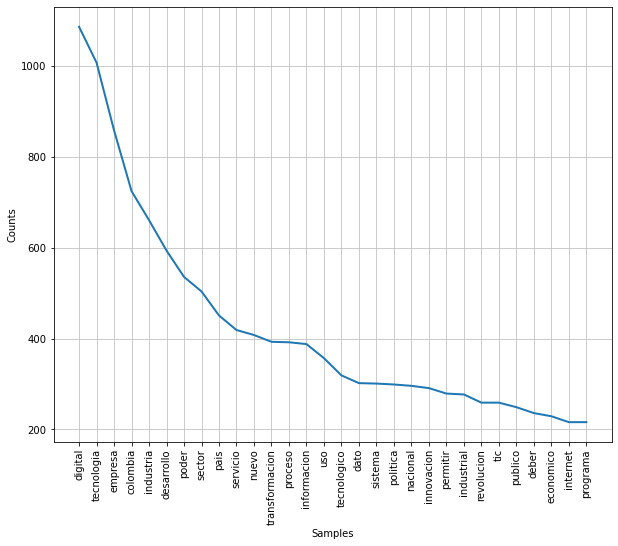

In [386]:
figura = plt.figure(figsize=(10,8))
fdist.plot(30, cumulative=False)
figura.savefig('Palabras más frecuentes docs.png')
plt.show()

### TF-IDF

In [387]:
tf_idf_list = []
for words in final_list:
    tf_idf_list.append(' '.join(words))
    

In [388]:
tf_idf_list_new = [(tf_idf_list[1],tf_idf_list[16],tf_idf_list[21],tf_idf_list[28],tf_idf_list[29],tf_idf_list[30],tf_idf_list[36],tf_idf_list[55],tf_idf_list[60],tf_idf_list[74],tf_idf_list[81],tf_idf_list[100],tf_idf_list[107],tf_idf_list[108],tf_idf_list[115],tf_idf_list[121],tf_idf_list[123],tf_idf_list[130],tf_idf_list[146]),
                  (tf_idf_list[23],tf_idf_list[31],tf_idf_list[68],tf_idf_list[75],tf_idf_list[80],tf_idf_list[95]),
                  (tf_idf_list[2],tf_idf_list[17],tf_idf_list[20],tf_idf_list[25],tf_idf_list[27],tf_idf_list[37],tf_idf_list[46],tf_idf_list[70],tf_idf_list[73],tf_idf_list[91],tf_idf_list[98],tf_idf_list[109],tf_idf_list[118],tf_idf_list[124],tf_idf_list[128],tf_idf_list[137],tf_idf_list[144]),
                  (tf_idf_list[3],tf_idf_list[112],tf_idf_list[117]),
                  (tf_idf_list[0],tf_idf_list[5],tf_idf_list[13],tf_idf_list[45],tf_idf_list[51],tf_idf_list[58],tf_idf_list[82],tf_idf_list[94],tf_idf_list[96],tf_idf_list[97],tf_idf_list[99],tf_idf_list[104],tf_idf_list[106],tf_idf_list[110],tf_idf_list[113],tf_idf_list[133],tf_idf_list[134],tf_idf_list[145]),
                  (tf_idf_list[24],tf_idf_list[33],tf_idf_list[40],tf_idf_list[69],tf_idf_list[83],tf_idf_list[85],tf_idf_list[87],tf_idf_list[93],tf_idf_list[125]),
                  (tf_idf_list[6],tf_idf_list[7],tf_idf_list[11],tf_idf_list[12],tf_idf_list[41],tf_idf_list[53],tf_idf_list[64],tf_idf_list[111]),
                  (tf_idf_list[35],tf_idf_list[39],tf_idf_list[62],tf_idf_list[71],tf_idf_list[88],tf_idf_list[102]),
                  (tf_idf_list[38]),
                  (tf_idf_list[8],tf_idf_list[32],tf_idf_list[52],tf_idf_list[63],tf_idf_list[66],tf_idf_list[76],tf_idf_list[84],tf_idf_list[89],tf_idf_list[90],tf_idf_list[135]),
                  (tf_idf_list[9],tf_idf_list[61],tf_idf_list[67]),
                  (tf_idf_list[42],tf_idf_list[50],tf_idf_list[103],tf_idf_list[114],tf_idf_list[119],tf_idf_list[126],tf_idf_list[132],tf_idf_list[138],tf_idf_list[142]),
                  (tf_idf_list[122],tf_idf_list[139]),
                  (tf_idf_list[18],tf_idf_list[22],tf_idf_list[34],tf_idf_list[54],tf_idf_list[92]),
                  (tf_idf_list[4],tf_idf_list[49],tf_idf_list[72],tf_idf_list[127],tf_idf_list[129]),
                  (tf_idf_list[48],tf_idf_list[65],tf_idf_list[120],tf_idf_list[140],tf_idf_list[147]),
                  (tf_idf_list[26],tf_idf_list[105],tf_idf_list[136]),
                  (tf_idf_list[10],tf_idf_list[15],tf_idf_list[43],tf_idf_list[47],tf_idf_list[77],tf_idf_list[79]),
                  (tf_idf_list[57],tf_idf_list[59],tf_idf_list[101],tf_idf_list[131],tf_idf_list[141],tf_idf_list[143]),
                  (tf_idf_list[44],tf_idf_list[116]),
                  (tf_idf_list[14],tf_idf_list[19],tf_idf_list[56],tf_idf_list[78],tf_idf_list[86])]


In [389]:
new_list = []
for s in range(len(tf_idf_list_new)):
    if s != 8:
        new_list.append(' '.join(tf_idf_list_new[s]))

In [390]:
new_list.append(tf_idf_list_new[8])

In [391]:
from sklearn.feature_extraction.text import TfidfVectorizer

def tfidf(text, vectorizer):
    doc_matrix = vectorizer.fit_transform(text)
    return pd.DataFrame(doc_matrix.toarray(), columns = vectorizer.get_feature_names())

vector =  TfidfVectorizer(stop_words = stop_words, norm="l1")

In [392]:
import warnings
warnings.filterwarnings("ignore")

data_fin = tfidf(new_list, vector) 
data_fin

abajo   abarcar  abastecimiento   abierto   abordar     abrir  \
0   0.000000  0.000160        0.000000  0.000121  0.000127  0.000681   
1   0.000000  0.000000        0.000968  0.000000  0.000000  0.000000   
2   0.000000  0.000533        0.000000  0.000000  0.000142  0.000000   
3   0.000000  0.000000        0.000000  0.000000  0.000000  0.000000   
4   0.000000  0.000346        0.000000  0.000000  0.000553  0.000739   
5   0.000000  0.000000        0.000000  0.001402  0.002065  0.000000   
6   0.000000  0.000000        0.000000  0.001554  0.002725  0.000728   
7   0.000000  0.000000        0.000000  0.000000  0.000000  0.000000   
8   0.000000  0.000337        0.000454  0.000256  0.000000  0.000000   
9   0.000000  0.000000        0.000000  0.002002  0.001053  0.000000   
10  0.000000  0.000000        0.000000  0.000189  0.000000  0.001062   
11  0.000000  0.000000        0.000000  0.001656  0.000000  0.000000   
12  0.000000  0.000000        0.000000  0.000709  0.000000  0.000000   
13  0.001081  0.000000        0.000861  0.000486  0.000000  0.000000   
14  0.000000  0.000479        0.000000  0.001816  0.000764  0.000000   
15  0.000000  0.000000        0.000000  0.000675  0.000000  0.000000   
16  0.000000  0.000833        0.000000  0.000000  0.000000  0.000000   
17  0.000000  0.000000        0.000000  0.000000  0.000560  0.000374   
18  0.000000  0.000000        0.000000  0.000000  0.001175  0.000000   
19  0.000000  0.001756        0.000000  0.000666  0.001402  0.000936   
20  0.000000  0.000000        0.000000  0.000000  0.004475  0.000000   

       abuso  academia  academico  accesible    acceso    accion    aceite  \
0   0.001618  0.001332   0.003696   0.000000  0.001130  0.000546  0.001078   
1   0.000000  0.000000   0.000000   0.000000  0.000784  0.000821  0.000000   
2   0.000000  0.001484   0.000426   0.000000  0.001646  0.002635  0.000000   
3   0.000000  0.000000   0.000000   0.000000  0.000542  0.001135  0.000000   
4   0.000000  0.000394   0.000000   0.000293  0.002264  0.002468  0.000000   
5   0.000000  0.000000   0.000295   0.000000  0.000201  0.000632  0.000000   
6   0.000000  0.000518   0.000545   0.000000  0.002974  0.001167  0.000000   
7   0.000000  0.000948   0.000000   0.000000  0.000000  0.000356  0.000000   
8   0.000000  0.000512   0.003772   0.000000  0.003858  0.002116  0.000000   
9   0.000000  0.000000   0.000000   0.000000  0.002155  0.000000  0.000000   
10  0.000000  0.000189   0.000199   0.000000  0.005831  0.000426  0.000000   
11  0.000000  0.000000   0.000000   0.000000  0.003565  0.002488  0.000000   
12  0.000000  0.000709   0.001492   0.000000  0.002035  0.002130  0.000000   
13  0.000000  0.000486   0.000000   0.000000  0.002091  0.003283  0.000000   
14  0.000000  0.000726   0.000382   0.000000  0.003649  0.001910  0.000000   
15  0.000000  0.000000   0.000711   0.000000  0.001454  0.000000  0.000000   
16  0.000000  0.000000   0.003989   0.000000  0.001360  0.014237  0.000000   
17  0.000000  0.001064   0.000560   0.000000  0.000573  0.001199  0.000000   
18  0.000000  0.000000   0.000000   0.000000  0.012816  0.000839  0.000000   
19  0.000000  0.000666   0.000000   0.000000  0.003824  0.000500  0.000000   
20  0.000000  0.000000   0.000000   0.000000  0.000000  0.000000  0.000000   

    acelerar   aceptar  acercamiento   acercar   aclarar  acompañar    acorde  \
0   0.000599  0.000000      0.000000  0.000319  0.000197   0.000134  0.000182   
1   0.000450  0.000000      0.000000  0.000000  0.000000   0.000000  0.000000   
2   0.000667  0.000000      0.000239  0.000000  0.000658   0.000748  0.000000   
3   0.000000  0.000000      0.000000  0.000000  0.000000   0.000000  0.002276   
4   0.000542  0.000000      0.000233  0.000173  0.000000   0.001458  0.000000   
5   0.000924  0.000000      0.000000  0.000370  0.000456   0.000000  0.000000   
6   0.000854  0.000918      0.000000  0.000683  0.000000   0.002298  0.000000   
7   0.000391  0.000000      0.000000  0.000000  0.000000 

### Reducción de dimensiones


In [393]:
import numpy as np
from sklearn.decomposition import PCA
pca = PCA(0.80)
principal_components = pca.fit_transform(data_fin)


In [394]:
newdata = pd.DataFrame(data = principal_components, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])

In [395]:
newdata

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,0.002462,-0.004687,-0.008276,-0.005897,-0.010087,0.001437,0.004314,0.010894,-0.011216,0.003097
1,-0.006842,-0.010578,0.014932,-0.023234,-0.003768,0.041616,-0.010843,-0.020678,0.007493,0.011175
2,-0.003182,-0.007307,-0.004135,-0.004788,-0.006303,0.004573,0.001000,0.007109,-0.014327,-0.001919
3,-0.009118,-0.021656,-0.043019,0.027421,0.049861,0.006238,-0.005780,-0.002278,-0.003307,0.009669
4,-0.005118,-0.007197,0.004497,-0.007161,-0.002057,0.003541,-0.001735,0.004404,-0.002212,-0.001686
5,0.001536,-0.011872,-0.005878,-0.011373,0.000190,0.006311,0.018695,0.000404,0.001179,-0.000494
6,0.003570,-0.001317,-0.014654,-0.012808,-0.008597,-0.011458,0.013484,-0.000166,0.003488,0.003868
7,-0.017238,-0.017603,0.059224,-0.017037,0.033761,-0.020813,0.010452,0.000407,-0.002032,0.006992
8,-0.007089,-0.000296,0.007536,0.006393,-0.005802,0.004768,-0.006553,0.000939,0.008377,-0.000832
9,-0.014233,0.014275,0.026556,0.056055,-0.020568,0.006747,0.016313,-0.010007,-0.005467,0.008850


In [396]:
print(data_fin.shape)
print(newdata.shape)

(21, 2696)
(21, 10)


In [397]:
per_var = np.round(pca.explained_variance_ratio_ *100, decimals = 1)
label_2 =['PC' + str(x) for x in range(1, len(per_var) + 1)] 

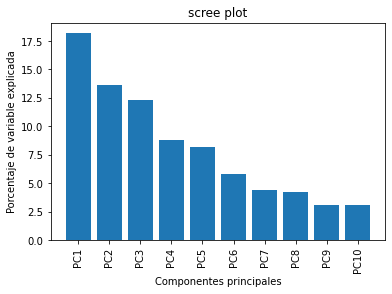

In [398]:
plt.bar(x = range(1, len(per_var)+1), height = per_var, tick_label = label_2)
plt.ylabel('Porcentaje de variable explicada')
plt.xlabel('Componentes principales')
plt.title('scree plot')
#plt.gcf().set_size_inches(15, 8)
plt.xticks(rotation=90)
plt.show()

### Clusterización - Kmeans

In [399]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
import sklearn.cluster as cluster
import numpy as np

K=range(1,21)
wss = []
for k in K:
    kmeans=cluster.KMeans(n_clusters=k,init="k-means++")
    kmeans=kmeans.fit(newdata) #data_fin
    wss_iter = kmeans.inertia_
    wss.append(wss_iter)
    
mycenters = pd.DataFrame({'Clusters' : K, 'WSS' : wss})
mycenters

,Clusters,WSS
0,1,0.054510
1,2,0.042633
2,3,0.036249
3,4,0.028083
4,5,0.022169
5,6,0.016759
6,7,0.012989
7,8,0.010065
8,9,0.007086
9,10,0.004850


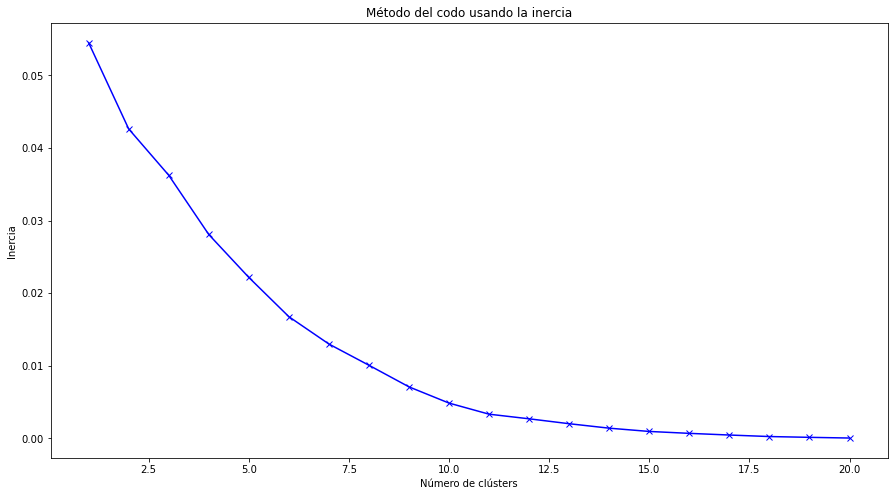

In [576]:
plt.plot(K, wss, 'bx-')

plt.xlabel("Número de clústers")
plt.ylabel("Inercia")
plt.title("Método del codo usando la inercia")
plt.gcf().set_size_inches(15, 8)
#plt.savefig("Método del codo Documentos.png")
plt.show()

In [622]:
true_k = 5 # Número final de clúster
model = KMeans(n_clusters=true_k, init='k-means++')
model.fit(newdata) #data_fin
labels = model.labels_
table = pd.DataFrame(list(zip(new_list,labels)),columns=['title','cluster'])
print(table.sort_values(by=['cluster']))

                                                title  cluster
7   en enero de el el foro economico mundial de de...        0
0   tecnologia convergente y el industria contribu...        1
1   uno situacion similar poder afrontar el empres...        1
2   colombia deber continuar con el implementacion...        1
17  el friedrichebertstiftung sugerir que él conte...        1
4   ahora bien en cuanto a el cadena de tro este s...        1
5   el industria ser uno nuevo esfera de el indust...        1
6   por que vincular el emprendimiento y el sosten...        1
15  en solo tres mes sofaso dar el salto hacia el ...        1
11  el primero decada de el siglo xxi haber estar ...        1
19  proposito de el estrategia digital de usaid se...        1
20  desde que él formular por primero vez en el añ...        2
18  el gobierno nacional a trave ministerio tecnol...        3
12  primero él avanzar en el consolidacion de espa...        4
13  el proceso de digitalizacion el adopcion de te...  

### Nube de Palabras

In [623]:
from wordcloud import WordCloud 

datos = {'cluster':labels,'content':new_list}
df = pd.DataFrame.from_dict(datos, orient='index')
df = df.transpose()


Cluster: 0
Titles
en enero de el el foro economico mundial de ded...


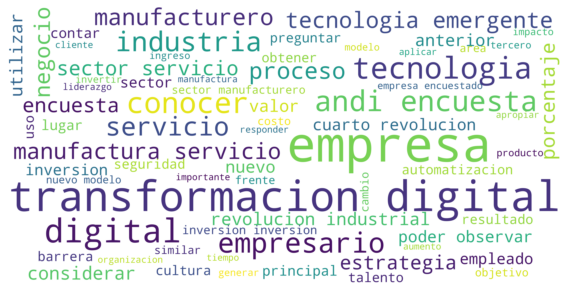

Cluster: 1
Titles
tecnologia convergente y el industria contribui...
uno situacion similar poder afrontar el empresa...
colombia deber continuar con el implementacion ...
ahora bien en cuanto a el cadena de tro este se...
el industria ser uno nuevo esfera de el industr...
por que vincular el emprendimiento y el sosteni...
el primero decada de el siglo xxi haber estar m...
en solo tres mes sofaso dar el salto hacia el t...
el friedrichebertstiftung sugerir que él contem...
proposito de el estrategia digital de usaid ser...


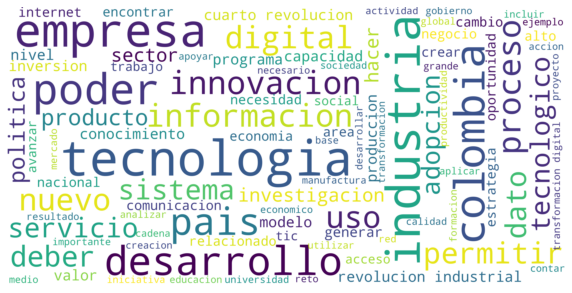

Cluster: 2
Titles
desde que él formular por primero vez en el año...


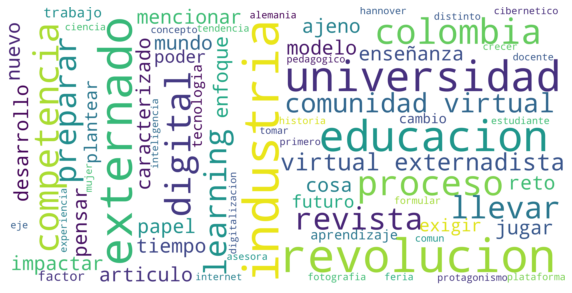

Cluster: 3
Titles
el gobierno nacional a trave ministerio tecnolo...


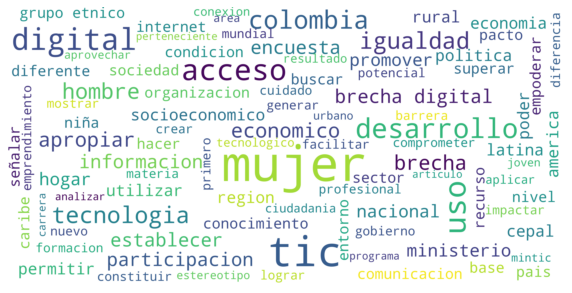

Cluster: 4
Titles
rotacion de personal calificar bajo inter por e...
para el foro economico mundial fem el competiti...
el tic impulsar el productividad de el informac...
para el estudio de el politica publico en mater...
primero él avanzar en el consolidacion de espac...
el proceso de digitalizacion el adopcion de tec...
desarrollo uso y de ciencia tecnologia e invest...
el uso de el dato y su a trave de sistema de in...


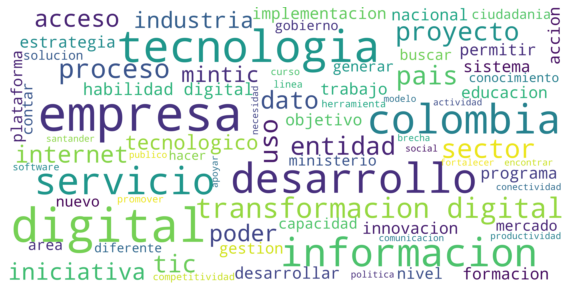

In [624]:
realclust = 5
for k in range(0,realclust):
    s = df[df.cluster==k]
    Text = s['content'].str.cat(sep=' ')
    Text = Text.lower()
    Text=' '.join([word for word in Text.split()])
    wordcloud = WordCloud(min_font_size = 13, max_font_size=70, max_words=150, background_color="white",scale=10, width=800, height=400,stopwords = stop_words).generate(Text)
    print('Cluster: {}'.format(k))
    print('Titles')
    titles = table[table.cluster==k]['title']
    print(titles.to_string(index=False))
    plt.figure(figsize=(10,7))
    plt.imshow(wordcloud, interpolation="bilinear", cmap="PuBuGn")
    plt.axis("off")
    #plt.savefig("cluster documentos " + str(k) +".png", dpi=500)
    plt.show()

### Gráfico de barras

Cluster: 0
Titles
en enero de el el foro economico mundial de ded...


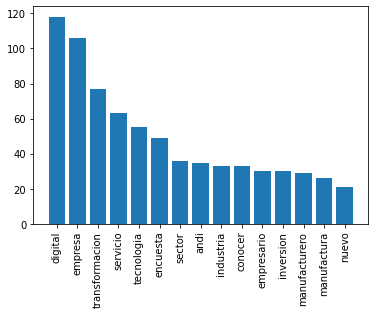

<Figure size 720x720 with 0 Axes>

Cluster: 1
Titles
tecnologia convergente y el industria contribui...
uno situacion similar poder afrontar el empresa...
colombia deber continuar con el implementacion ...
ahora bien en cuanto a el cadena de tro este se...
el industria ser uno nuevo esfera de el industr...
por que vincular el emprendimiento y el sosteni...
el primero decada de el siglo xxi haber estar m...
en solo tres mes sofaso dar el salto hacia el t...
el friedrichebertstiftung sugerir que él contem...
proposito de el estrategia digital de usaid ser...


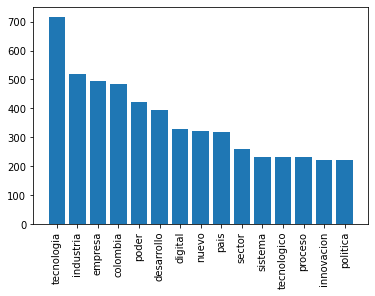

<Figure size 720x720 with 0 Axes>

Cluster: 2
Titles
desde que él formular por primero vez en el año...


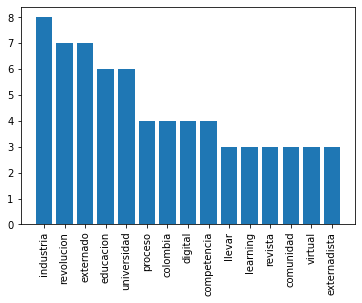

<Figure size 720x720 with 0 Axes>

Cluster: 3
Titles
el gobierno nacional a trave ministerio tecnolo...


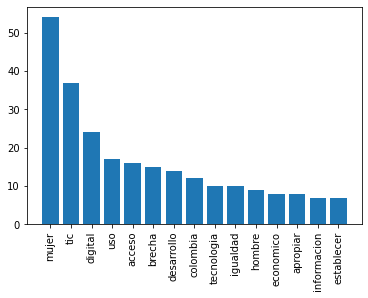

<Figure size 720x720 with 0 Axes>

Cluster: 4
Titles
rotacion de personal calificar bajo inter por e...
para el foro economico mundial fem el competiti...
el tic impulsar el productividad de el informac...
para el estudio de el politica publico en mater...
primero él avanzar en el consolidacion de espac...
el proceso de digitalizacion el adopcion de tec...
desarrollo uso y de ciencia tecnologia e invest...
el uso de el dato y su a trave de sistema de in...


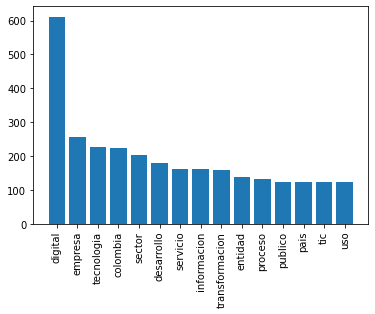

<Figure size 720x720 with 0 Axes>

In [626]:
from collections import Counter
import operator
import itertools 


for w in range(0,realclust):
    cont = df[df.cluster==w]
    New_Text = cont['content'].str.cat(sep=' ')
    New_Text =  New_Text.lower()
    New_Text = nltk.word_tokenize(New_Text)
    New_Text = [word for word in New_Text if not word in stop_words]
    print('Cluster: {}'.format(w))
    print('Titles')
    titles = table[table.cluster==w]['title']
    print(titles.to_string(index=False))
    common_words =  Counter(New_Text).most_common(15)
    dataf = pd.DataFrame(data = common_words)
    plt.bar(dataf[0], height=dataf[1])
    plt.xticks(rotation=90)
    plt.figure(figsize = (10,10))
    plt.show()
   